In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import os
import pandas as pd
import numpy as np
import csv
import io
import requests
import matplotlib.pyplot as plt
import datetime
os.chdir('/content/drive/My Drive/DataScience/data')

# Datasets

#### Coronavirus (COVID-19) Testing


In [3]:
url= "https://raw.githubusercontent.com/owid/covid-19-data/master/public/data/owid-covid-data.csv"
df_tests=pd.read_csv(url, error_bad_lines=False)
df_tests


,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,total_cases_per_million,new_cases_per_million,new_cases_smoothed_per_million,total_deaths_per_million,new_deaths_per_million,new_deaths_smoothed_per_million,reproduction_rate,icu_patients,icu_patients_per_million,hosp_patients,hosp_patients_per_million,weekly_icu_admissions,weekly_icu_admissions_per_million,weekly_hosp_admissions,weekly_hosp_admissions_per_million,total_tests,new_tests,total_tests_per_thousand,new_tests_per_thousand,new_tests_smoothed,new_tests_smoothed_per_thousand,tests_per_case,positive_rate,tests_units,stringency_index,population,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index
0,AFG,Asia,Afghanistan,2019-12-31,NaN,0.0,NaN,NaN,0.0,NaN,NaN,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,38928341.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.498
1,AFG,Asia,Afghanistan,2020-01-01,NaN,0.0,NaN,NaN,0.0,NaN,NaN,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,38928341.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.498
2,AFG,Asia,Afghanistan,2020-01-02,NaN,0.0,NaN,NaN,0.0,NaN,NaN,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,38928341.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.498
3,AFG,Asia,Afghanistan,2020-01-03,NaN,0.0,NaN,NaN,0.0,NaN,NaN,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,38928341.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.498
4,AFG,Asia,Afghanistan,2020-01-04,NaN,0.0,NaN,NaN,0.0,NaN,NaN,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,38928341.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.498
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59124,NaN,NaN,International,2020-11-21,696.0,NaN,NaN,7.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
59125,NaN,NaN,International,2020-11-22,696.0,NaN,NaN,7.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
59126,NaN,NaN,International,2020-11-23,696.0,NaN,NaN,7.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
59127,NaN,NaN,International,2020-11-24,696.0,NaN,NaN,7.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [4]:
df_tests.rename(columns={'location': 'Country', 'date' : 'Date'}, inplace=True)
df_tests.columns

Index(['iso_code', 'continent', 'Country', 'Date', 'total_cases', 'new_cases',
       'new_cases_smoothed', 'total_deaths', 'new_deaths',
       'new_deaths_smoothed', 'total_cases_per_million',
       'new_cases_per_million', 'new_cases_smoothed_per_million',
       'total_deaths_per_million', 'new_deaths_per_million',
       'new_deaths_smoothed_per_million', 'reproduction_rate', 'icu_patients',
       'icu_patients_per_million', 'hosp_patients',
       'hosp_patients_per_million', 'weekly_icu_admissions',
       'weekly_icu_admissions_per_million', 'weekly_hosp_admissions',
       'weekly_hosp_admissions_per_million', 'total_tests', 'new_tests',
       'total_tests_per_thousand', 'new_tests_per_thousand',
       'new_tests_smoothed', 'new_tests_smoothed_per_thousand',
       'tests_per_case', 'positive_rate', 'tests_units', 'stringency_index',
       'population', 'population_density', 'median_age', 'aged_65_older',
       'aged_70_older', 'gdp_per_capita', 'extreme_poverty',
      

In [5]:
df_tests['Date']=pd.to_datetime(df_tests['Date'], dayfirst=False)
df_tests.columns

Index(['iso_code', 'continent', 'Country', 'Date', 'total_cases', 'new_cases',
       'new_cases_smoothed', 'total_deaths', 'new_deaths',
       'new_deaths_smoothed', 'total_cases_per_million',
       'new_cases_per_million', 'new_cases_smoothed_per_million',
       'total_deaths_per_million', 'new_deaths_per_million',
       'new_deaths_smoothed_per_million', 'reproduction_rate', 'icu_patients',
       'icu_patients_per_million', 'hosp_patients',
       'hosp_patients_per_million', 'weekly_icu_admissions',
       'weekly_icu_admissions_per_million', 'weekly_hosp_admissions',
       'weekly_hosp_admissions_per_million', 'total_tests', 'new_tests',
       'total_tests_per_thousand', 'new_tests_per_thousand',
       'new_tests_smoothed', 'new_tests_smoothed_per_thousand',
       'tests_per_case', 'positive_rate', 'tests_units', 'stringency_index',
       'population', 'population_density', 'median_age', 'aged_65_older',
       'aged_70_older', 'gdp_per_capita', 'extreme_poverty',
      

In [6]:
# df_tests= df_tests[['Country','Date','total_cases','new_cases','total_deaths','new_deaths','new_tests','total_tests','total_tests','median_age','aged_65_older','aged_70_older','gdp_per_capita','extreme_poverty','diabetes_prevalence','female_smokers','male_smokers','handwashing_facilities','hospital_beds_per_thousand']]

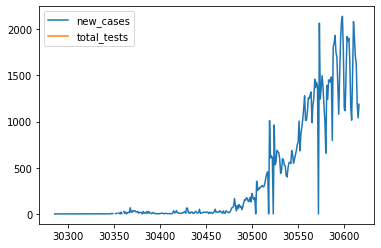

In [7]:
df_tests[df_tests['Country']=='Lebanon']
df_tests.loc[(df_tests['Country'] == 'Lebanon'), ['new_cases','total_tests']].plot()


In [8]:
df_tests['median_age'].count()

52553

#### OXFORD COVID-19 Government Response Tracker(OxCGRT)


In [9]:
import pandas as pd
url= "https://raw.githubusercontent.com/OxCGRT/covid-policy-tracker/master/data/OxCGRT_latest.csv"
df_policies=pd.read_csv(url, error_bad_lines=False)
df_policies

/usr/local/lib/python3.6/dist-packages/IPython/core/interactiveshell.py:2718: DtypeWarning: Columns (2,3) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


,CountryName,CountryCode,RegionName,RegionCode,Jurisdiction,Date,C1_School closing,C1_Flag,C2_Workplace closing,C2_Flag,C3_Cancel public events,C3_Flag,C4_Restrictions on gatherings,C4_Flag,C5_Close public transport,C5_Flag,C6_Stay at home requirements,C6_Flag,C7_Restrictions on internal movement,C7_Flag,C8_International travel controls,E1_Income support,E1_Flag,E2_Debt/contract relief,E3_Fiscal measures,E4_International support,H1_Public information campaigns,H1_Flag,H2_Testing policy,H3_Contact tracing,H4_Emergency investment in healthcare,H5_Investment in vaccines,H6_Facial Coverings,H6_Flag,M1_Wildcard,ConfirmedCases,ConfirmedDeaths,StringencyIndex,StringencyIndexForDisplay,StringencyLegacyIndex,StringencyLegacyIndexForDisplay,GovernmentResponseIndex,GovernmentResponseIndexForDisplay,ContainmentHealthIndex,ContainmentHealthIndexForDisplay,EconomicSupportIndex,EconomicSupportIndexForDisplay
0,Aruba,ABW,NaN,NaN,NAT_TOTAL,20200101,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,0.0,NaN,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,0.0,0.00,0.0,0.00,0.0,0.00,0.0,0.00,0.0,0.0
1,Aruba,ABW,NaN,NaN,NAT_TOTAL,20200102,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,0.0,NaN,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,0.0,0.00,0.0,0.00,0.0,0.00,0.0,0.00,0.0,0.0
2,Aruba,ABW,NaN,NaN,NAT_TOTAL,20200103,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,0.0,NaN,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,0.0,0.00,0.0,0.00,0.0,0.00,0.0,0.00,0.0,0.0
3,Aruba,ABW,NaN,NaN,NAT_TOTAL,20200104,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,0.0,NaN,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,0.0,0.00,0.0,0.00,0.0,0.00,0.0,0.00,0.0,0.0
4,Aruba,ABW,NaN,NaN,NAT_TOTAL,20200105,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,0.0,NaN,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,0.0,0.00,0.0,0.00,0.0,0.00,0.0,0.00,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
87445,Zimbabwe,ZWE,NaN,NaN,NAT_TOTAL,20201121,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9120.0,265.0,NaN,67.59,NaN,73.81,NaN,58.33,NaN,63.89,NaN,25.0
87446,Zimbabwe,ZWE,NaN,NaN,NAT_TOTAL,20201122,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9172.0,265.0,NaN,67.59,NaN,73.81,NaN,58.33,NaN,63.89,NaN,25.0
87447,Zimbabwe,ZWE,NaN,NaN,NAT_TOTAL,20201123,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9220.0,268.0,NaN,67.59,NaN,73.81,NaN,58.33,NaN,63.89,NaN,25.0
87448,Zimbabwe,ZWE,NaN,NaN,NAT_TOTAL,20201124,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9308.0,273.0,NaN,67.59,NaN,73.81,NaN,58.33,NaN,63.89,NaN,25.0


In [10]:
df_policies.rename(columns={'CountryName': 'Country', 'RegionName' : 'State'}, inplace=True)

In [11]:
df_policies['Date'] = df_policies['Date'].map(str)
df_policies['Date']=pd.to_datetime(df_policies['Date'], dayfirst=False)


In [12]:
df_policies.columns

Index(['Country', 'CountryCode', 'State', 'RegionCode', 'Jurisdiction', 'Date',
       'C1_School closing', 'C1_Flag', 'C2_Workplace closing', 'C2_Flag',
       'C3_Cancel public events', 'C3_Flag', 'C4_Restrictions on gatherings',
       'C4_Flag', 'C5_Close public transport', 'C5_Flag',
       'C6_Stay at home requirements', 'C6_Flag',
       'C7_Restrictions on internal movement', 'C7_Flag',
       'C8_International travel controls', 'E1_Income support', 'E1_Flag',
       'E2_Debt/contract relief', 'E3_Fiscal measures',
       'E4_International support', 'H1_Public information campaigns',
       'H1_Flag', 'H2_Testing policy', 'H3_Contact tracing',
       'H4_Emergency investment in healthcare', 'H5_Investment in vaccines',
       'H6_Facial Coverings', 'H6_Flag', 'M1_Wildcard', 'ConfirmedCases',
       'ConfirmedDeaths', 'StringencyIndex', 'StringencyIndexForDisplay',
       'StringencyLegacyIndex', 'StringencyLegacyIndexForDisplay',
       'GovernmentResponseIndex', 'GovernmentRes

In [13]:
# df_policies.rename(columns={'C1_School closing': 'school_closing', 'C2_Workplace closing' : 'workplace_closing',
#                             'C3_Cancel public events': 'cancel_public_events', 'C4_Restrictions on gatherings' : 'restrictions_on_gathering',
#                             'C5_Close public transport': 'close_public_transport', 
#                             'C6_Stay at home requirements': 'stay_at_home', 'C7_Restrictions on internal movement' : 'restrictions_on_internal_movement',
#                             'C8_International travel controls': 'international_travel_controls', 'E1_Income support' : 'income_support',
#                             'E2_Debt/contract relief': 'debt_relief', 'E3_Fiscal measures' : 'fiscal _measures',
#                             'E4_International support': 'international_support', 'H1_Public information campaigns' : 'public_information_campaigns',
#                             'H2_Testing policy': 'testing_policy', 'H3_Contact tracing' : 'contact_tracing',
#                             'H4_Emergency investment in healthcare': 'emergency_investment_in_healthcare', 'H5_Investment in vaccines' : 'investment_in_vaccines'}
#                    , inplace=True)

In [14]:
df_policies.columns

Index(['Country', 'CountryCode', 'State', 'RegionCode', 'Jurisdiction', 'Date',
       'C1_School closing', 'C1_Flag', 'C2_Workplace closing', 'C2_Flag',
       'C3_Cancel public events', 'C3_Flag', 'C4_Restrictions on gatherings',
       'C4_Flag', 'C5_Close public transport', 'C5_Flag',
       'C6_Stay at home requirements', 'C6_Flag',
       'C7_Restrictions on internal movement', 'C7_Flag',
       'C8_International travel controls', 'E1_Income support', 'E1_Flag',
       'E2_Debt/contract relief', 'E3_Fiscal measures',
       'E4_International support', 'H1_Public information campaigns',
       'H1_Flag', 'H2_Testing policy', 'H3_Contact tracing',
       'H4_Emergency investment in healthcare', 'H5_Investment in vaccines',
       'H6_Facial Coverings', 'H6_Flag', 'M1_Wildcard', 'ConfirmedCases',
       'ConfirmedDeaths', 'StringencyIndex', 'StringencyIndexForDisplay',
       'StringencyLegacyIndex', 'StringencyLegacyIndexForDisplay',
       'GovernmentResponseIndex', 'GovernmentRes

In [15]:
# df_policies=df_policies[['Country','State','Date','school_closing','workplace_closing','cancel_public_events','restrictions_on_gathering'
# ,'close_public_transport','stay_at_home','restrictions_on_internal_movement','international_travel_controls','income_support',
# 'debt_relief','fiscal _measures','international_support','international_support','public_information_campaigns','testing_policy',
# 'contact_tracing','emergency_investment_in_healthcare','investment_in_vaccines']]

#### Population by Country - 2020

In [16]:
path= "population.csv"
df_population=pd.read_csv(path,error_bad_lines=False)
df_population

,Country (or dependency),Population (2020),Yearly Change,Net Change,Density (P/Km²),Land Area (Km²),Migrants (net),Fert. Rate,Med. Age,Urban Pop %,World Share
0,China,1440297825,0.39 %,5540090,153,9388211,-348399.0,1.7,38,61 %,18.47 %
1,India,1382345085,0.99 %,13586631,464,2973190,-532687.0,2.2,28,35 %,17.70 %
2,United States,331341050,0.59 %,1937734,36,9147420,954806.0,1.8,38,83 %,4.25 %
3,Indonesia,274021604,1.07 %,2898047,151,1811570,-98955.0,2.3,30,56 %,3.51 %
4,Pakistan,221612785,2.00 %,4327022,287,770880,-233379.0,3.6,23,35 %,2.83 %
...,...,...,...,...,...,...,...,...,...,...,...
230,Montserrat,4993,0.06 %,3,50,100,NaN,N.A.,N.A.,10 %,0.00 %
231,Falkland Islands,3497,3.05 %,103,0,12170,NaN,N.A.,N.A.,66 %,0.00 %
232,Niue,1628,0.68 %,11,6,260,NaN,N.A.,N.A.,46 %,0.00 %
233,Tokelau,1360,1.27 %,17,136,10,NaN,N.A.,N.A.,0 %,0.00 %


In [17]:
df_population.rename(columns={'Country (or dependency)': 'Country'}, inplace=True)
df_population.columns

Index(['Country', 'Population (2020)', 'Yearly Change', 'Net Change',
       'Density (P/Km²)', 'Land Area (Km²)', 'Migrants (net)', 'Fert. Rate',
       'Med. Age', 'Urban Pop %', 'World Share'],
      dtype='object')

In [18]:
df_population.rename(columns={'Population (2020)': 'population', 'Yearly Change' : 'yearly_change', 'Net Change':'net_change',
                            'Density (P/Km²)': 'density_P/Km²', 'Land Area (Km²)' : 'land_area_Km²',
                            'Migrants (net)': 'migrants_net', 'Yearly Change' : 'yearly_change',
                            'Fert. Rate': 'fert_Rate', 'Med. Age' : 'med_age',
                            'Urban Pop %': 'urban_pop_%', 'World Share' : 'world_share'                       
                            }, inplace=True)

In [19]:
df_population['med_age']=df_population['med_age'].replace('N.A.', np.nan)
print(df_population['med_age'].count())
df_population['med_age']=df_population['med_age'].replace('N.A.', np.nan)
print(df_population['med_age'].count())
df_population['density_P/Km²']=df_population['density_P/Km²'].replace('0.0', np.nan)
print(df_population['density_P/Km²'].count())
df_population['land_area_Km²']=df_population['land_area_Km²'].replace('0.0', np.nan)
print(df_population['land_area_Km²'].count())

201
201
235
235


In [20]:
del df_population['med_age'] #we will take this field from tests data set, 85% missing here

In [21]:
df_population.columns

Index(['Country', 'population', 'yearly_change', 'net_change', 'density_P/Km²',
       'land_area_Km²', 'migrants_net', 'fert_Rate', 'urban_pop_%',
       'world_share'],
      dtype='object')

#### Global Historical Climatology Network‐Daily (GHCN‐D) dataset

In [22]:
import pandas as pd
url= "https://storage.googleapis.com/covid19-open-data/v2/weather.csv"
df_weather = pd.read_csv(url, sep=',', error_bad_lines=False)
df_weather

,date,key,noaa_station,noaa_distance,average_temperature,minimum_temperature,maximum_temperature,rainfall,snowfall,dew_point,relative_humidity
0,2020-01-01,AD,8117099999,39.866801,6.201389,1.930556,10.743056,1.415143,NaN,1.597222,74.345734
1,2020-01-01,AE,41216099999,16.303110,21.261111,16.216667,26.083333,0.000000,NaN,11.555556,54.350613
2,2020-01-01,AF,40942099999,85.393075,5.027778,0.444444,9.555556,0.000000,NaN,-4.083333,55.903534
3,2020-01-01,AF_BAL,40911099999,8.359524,5.930556,0.798611,8.930556,0.000000,NaN,1.722222,74.572882
4,2020-01-01,AF_BAM,40948099999,180.669856,2.788889,-0.322222,5.988889,0.000000,NaN,-1.311111,75.079524
...,...,...,...,...,...,...,...,...,...,...,...
6617798,2020-11-19,VE_U,78988000412,212.085470,26.777778,26.000000,28.000000,0.000000,NaN,23.555556,82.540256
6617799,2020-11-19,VE_X,78988000412,290.815840,26.777778,26.000000,28.000000,0.000000,NaN,23.555556,82.540256
6617800,2020-11-19,VE_Y,78970011634,218.478426,25.472222,24.500000,26.500000,0.000000,NaN,22.750000,84.928475
6617801,2020-11-19,VG,78543011640,53.839901,26.277778,25.611111,26.972222,0.000000,NaN,23.055556,82.496304


In [23]:
url= "https://storage.googleapis.com/covid19-open-data/v2/index.csv"
df_key = pd.read_csv(url, sep=',', error_bad_lines=False)
df_key

,key,wikidata,datacommons,country_code,country_name,subregion1_code,subregion1_name,subregion2_code,subregion2_name,locality_code,locality_name,3166-1-alpha-2,3166-1-alpha-3,aggregation_level
0,AD,Q228,country/AND,AD,Andorra,NaN,NaN,NaN,NaN,NaN,NaN,AD,AND,0
1,AE,Q878,country/ARE,AE,United Arab Emirates,NaN,NaN,NaN,NaN,NaN,NaN,AE,ARE,0
2,AF,Q889,country/AFG,AF,Afghanistan,NaN,NaN,NaN,NaN,NaN,NaN,AF,AFG,0
3,AF_BAL,Q121104,NaN,AF,Afghanistan,BAL,Balkh,NaN,NaN,NaN,NaN,AF,AFG,1
4,AF_BAM,Q171382,NaN,AF,Afghanistan,BAM,Bamyan,NaN,NaN,NaN,NaN,AF,AFG,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21406,ZA_WC_DC3,Q1899307,NaN,ZA,South Africa,WC,Western Cape,DC3,Overberg,NaN,NaN,ZA,ZAF,2
21407,ZA_WC_DC4,Q220249,NaN,ZA,South Africa,WC,Western Cape,DC4,Garden Route,NaN,NaN,ZA,ZAF,2
21408,ZA_WC_DC5,Q1053888,NaN,ZA,South Africa,WC,Western Cape,DC5,Central Karoo,NaN,NaN,ZA,ZAF,2
21409,ZM,Q953,country/ZMB,ZM,Zambia,NaN,NaN,NaN,NaN,NaN,NaN,ZM,ZMB,0


In [24]:
df_weather = df_weather.merge(df_key, how='left', on=['key'])

In [25]:
df_weather['date']=pd.to_datetime(df_weather['date'], dayfirst=False)

In [26]:
df_weather.rename(columns={'country_name': 'Country', 'date' : 'Date','subregion1_name':'State'}, inplace=True)

In [27]:
df_weather.columns

Index(['Date', 'key', 'noaa_station', 'noaa_distance', 'average_temperature',
       'minimum_temperature', 'maximum_temperature', 'rainfall', 'snowfall',
       'dew_point', 'relative_humidity', 'wikidata', 'datacommons',
       'country_code', 'Country', 'subregion1_code', 'State',
       'subregion2_code', 'subregion2_name', 'locality_code', 'locality_name',
       '3166-1-alpha-2', '3166-1-alpha-3', 'aggregation_level'],
      dtype='object')

In [28]:
# df_weather=df_weather[['Country','State','Date','average_temperature','minimum_temperature','maximum_temperature'
# ,'rainfall','snowfall','relative_humidity']]

#### Country Health Indicators dataset

In [29]:
path= "country_health_indicators.csv"
df_health = pd.read_csv(path)
df_health

,Country_Region,first_1ConfirmedCases,first_1Fatalities,first_10ConfirmedCases,first_50ConfirmedCases,first_100ConfirmedCases,cases_growth,death_growth,Cardiovascular diseases (%),Cancers (%),"Diabetes, blood, & endocrine diseases (%)",Respiratory diseases (%),Liver disease (%),Diarrhea & common infectious diseases (%),Musculoskeletal disorders (%),HIV/AIDS and tuberculosis (%),Malaria & neglected tropical diseases (%),Nutritional deficiencies (%),pneumonia-death-rates,Share of deaths from smoking (%),alcoholic_beverages,animal_fats,animal_products,"aquatic_products,_other",cereals_-_excluding_beer,eggs,"fish,_seafood",fruits_-_excluding_wine,meat,milk_-_excluding_butter,miscellaneous,offals,oilcrops,pulses,spices,starchy_roots,stimulants,sugar_&_sweeteners,treenuts,vegetable_oils,vegetables,vegetal_products,hospital_beds_per10k,hospital_density,nbr_surgeons,nbr_obstetricians,nbr_anaesthesiologists,medical_doctors_per10k,school_closure,bcg_coverage,bcg_year_delta,population,median age,population growth rate,birth rate,death rate,net migration rate,maternal mortality rate,infant mortality rate,life expectancy at birth,total fertility rate,obesity - adult prevalence rate,school_shutdown_1case,school_shutdown_10case,school_shutdown_50case,school_shutdown_1death,FF_DayOfYear,case1_DayOfYear,case10_DayOfYear,case50_DayOfYear
0,Afghanistan,2020-02-24,2020-03-22,2020-03-14,2020-03-24,2020-03-27,0.174179,0.083333,8.953006,3.372082,5.273280,1.963170,0.498116,15.825522,1.962412,2.938014,1.393345,1.770030,70.614333,3.56,0.0,34.0,191.0,NaN,1484.0,6.0,0.0,59.0,48.0,98.0,1.0,5.0,7.0,20.0,4.0,13.0,3.0,89.0,5.0,92.0,30.0,1809.0,5.00,0.085,NaN,NaN,8.0,2.840,2020-03-14,86.0,5.0,52.8,19.5,2.38,36.7,12.7,-0.1,638.0,104.3,52.8,4.82,5.5,19.0,-0.0,-10.0,-8.0,82.0,55,74.0,84.0
1,Albania,2020-03-09,2020-03-11,2020-03-10,2020-03-16,2020-03-23,0.068699,0.130051,27.016784,13.225390,4.571592,3.251425,1.122277,2.614149,8.372171,0.051632,0.019658,0.980691,12.241504,19.09,62.0,72.0,1094.0,0.0,1102.0,55.0,10.0,265.0,263.0,676.0,4.0,18.0,74.0,55.0,0.0,86.0,17.0,234.0,27.0,192.0,187.0,2305.0,28.88,0.280,NaN,45.0,NaN,11.998,2020-03-11,99.0,5.0,79.0,34.3,0.28,13.0,7.1,-3.3,15.0,10.8,79.0,1.53,21.7,2.0,1.0,-5.0,-0.0,71.0,69,70.0,76.0
2,Algeria,2020-02-25,2020-03-12,2020-03-04,2020-03-16,2020-03-21,0.158588,0.228578,17.005476,6.481729,8.614000,3.475417,0.926308,3.809944,8.204561,0.390351,0.124510,1.188142,15.996728,10.92,6.0,13.0,404.0,0.0,1675.0,28.0,8.0,213.0,84.0,267.0,7.0,4.0,18.0,73.0,8.0,129.0,10.0,267.0,15.0,386.0,137.0,2945.0,19.00,NaN,3204.0,599.0,825.0,18.300,2020-03-12,99.0,5.0,77.5,28.9,1.52,20.0,4.4,-0.9,112.0,17.6,77.5,2.59,27.4,16.0,8.0,-4.0,-0.0,72.0,56,64.0,76.0
3,Andorra,2020-03-02,2020-03-22,2020-03-17,2020-03-19,2020-03-22,0.082774,0.345238,13.784688,17.879279,4.381889,4.771667,1.561389,2.507505,13.608032,0.334845,0.002159,0.340551,18.236080,14.24,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2020-03-16,NaN,NaN,83.0,46.2,-0.06,7.0,7.7,0.0,NaN,3.5,83.0,1.43,25.6,14.0,-1.0,-3.0,-6.0,82.0,62,77.0,79.0
4,Angola,2020-03-20,2020-03-29,NaN,NaN,NaN,0.132143,0.000000,4.480300,3.011632,2.733065,1.711981,1.439695,20.527999,1.839105,9.101147,6.213008,5.597667,94.471007,4.70,88.0,12.0,213.0,0.0,833.0,2.0,38.0,105.0,133.0,23.0,3.0,5.0,49.0,68.0,0.0,573.0,2.0,125.0,0.0,194.0,16.0,2057.0,8.00,0.000,NaN,NaN,NaN,2.149,2020-03-24,79.0,5.0,61.3,15.9,3.43,42.7,8.5,-0.2,241.0,62.3,61.3,5.96,8.2,4.0,NaN,NaN,-5.0,89.0,80,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
175,Venezuela,2020-03-14,2020-03-27,2020-03-15,2020-03-21,2020-03-26,0.054474,0.361111,12.951494,9.719900,8.146976,2.856847,1.400547,4.729301,4.950649,1.615396,1.023029,0.672916,19.864598,9.18,38.0,27

In [30]:
df_health.rename(columns={'Country_Region': 'Country'}, inplace=True)
df_health.columns

Index(['Country', 'first_1ConfirmedCases', 'first_1Fatalities',
       'first_10ConfirmedCases', 'first_50ConfirmedCases',
       'first_100ConfirmedCases', 'cases_growth', 'death_growth',
       'Cardiovascular diseases (%)', 'Cancers (%)',
       'Diabetes, blood, & endocrine diseases (%)', 'Respiratory diseases (%)',
       'Liver disease (%)', 'Diarrhea & common infectious diseases (%)',
       'Musculoskeletal disorders (%)', 'HIV/AIDS and tuberculosis (%)',
       'Malaria & neglected tropical diseases (%)',
       'Nutritional deficiencies (%)', 'pneumonia-death-rates',
       'Share of deaths from smoking (%)', 'alcoholic_beverages',
       'animal_fats', 'animal_products', 'aquatic_products,_other',
       'cereals_-_excluding_beer', 'eggs', 'fish,_seafood',
       'fruits_-_excluding_wine', 'meat', 'milk_-_excluding_butter',
       'miscellaneous', 'offals', 'oilcrops', 'pulses', 'spices',
       'starchy_roots', 'stimulants', 'sugar_&_sweeteners', 'treenuts',
       'vegetab

In [31]:
df_health.rename(columns={'first_1ConfirmedCases': 'first_confirmed_case','first_1Fatalities': 'first_fatalities',
                          'Cardiovascular diseases (%)': 'cardiovascular_diseases_%','Cancers (%)': 'cancers_%',
                          'Diabetes, blood, & endocrine diseases (%)': 'diabetes_blood_endocrine_diseases_%'
                          ,'Respiratory diseases (%)': 'respiratory_diseases_%',
                          'Liver disease (%)': 'liver_disease_%',
                          'Diarrhea & common infectious diseases (%)': 'diarrhea_common_infectious_diseases_%',
                          'Musculoskeletal disorders (%)': 'musculoskeletal_disorders_%'
                          ,'HIV/AIDS and tuberculosis (%)': 'HIV/AIDS_tuberculosis_%',
                          'Malaria & neglected tropical diseases (%)': 'malaria_neglected_tropical_diseases_%'
                          ,'Nutritional deficiencies (%)': 'nutritional_deficiencies_%',
                          'Share of deaths from smoking (%)':'share_of_deaths_from_smoking_%'}
                 , inplace=True)

In [32]:
df_health.columns

Index(['Country', 'first_confirmed_case', 'first_fatalities',
       'first_10ConfirmedCases', 'first_50ConfirmedCases',
       'first_100ConfirmedCases', 'cases_growth', 'death_growth',
       'cardiovascular_diseases_%', 'cancers_%',
       'diabetes_blood_endocrine_diseases_%', 'respiratory_diseases_%',
       'liver_disease_%', 'diarrhea_common_infectious_diseases_%',
       'musculoskeletal_disorders_%', 'HIV/AIDS_tuberculosis_%',
       'malaria_neglected_tropical_diseases_%', 'nutritional_deficiencies_%',
       'pneumonia-death-rates', 'share_of_deaths_from_smoking_%',
       'alcoholic_beverages', 'animal_fats', 'animal_products',
       'aquatic_products,_other', 'cereals_-_excluding_beer', 'eggs',
       'fish,_seafood', 'fruits_-_excluding_wine', 'meat',
       'milk_-_excluding_butter', 'miscellaneous', 'offals', 'oilcrops',
       'pulses', 'spices', 'starchy_roots', 'stimulants', 'sugar_&_sweeteners',
       'treenuts', 'vegetable_oils', 'vegetables', 'vegetal_products',

In [33]:
df_health=df_health[['Country','first_confirmed_case','first_fatalities','cardiovascular_diseases_%','cancers_%',
                     'diabetes_blood_endocrine_diseases_%','respiratory_diseases_%','liver_disease_%','diarrhea_common_infectious_diseases_%',
                     'musculoskeletal_disorders_%','HIV/AIDS_tuberculosis_%','malaria_neglected_tropical_diseases_%','nutritional_deficiencies_%',
                     'pneumonia-death-rates','share_of_deaths_from_smoking_%','hospital_beds_per10k','hospital_density','nbr_surgeons',
                     'nbr_obstetricians','nbr_anaesthesiologists','medical_doctors_per10k']]

# Combining all datasets

##### Policies and tests joining

In [34]:
df = df_policies.merge(df_tests, how='left', on=['Country','Date'])

##### Joining the weather

In [35]:
countries= set(df_weather['Country'].unique())

In [36]:
countries

{'Afghanistan',
 'Albania',
 'Algeria',
 'American Samoa',
 'Andorra',
 'Angola',
 'Anguilla',
 'Antarctica',
 'Antigua and Barbuda',
 'Argentina',
 'Armenia',
 'Aruba',
 'Australia',
 'Austria',
 'Azerbaijan',
 'Bahamas',
 'Bahrain',
 'Bangladesh',
 'Barbados',
 'Belarus',
 'Belgium',
 'Belize',
 'Benin',
 'Bermuda',
 'Bhutan',
 'Bolivia',
 'Bosnia and Herzegovina',
 'Botswana',
 'Brazil',
 'British Indian Ocean Territory',
 'British Virgin Islands',
 'Brunei',
 'Bulgaria',
 'Burkina Faso',
 'Burundi',
 'Cambodia',
 'Cameroon',
 'Canada',
 'Cape Verde',
 'Caribbean Netherlands',
 'Cayman Islands',
 'Chad',
 'Chile',
 'China',
 'Christmas Island',
 'Cocos Islands',
 'Colombia',
 'Comoros',
 'Cook Islands',
 'Costa Rica',
 'Croatia',
 'Cuba',
 'Curaçao',
 'Cyprus',
 'Czech Republic',
 'Democratic Republic of the Congo',
 'Denmark',
 'Djibouti',
 'Dominica',
 'Dominican Republic',
 'East Timor',
 'Ecuador',
 'Egypt',
 'El Salvador',
 'Equatorial Guinea',
 'Eritrea',
 'Estonia',
 'Ethiopi

In [37]:
df_weather['Country']=df_weather['Country'].replace(to_replace='United States of America',value='United States') 
df = df.merge(df_weather, how='left', on=['Country','Date','State'])
df_weather['State']=df_weather['State'].fillna(' ')
df['State']=df['State'].fillna(' ')

In [38]:
df=df.groupby(['Country','Date','State']).first()

In [39]:
set(df_weather['Country']=='United States')

{False, True}

In [40]:
df=pd.DataFrame(df.to_records())

In [41]:
df

,Country,Date,State,CountryCode,RegionCode,Jurisdiction,C1_School closing,C1_Flag,C2_Workplace closing,C2_Flag,C3_Cancel public events,C3_Flag,C4_Restrictions on gatherings,C4_Flag,C5_Close public transport,C5_Flag,C6_Stay at home requirements,C6_Flag,C7_Restrictions on internal movement,C7_Flag,C8_International travel controls,E1_Income support,E1_Flag,E2_Debt/contract relief,E3_Fiscal measures,E4_International support,H1_Public information campaigns,H1_Flag,H2_Testing policy,H3_Contact tracing,H4_Emergency investment in healthcare,H5_Investment in vaccines,H6_Facial Coverings,H6_Flag,M1_Wildcard,ConfirmedCases,ConfirmedDeaths,StringencyIndex,StringencyIndexForDisplay,StringencyLegacyIndex,...,tests_per_case,positive_rate,tests_units,stringency_index,population,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,key,noaa_station,noaa_distance,average_temperature,minimum_temperature,maximum_temperature,rainfall,snowfall,dew_point,relative_humidity,wikidata,datacommons,country_code,subregion1_code,subregion2_code,subregion2_name,locality_code,locality_name,3166-1-alpha-2,3166-1-alpha-3,aggregation_level
0,Afghanistan,2020-01-01,,AFG,NaN,NAT_TOTAL,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,0.0,NaN,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,0.0,NaN,NaN,0.0,0.0,0.0,0.00,0.0,...,NaN,NaN,NaN,0.0,38928341.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.498,AF,4.094210e+10,85.393075,5.027778,0.444444,9.555556,0.000,NaN,-4.083333,55.903534,Q889,country/AFG,AF,NaN,NaN,NaN,NaN,NaN,AF,AFG,0.0
1,Afghanistan,2020-01-02,,AFG,NaN,NAT_TOTAL,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,0.0,NaN,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,0.0,NaN,NaN,0.0,0.0,0.0,0.00,0.0,...,NaN,NaN,NaN,0.0,38928341.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.498,AF,4.094210e+10,85.393075,2.194444,-0.805556,6.194444,1.143,NaN,-1.250000,78.143671,Q889,country/AFG,AF,NaN,NaN,NaN,NaN,NaN,AF,AFG,0.0
2,Afghanistan,2020-01-03,,AFG,NaN,NAT_TOTAL,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,0.0,NaN,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,0.0,NaN,NaN,0.0,0.0,0.0,0.00,0.0,...,NaN,NaN,NaN,0.0,38928341.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.498,AF,4.094210e+10,85.393075,1.916667,-2.750000,7.000000,4.953,NaN,-1.416667,79.131404,Q889,country/AFG,AF,NaN,NaN,NaN,NaN,NaN,AF,AFG,0.0
3,Afghanistan,2020-01-04,,AFG,NaN,NAT_TOTAL,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,0.0,NaN,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,0.0,NaN,NaN,0.0,0.0,0.0,0.00,0.0,...,NaN,NaN,NaN,0.0,38928341.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.498,AF,4.094210e+10,85.393075,1.888889,-2.166667,5.277778,6.096,NaN,-2.111111,74.746707,Q889,country/AFG,AF,NaN,NaN,NaN,NaN,NaN,AF,AFG,0.0
4,Afghanistan,2020-01-05,,AFG,NaN,NAT_TOTAL,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,0.0,NaN,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,0.0,NaN,NaN,0.0,0.0,0.0,0.00,0.0,...,NaN,NaN,NaN,0.0,38928341.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.498,AF,4.094210e+10,85.393075,1.500000,-0.750000,2.944444,2.413,NaN,-0.833333,84.431231,Q889,country/AFG,AF,NaN,NaN,NaN,NaN,NaN,AF,AFG,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
87445,Zimbabwe,2020-11-21,,ZWE,NaN,NAT_TOTAL,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9120.0,265.0,NaN,67.59,NaN,...,18.614,0.054,tests perfo

In [42]:
df.columns

Index(['Country', 'Date', 'State', 'CountryCode', 'RegionCode', 'Jurisdiction',
       'C1_School closing', 'C1_Flag', 'C2_Workplace closing', 'C2_Flag',
       ...
       'datacommons', 'country_code', 'subregion1_code', 'subregion2_code',
       'subregion2_name', 'locality_code', 'locality_name', '3166-1-alpha-2',
       '3166-1-alpha-3', 'aggregation_level'],
      dtype='object', length=116)

In [43]:
df.describe()

,C1_School closing,C1_Flag,C2_Workplace closing,C2_Flag,C3_Cancel public events,C3_Flag,C4_Restrictions on gatherings,C4_Flag,C5_Close public transport,C5_Flag,C6_Stay at home requirements,C6_Flag,C7_Restrictions on internal movement,C7_Flag,C8_International travel controls,E1_Income support,E1_Flag,E2_Debt/contract relief,E3_Fiscal measures,E4_International support,H1_Public information campaigns,H1_Flag,H2_Testing policy,H3_Contact tracing,H4_Emergency investment in healthcare,H5_Investment in vaccines,H6_Facial Coverings,H6_Flag,M1_Wildcard,ConfirmedCases,ConfirmedDeaths,StringencyIndex,StringencyIndexForDisplay,StringencyLegacyIndex,StringencyLegacyIndexForDisplay,GovernmentResponseIndex,GovernmentResponseIndexForDisplay,ContainmentHealthIndex,ContainmentHealthIndexForDisplay,EconomicSupportIndex,...,hosp_patients,hosp_patients_per_million,weekly_icu_admissions,weekly_icu_admissions_per_million,weekly_hosp_admissions,weekly_hosp_admissions_per_million,total_tests,new_tests,total_tests_per_thousand,new_tests_per_thousand,new_tests_smoothed,new_tests_smoothed_per_thousand,tests_per_case,positive_rate,stringency_index,population,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,noaa_station,noaa_distance,average_temperature,minimum_temperature,maximum_temperature,rainfall,snowfall,dew_point,relative_humidity,aggregation_level
count,83885.000000,61054.000000,83488.000000,56832.000000,83509.000000,60615.000000,83470.000000,56879.000000,83491.000000,35659.000000,83167.000000,50242.000000,83780.000000,48366.000000,83867.000000,76184.000000,42405.000000,75433.000000,6.396000e+04,6.453900e+04,83478.000000,72075.000000,83638.000000,83332.000000,6.366200e+04,6.387300e+04,83198.000000,51709.000000,0.0,7.349900e+04,73365.000000,83145.000000,83847.000000,83146.000000,83847.000000,75380.000000,76088.000000,83086.000000,83794.000000,75388.000000,...,18776.000000,18776.000000,2286.000000,2286.000000,2735.000000,2735.000000,3.692500e+04,3.627700e+04,36925.000000,36277.000000,4.106200e+04,41062.000000,36977.000000,37376.000000,73949.000000,7.654500e+04,75733.000000,74350.000000,73772.000000,74076.000000,73849.000000,59128.00000,75024.000000,75445.000000,65645.000000,65123.000000,22223.000000,70010.000000,76288.000000,73282.000000,7.614700e+04,76147.000000,76144.000000,76139.000000,76136.000000,75740.000000,6763.000000,75969.000000,75966.000000,76147.000000
mean,1.823973,0.802077,1.332275,0.768106,1.285526,0.871913,2.256200,0.811864,0.563438,0.648280,0.910914,0.750388,0.944390,0.713849,2.429978,0.821393,0.439217,0.932695,1.735539e+08,1.393824e+07,1.666930,0.990982,1.513068,1.241960,1.023611e+07,4.882065e+05,1.678141,0.824557,NaN,9.122273e+04,3060.992721,50.634928,50.646866,56.691412,56.712765,48.324982,48.393199,50.656497,50.709989,39.957288,...,29443.208990,112.242179,660.786226,3.152528,10712.803978,50.420715,2.424479e+07,2.766110e+05,120.448039,1.372444,2.437622e+05,1.269047,118.949985,0.070303,56.205226,1.316848e+08,243.285337,33.254130,10.736249,6.767184,28177.568454,7.51803,216.874148,8.452900,12.977323,27.897675,51.409011,2.859563,75.206629,0.776953,5.815393e+10,57.558234,19.259766,13.958379,24.700777,2.225574,168.537693,11.650097,65.603499,0.306079
std,1.272692,0.398437,1.064552,0.422045,0.867358,0.334190,1.676399,0.390824,0.720179,0.477514,0.872268,0.432793,0.886968,0.451966,1.400818,0.822360,0.496298,0.839451,1.141234e+10,3.287392e+09,0.703803,0.094537,0.973501,0.787608,1.102289e+09,3.810750e+07,1.516956,0.380350,NaN,4.701559e+05,13142.124705,29.559641,29.481315,30.772571,30.683058,26.236211,26.167220,27.407929,27.335454,33.785030,...,21414.565294,77.481522,481.696325,8.385638,8524.373021,104.514486,4.397121e+07,4.124602e+05,172.122507,1.667283,3.814807e+05,1.545893,692.335967,0.075635,26.530111,1.789022e+08,1398.591723,7.960167,5.850287

##### Joining Population

In [44]:
df = df.merge(df_population, how='left', on=['Country'])

##### Joining Health Indicators

In [45]:
df = df.merge(df_health, how='left', on=['Country'])

In [46]:
cols =set(df.columns)
cols

{'3166-1-alpha-2',
 '3166-1-alpha-3',
 'C1_Flag',
 'C1_School closing',
 'C2_Flag',
 'C2_Workplace closing',
 'C3_Cancel public events',
 'C3_Flag',
 'C4_Flag',
 'C4_Restrictions on gatherings',
 'C5_Close public transport',
 'C5_Flag',
 'C6_Flag',
 'C6_Stay at home requirements',
 'C7_Flag',
 'C7_Restrictions on internal movement',
 'C8_International travel controls',
 'ConfirmedCases',
 'ConfirmedDeaths',
 'ContainmentHealthIndex',
 'ContainmentHealthIndexForDisplay',
 'Country',
 'CountryCode',
 'Date',
 'E1_Flag',
 'E1_Income support',
 'E2_Debt/contract relief',
 'E3_Fiscal measures',
 'E4_International support',
 'EconomicSupportIndex',
 'EconomicSupportIndexForDisplay',
 'GovernmentResponseIndex',
 'GovernmentResponseIndexForDisplay',
 'H1_Flag',
 'H1_Public information campaigns',
 'H2_Testing policy',
 'H3_Contact tracing',
 'H4_Emergency investment in healthcare',
 'H5_Investment in vaccines',
 'H6_Facial Coverings',
 'H6_Flag',
 'HIV/AIDS_tuberculosis_%',
 'Jurisdiction',
 '

In [47]:
df.rename(columns={'C1_School closing': 'school_closing', 'C2_Workplace closing' : 'workplace_closing',
                            'C3_Cancel public events': 'cancel_public_events', 'C4_Restrictions on gatherings' : 'restrictions_on_gathering',
                            'C5_Close public transport': 'close_public_transport', 
                            'C6_Stay at home requirements': 'stay_at_home', 'C7_Restrictions on internal movement' : 'restrictions_on_internal_movement',
                            'C8_International travel controls': 'international_travel_controls', 'E1_Income support' : 'income_support',
                            'E2_Debt/contract relief': 'debt_relief', 'E3_Fiscal measures' : 'fiscal _measures',
                            'E4_International support': 'international_support', 'H1_Public information campaigns' : 'public_information_campaigns',
                            'H2_Testing policy': 'testing_policy', 'H3_Contact tracing' : 'contact_tracing',
                            'H4_Emergency investment in healthcare': 'emergency_investment_in_healthcare', 'H5_Investment in vaccines' : 'investment_in_vaccines','population_x':'population'}
                   , inplace=True)

In [48]:
df= df[['Country','Date','State','total_cases','new_cases','total_deaths','new_deaths','new_tests',
      'total_tests','median_age','aged_65_older','aged_70_older','gdp_per_capita','extreme_poverty',
      'diabetes_prevalence','female_smokers','male_smokers','handwashing_facilities','hospital_beds_per_thousand',
      'school_closing','workplace_closing','cancel_public_events','restrictions_on_gathering'
      ,'close_public_transport','stay_at_home','restrictions_on_internal_movement','international_travel_controls','income_support',
      'debt_relief','public_information_campaigns','testing_policy',
      'contact_tracing','population','net_change','density_P/Km²',
      'land_area_Km²','migrants_net','yearly_change','fert_Rate','urban_pop_%','world_share','average_temperature','minimum_temperature','maximum_temperature'
      ,'rainfall','snowfall','relative_humidity','first_confirmed_case','first_fatalities','cardiovascular_diseases_%','cancers_%', 
       'diabetes_blood_endocrine_diseases_%','respiratory_diseases_%','liver_disease_%','diarrhea_common_infectious_diseases_%',
        'musculoskeletal_disorders_%','HIV/AIDS_tuberculosis_%','malaria_neglected_tropical_diseases_%','nutritional_deficiencies_%',
        'pneumonia-death-rates','share_of_deaths_from_smoking_%','hospital_beds_per10k','hospital_density','nbr_surgeons',
        'nbr_obstetricians','nbr_anaesthesiologists','medical_doctors_per10k' ]]

It is good to note that the countries who have states also have a record where state= empty string i.e. United States and United Kingdom

In [49]:
#check for duplicates:
df_pivot= pd.pivot_table(df,index=['Country','State'],values=['Date'],aggfunc=pd.Series.nunique)

In [50]:
df.duplicated().sum()

0

In [51]:
print(len(set(df['Date'].unique())))
print(len(set(df['Country'].unique())))
print(len(set(df['State'].unique())))

330
182
84


In [52]:
print(len(set(df_policies['Date'].unique())))

print(len(set(df_policies['State'].unique())))

330
84


# Data Cleaning

#### Data Types

In [53]:
set(df.dtypes)

{dtype('float64'), dtype('<M8[ns]'), dtype('O')}

In [54]:
df.select_dtypes(include = 'O')

,Country,State,yearly_change,fert_Rate,urban_pop_%,world_share,first_confirmed_case,first_fatalities
0,Afghanistan,,2.33 %,4.6,25 %,0.50 %,2020-02-24,2020-03-22
1,Afghanistan,,2.33 %,4.6,25 %,0.50 %,2020-02-24,2020-03-22
2,Afghanistan,,2.33 %,4.6,25 %,0.50 %,2020-02-24,2020-03-22
3,Afghanistan,,2.33 %,4.6,25 %,0.50 %,2020-02-24,2020-03-22
4,Afghanistan,,2.33 %,4.6,25 %,0.50 %,2020-02-24,2020-03-22
...,...,...,...,...,...,...,...,...
87445,Zimbabwe,,1.48 %,3.6,38 %,0.19 %,2020-03-20,2020-03-23
87446,Zimbabwe,,1.48 %,3.6,38 %,0.19 %,2020-03-20,2020-03-23
87447,Zimbabwe,,1.48 %,3.6,38 %,0.19 %,2020-03-20,2020-03-23
87448,Zimbabwe,,1.48 %,3.6,38 %,0.19 %,2020-03-20,2020-03-23


In [55]:
df['first_confirmed_case']=pd.to_datetime(df['first_confirmed_case'], dayfirst=False)
df['first_fatalities']=pd.to_datetime(df['first_fatalities'], dayfirst=False)

In [56]:
df.select_dtypes(include = 'O')

,Country,State,yearly_change,fert_Rate,urban_pop_%,world_share
0,Afghanistan,,2.33 %,4.6,25 %,0.50 %
1,Afghanistan,,2.33 %,4.6,25 %,0.50 %
2,Afghanistan,,2.33 %,4.6,25 %,0.50 %
3,Afghanistan,,2.33 %,4.6,25 %,0.50 %
4,Afghanistan,,2.33 %,4.6,25 %,0.50 %
...,...,...,...,...,...,...
87445,Zimbabwe,,1.48 %,3.6,38 %,0.19 %
87446,Zimbabwe,,1.48 %,3.6,38 %,0.19 %
87447,Zimbabwe,,1.48 %,3.6,38 %,0.19 %
87448,Zimbabwe,,1.48 %,3.6,38 %,0.19 %


In [57]:
df['yearly_change']=df['yearly_change'].astype(str)
df['yearly_change']= df['yearly_change'].str.replace('%', '')
df['yearly_change']=df['yearly_change'].astype(float)

In [58]:
df['world_share']=df['world_share'].astype(str)
df['world_share']= df['world_share'].str.replace('%', '')
df['world_share']=df['world_share'].astype(float)

print(df['world_share'].dtypes)

float64


In [59]:
df['urban_pop_%']=df['urban_pop_%'].astype(str)
df['urban_pop_%']= df['urban_pop_%'].str.replace('%', '')
df['urban_pop_%']= df['urban_pop_%'].str.replace('N.A.', ' ')
df['urban_pop_%']=df['urban_pop_%'].replace(r'^\s*$', np.nan, regex=True)
df['urban_pop_%']=df['urban_pop_%'].astype(float)
df['urban_pop_%']


0        25.0
1        25.0
2        25.0
3        25.0
4        25.0
         ... 
87445    38.0
87446    38.0
87447    38.0
87448    38.0
87449    38.0
Name: urban_pop_%, Length: 87450, dtype: float64

In [60]:
df['fert_Rate']=df['fert_Rate'].astype(str)
df['fert_Rate']= df['fert_Rate'].str.replace('%', '')
df['fert_Rate']= df['fert_Rate'].str.replace('N.A.', ' ')
df['fert_Rate']=df['fert_Rate'].replace(r'^\s*$', np.nan, regex=True)
df['fert_Rate']=df['fert_Rate'].astype(float)
print(df['fert_Rate'].dtypes)


float64


In [61]:
# df['Country']=df['Country'].replace(r'^\s*$', np.nan, regex=True)
# df['Country']=df['Country'].astype(str)

In [62]:
# df['State']=df['State'].replace(r'^\s*$', np.nan, regex=True)
# df['State']=df['State'].astype(str)

In [63]:
df.select_dtypes(include = 'O')

,Country,State
0,Afghanistan,
1,Afghanistan,
2,Afghanistan,
3,Afghanistan,
4,Afghanistan,
...,...,...
87445,Zimbabwe,
87446,Zimbabwe,
87447,Zimbabwe,
87448,Zimbabwe,


We should Encode the country,state

In [64]:
# (df['Country']).max

In [65]:
df['year'] = df.Date.apply(lambda x: x.year)
df['month'] = df.Date.apply(lambda x: x.month)
df['day'] = df['Date'].apply(lambda x: x.day)

In [66]:
df

,Country,Date,State,total_cases,new_cases,total_deaths,new_deaths,new_tests,total_tests,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,school_closing,workplace_closing,cancel_public_events,restrictions_on_gathering,close_public_transport,stay_at_home,restrictions_on_internal_movement,international_travel_controls,income_support,debt_relief,public_information_campaigns,testing_policy,contact_tracing,population,net_change,density_P/Km²,land_area_Km²,migrants_net,yearly_change,fert_Rate,urban_pop_%,world_share,average_temperature,minimum_temperature,maximum_temperature,rainfall,snowfall,relative_humidity,first_confirmed_case,first_fatalities,cardiovascular_diseases_%,cancers_%,diabetes_blood_endocrine_diseases_%,respiratory_diseases_%,liver_disease_%,diarrhea_common_infectious_diseases_%,musculoskeletal_disorders_%,HIV/AIDS_tuberculosis_%,malaria_neglected_tropical_diseases_%,nutritional_deficiencies_%,pneumonia-death-rates,share_of_deaths_from_smoking_%,hospital_beds_per10k,hospital_density,nbr_surgeons,nbr_obstetricians,nbr_anaesthesiologists,medical_doctors_per10k,year,month,day
0,Afghanistan,2020-01-01,,NaN,0.0,NaN,0.0,NaN,NaN,18.6,2.581,1.337,1803.987,NaN,9.59,NaN,NaN,37.746,0.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,38928341.0,886592.0,60.0,652860.0,-62920.0,2.33,4.6,25.0,0.50,5.027778,0.444444,9.555556,0.000,NaN,55.903534,2020-02-24,2020-03-22,8.953006,3.372082,5.27328,1.963170,0.498116,15.825522,1.962412,2.938014,1.393345,1.770030,70.614333,3.56,5.0,0.085,NaN,NaN,8.0,2.840,2020,1,1
1,Afghanistan,2020-01-02,,NaN,0.0,NaN,0.0,NaN,NaN,18.6,2.581,1.337,1803.987,NaN,9.59,NaN,NaN,37.746,0.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,38928341.0,886592.0,60.0,652860.0,-62920.0,2.33,4.6,25.0,0.50,2.194444,-0.805556,6.194444,1.143,NaN,78.143671,2020-02-24,2020-03-22,8.953006,3.372082,5.27328,1.963170,0.498116,15.825522,1.962412,2.938014,1.393345,1.770030,70.614333,3.56,5.0,0.085,NaN,NaN,8.0,2.840,2020,1,2
2,Afghanistan,2020-01-03,,NaN,0.0,NaN,0.0,NaN,NaN,18.6,2.581,1.337,1803.987,NaN,9.59,NaN,NaN,37.746,0.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,38928341.0,886592.0,60.0,652860.0,-62920.0,2.33,4.6,25.0,0.50,1.916667,-2.750000,7.000000,4.953,NaN,79.131404,2020-02-24,2020-03-22,8.953006,3.372082,5.27328,1.963170,0.498116,15.825522,1.962412,2.938014,1.393345,1.770030,70.614333,3.56,5.0,0.085,NaN,NaN,8.0,2.840,2020,1,3
3,Afghanistan,2020-01-04,,NaN,0.0,NaN,0.0,NaN,NaN,18.6,2.581,1.337,1803.987,NaN,9.59,NaN,NaN,37.746,0.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,38928341.0,886592.0,60.0,652860.0,-62920.0,2.33,4.6,25.0,0.50,1.888889,-2.166667,5.277778,6.096,NaN,74.746707,2020-02-24,2020-03-22,8.953006,3.372082,5.27328,1.963170,0.498116,15.825522,1.962412,2.938014,1.393345,1.770030,70.614333,3.56,5.0,0.085,NaN,NaN,8.0,2.840,2020,1,4
4,Afghanistan,2020-01-05,,NaN,0.0,NaN,0.0,NaN,NaN,18.6,2.581,1.337,1803.987,NaN,9.59,NaN,NaN,37.746,0.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,38928341.0,886592.0,60.0,652860.0,-62920.0,2.33,4.6,25.0,0.50,1.500000,-0.750000,2.944444,2.413,NaN,84.431231,2020-02-24,2020-03-22,8.953006,3.372082,5.27328,1.963170,0.498116,15.825522,1.962412,2.938014,1.393345,1.770030,70.614333,3.56,5.0,0.085,NaN,NaN,8.0,2.840,2020,1,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
87445,Zimbabwe,2020-11-21,,9120.0,74.0,265.0,0.0,604.0,158894.0,19.6,2.822,1.882,1899.775,21.4,1.82,1.6,30.7,36.791,1.7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,14862927.0,217456.0,38.0,386850.0,-116858.0,1.48,3.6,38.0,0.19,NaN,NaN,NaN,NaN,NaN,NaN,2020-03-20,2020-03-23,6.560883,4.998633,3.62297,2.377705,0.681232,17.107359,1.907359,25.493

In [67]:
col =df.columns
print(len(col))
for i in range(df.shape[1]):
  name = col[i]
  print(df[[name]].isna().sum()/len(df.index)*100)

70
Country    0.0
dtype: float64
Date    0.0
dtype: float64
State    0.0
dtype: float64
total_cases    19.358491
dtype: float64
new_cases    13.151515
dtype: float64
total_deaths    29.595197
dtype: float64
new_deaths    13.151515
dtype: float64
new_tests    58.516867
dtype: float64
total_tests    57.775872
dtype: float64
median_age    14.979989
dtype: float64
aged_65_older    15.640938
dtype: float64
aged_70_older    15.29331
dtype: float64
gdp_per_capita    15.552887
dtype: float64
extreme_poverty    32.386507
dtype: float64
diabetes_prevalence    13.727844
dtype: float64
female_smokers    24.934248
dtype: float64
male_smokers    25.531161
dtype: float64
handwashing_facilities    74.587764
dtype: float64
hospital_beds_per_thousand    19.942824
dtype: float64
school_closing    4.076615
dtype: float64
workplace_closing    4.530589
dtype: float64
cancel_public_events    4.506575
dtype: float64
restrictions_on_gathering    4.551172
dtype: float64
close_public_transport    4.527158
dtype:

In [68]:
df[['Country','State']]

,Country,State
0,Afghanistan,
1,Afghanistan,
2,Afghanistan,
3,Afghanistan,
4,Afghanistan,
...,...,...
87445,Zimbabwe,
87446,Zimbabwe,
87447,Zimbabwe,
87448,Zimbabwe,


In [69]:
df['Country'].unique()

array(['Afghanistan', 'Albania', 'Algeria', 'Andorra', 'Angola',
       'Argentina', 'Aruba', 'Australia', 'Austria', 'Azerbaijan',
       'Bahamas', 'Bahrain', 'Bangladesh', 'Barbados', 'Belarus',
       'Belgium', 'Belize', 'Benin', 'Bermuda', 'Bhutan', 'Bolivia',
       'Bosnia and Herzegovina', 'Botswana', 'Brazil', 'Brunei',
       'Bulgaria', 'Burkina Faso', 'Burundi', 'Cambodia', 'Cameroon',
       'Canada', 'Cape Verde', 'Central African Republic', 'Chad',
       'Chile', 'China', 'Colombia', 'Comoros', 'Congo', 'Costa Rica',
       "Cote d'Ivoire", 'Croatia', 'Cuba', 'Cyprus', 'Czech Republic',
       'Democratic Republic of Congo', 'Denmark', 'Djibouti', 'Dominica',
       'Dominican Republic', 'Ecuador', 'Egypt', 'El Salvador', 'Eritrea',
       'Estonia', 'Eswatini', 'Ethiopia', 'Faeroe Islands', 'Fiji',
       'Finland', 'France', 'Gabon', 'Gambia', 'Georgia', 'Germany',
       'Ghana', 'Greece', 'Greenland', 'Guam', 'Guatemala', 'Guinea',
       'Guyana', 'Haiti', 'Hondur

In [70]:
df['State'].unique()

array([' ', 'Acre', 'Alagoas', 'Amapa', 'Amazonas', 'Bahia', 'Ceara',
       'Distrito Federal', 'Espirito Santo', 'Goias', 'Maranhao',
       'Mato Grosso', 'Mato Grosso do Sul', 'Minas Gerais', 'Para',
       'Paraiba', 'Parana', 'Pernambuco', 'Piaui', 'Rio Grande do Norte',
       'Rio Grande do Sul', 'Rio de Janeiro', 'Rondonia', 'Roraima',
       'Santa Catarina', 'Sao Paulo', 'Sergipe', 'Tocantins', 'England',
       'Northern Ireland', 'Scotland', 'Wales', 'Alabama', 'Alaska',
       'Arizona', 'Arkansas', 'California', 'Colorado', 'Connecticut',
       'Delaware', 'Florida', 'Georgia', 'Hawaii', 'Idaho', 'Illinois',
       'Indiana', 'Iowa', 'Kansas', 'Kentucky', 'Louisiana', 'Maine',
       'Maryland', 'Massachusetts', 'Michigan', 'Minnesota',
       'Mississippi', 'Missouri', 'Montana', 'Nebraska', 'Nevada',
       'New Hampshire', 'New Jersey', 'New Mexico', 'New York',
       'North Carolina', 'North Dakota', 'Ohio', 'Oklahoma', 'Oregon',
       'Pennsylvania', 'Rhode Islan

Drop features who have more than 60% data

In [71]:
del df['handwashing_facilities']
del df['snowfall']

In [72]:
from numpy import mean
from numpy import std
from sklearn.ensemble import RandomForestClassifier
from sklearn.impute import SimpleImputer

from sklearn.pipeline import Pipeline
from matplotlib import pyplot
from sklearn.impute import SimpleImputer
import numpy as np
imp = SimpleImputer(missing_values=np.nan, strategy='mean')

## Erroneous Data


In [73]:
from numpy import unique
# #Total Cases
unique(df['total_cases'])
total_cases_err = [x for x in df['total_cases'] if x<0]
len(total_cases_err)

##new_cases
unique(df['new_cases'])
new_cases_err = [x for x in df['new_cases'] if x<0]
len(new_cases_err)
df['new_cases'] = [x if x>0 else np.nan for x in df['new_cases']]


# #total_deaths
unique(df['total_deaths'])
total_deaths_err = [x for x in df['total_deaths'] if x<0]
len(total_deaths_err)

#'new_deaths'
unique(df['new_deaths'])
new_deaths_err = [x for x in df['new_deaths'] if x<0]
len(new_deaths_err)
df['new_deaths'] = [x if x>0 else np.nan for x in df['new_deaths']]


#'new_tests'
unique(df['new_tests'])
new_tests_err = [x for x in df['new_tests'] if x<0]
len(new_tests_err)
df['new_tests'] = [x if x>0 else np.nan for x in df['new_tests']]


#total_tests
unique(df['total_tests'])
total_tests_err = [x for x in df['total_tests'] if x<0]
len(total_tests_err)



0

## Missing Data

In this section, we plotted at the first beginning the features and its corresponding missing values percentages, we studied each feature by case relying on Kernel density estimation using seaborn plot library. In statistics, kernel density estimation (KDE) is a non-parametric way to estimate the probability density function of a random variable.

In [74]:
!pip install plotly_express==0.4.0 

In [75]:
def null_analysis(df):
  null_cnt = df.isnull().sum() # calculate null counts
  null_cnt = null_cnt[null_cnt!=0] # remove non-null cols
  null_percent = null_cnt / len(df) * 100 # calculate null percentages
  null_table = pd.concat([pd.DataFrame(null_cnt), pd.DataFrame(null_percent)], axis=1)
  null_table.columns = ['counts', 'percentage']
  null_table.sort_values('counts', ascending=False, inplace=True)
  return null_table

In [76]:
import plotly_express as px
null_table = null_analysis(df)
px.bar(null_table.reset_index(), x='index', y='percentage', text='counts', height=500)

Three kinds of missing data:
*   Missing at Random (MAR): What it means, is that the missingness of data can be predicted by other features in the dataset
*   Missing Completely at Random (MCAR): This kind of missing values is the easiest to understand. The fact that the data is missing has nothing to do neither with observed data nor with non-observed data, it’s just missing
*   Missing Not at Random (MNAR): The fact that the data is missing is related to the unobserved data





In [77]:
df.head()

,Country,Date,State,total_cases,new_cases,total_deaths,new_deaths,new_tests,total_tests,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,diabetes_prevalence,female_smokers,male_smokers,hospital_beds_per_thousand,school_closing,workplace_closing,cancel_public_events,restrictions_on_gathering,close_public_transport,stay_at_home,restrictions_on_internal_movement,international_travel_controls,income_support,debt_relief,public_information_campaigns,testing_policy,contact_tracing,population,net_change,density_P/Km²,land_area_Km²,migrants_net,yearly_change,fert_Rate,urban_pop_%,world_share,average_temperature,minimum_temperature,maximum_temperature,rainfall,relative_humidity,first_confirmed_case,first_fatalities,cardiovascular_diseases_%,cancers_%,diabetes_blood_endocrine_diseases_%,respiratory_diseases_%,liver_disease_%,diarrhea_common_infectious_diseases_%,musculoskeletal_disorders_%,HIV/AIDS_tuberculosis_%,malaria_neglected_tropical_diseases_%,nutritional_deficiencies_%,pneumonia-death-rates,share_of_deaths_from_smoking_%,hospital_beds_per10k,hospital_density,nbr_surgeons,nbr_obstetricians,nbr_anaesthesiologists,medical_doctors_per10k,year,month,day
0,Afghanistan,2020-01-01,,NaN,NaN,NaN,NaN,NaN,NaN,18.6,2.581,1.337,1803.987,NaN,9.59,NaN,NaN,0.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,38928341.0,886592.0,60.0,652860.0,-62920.0,2.33,4.6,25.0,0.5,5.027778,0.444444,9.555556,0.000,55.903534,2020-02-24,2020-03-22,8.953006,3.372082,5.27328,1.96317,0.498116,15.825522,1.962412,2.938014,1.393345,1.77003,70.614333,3.56,5.0,0.085,NaN,NaN,8.0,2.84,2020,1,1
1,Afghanistan,2020-01-02,,NaN,NaN,NaN,NaN,NaN,NaN,18.6,2.581,1.337,1803.987,NaN,9.59,NaN,NaN,0.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,38928341.0,886592.0,60.0,652860.0,-62920.0,2.33,4.6,25.0,0.5,2.194444,-0.805556,6.194444,1.143,78.143671,2020-02-24,2020-03-22,8.953006,3.372082,5.27328,1.96317,0.498116,15.825522,1.962412,2.938014,1.393345,1.77003,70.614333,3.56,5.0,0.085,NaN,NaN,8.0,2.84,2020,1,2
2,Afghanistan,2020-01-03,,NaN,NaN,NaN,NaN,NaN,NaN,18.6,2.581,1.337,1803.987,NaN,9.59,NaN,NaN,0.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,38928341.0,886592.0,60.0,652860.0,-62920.0,2.33,4.6,25.0,0.5,1.916667,-2.750000,7.000000,4.953,79.131404,2020-02-24,2020-03-22,8.953006,3.372082,5.27328,1.96317,0.498116,15.825522,1.962412,2.938014,1.393345,1.77003,70.614333,3.56,5.0,0.085,NaN,NaN,8.0,2.84,2020,1,3
3,Afghanistan,2020-01-04,,NaN,NaN,NaN,NaN,NaN,NaN,18.6,2.581,1.337,1803.987,NaN,9.59,NaN,NaN,0.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,38928341.0,886592.0,60.0,652860.0,-62920.0,2.33,4.6,25.0,0.5,1.888889,-2.166667,5.277778,6.096,74.746707,2020-02-24,2020-03-22,8.953006,3.372082,5.27328,1.96317,0.498116,15.825522,1.962412,2.938014,1.393345,1.77003,70.614333,3.56,5.0,0.085,NaN,NaN,8.0,2.84,2020,1,4
4,Afghanistan,2020-01-05,,NaN,NaN,NaN,NaN,NaN,NaN,18.6,2.581,1.337,1803.987,NaN,9.59,NaN,NaN,0.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,38928341.0,886592.0,60.0,652860.0,-62920.0,2.33,4.6,25.0,0.5,1.500000,-0.750000,2.944444,2.413,84.431231,2020-02-24,2020-03-22,8.953006,3.372082,5.27328,1.96317,0.498116,15.825522,1.962412,2.938014,1.393345,1.77003,70.614333,3.56,5.0,0.085,NaN,NaN,8.0,2.84,2020,1,5


total_cases, new_cases, total_deaths, new_deaths are Missing Completely at Random (MCAR) data, these fields are just missing which depends when the first case or death occurs per date. We replaced na data with 0 value when the date is less than the first case reported, or first case died accordingly. If any missing data is still present, we imputed the missing values relying on the distribution of the feature

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



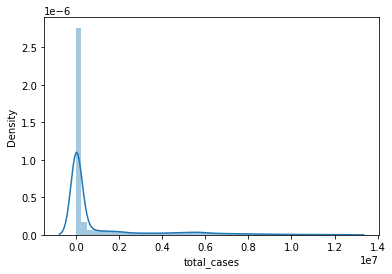

In [78]:
import seaborn as sns
sns.distplot(df['total_cases'])

###### First Confirmed Case

In [79]:
df['first_confirmed_case'].isna().sum()

26730

In [80]:
df['flag'] = df.new_cases.ne(0)

In [81]:
df['flag']

0        True
1        True
2        True
3        True
4        True
         ... 
87445    True
87446    True
87447    True
87448    True
87449    True
Name: flag, Length: 87450, dtype: bool

In [82]:
index_null=df[df['first_confirmed_case'].isnull()].index.tolist()

In [83]:
index_first_case=np.where(df.index.isin(df.groupby(['Country', 'State']).flag.idxmax()))[0].tolist() 

In [84]:
for i in index_null:
  for j in index_first_case:   
    if((df['Country'][i]) == (df['Country'][j])):
      if((df['State'][i]) == (df['State'][j])):
        df['first_confirmed_case'][i]= df['Date'][j]

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [85]:
df['first_confirmed_case'].isna().sum()

0

In [86]:
del df['flag']

Replace missing values by zero when the date is less than the confirmed date of the first case

###### New Cases

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



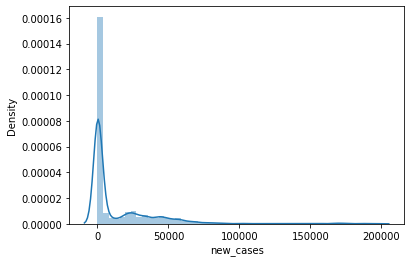

In [87]:
import seaborn as sns
sns.distplot(df['new_cases'])

In [88]:
print(df['new_cases'].isna().sum()/len(df.index)*100,'%')
print(df['new_cases'].isna().sum())

32.38765008576329 %
28323


In [89]:
df[df['new_cases'].isna() & df['first_confirmed_case'].notnull() & (df['first_confirmed_case']> df['Date'])]

,Country,Date,State,total_cases,new_cases,total_deaths,new_deaths,new_tests,total_tests,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,diabetes_prevalence,female_smokers,male_smokers,hospital_beds_per_thousand,school_closing,workplace_closing,cancel_public_events,restrictions_on_gathering,close_public_transport,stay_at_home,restrictions_on_internal_movement,international_travel_controls,income_support,debt_relief,public_information_campaigns,testing_policy,contact_tracing,population,net_change,density_P/Km²,land_area_Km²,migrants_net,yearly_change,fert_Rate,urban_pop_%,world_share,average_temperature,minimum_temperature,maximum_temperature,rainfall,relative_humidity,first_confirmed_case,first_fatalities,cardiovascular_diseases_%,cancers_%,diabetes_blood_endocrine_diseases_%,respiratory_diseases_%,liver_disease_%,diarrhea_common_infectious_diseases_%,musculoskeletal_disorders_%,HIV/AIDS_tuberculosis_%,malaria_neglected_tropical_diseases_%,nutritional_deficiencies_%,pneumonia-death-rates,share_of_deaths_from_smoking_%,hospital_beds_per10k,hospital_density,nbr_surgeons,nbr_obstetricians,nbr_anaesthesiologists,medical_doctors_per10k,year,month,day
0,Afghanistan,2020-01-01,,NaN,NaN,NaN,NaN,NaN,NaN,18.6,2.581,1.337,1803.987,NaN,9.59,NaN,NaN,0.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,38928341.0,886592.0,60.0,652860.0,-62920.0,2.33,4.6,25.0,0.50,5.027778,0.444444,9.555556,0.000000,55.903534,2020-02-24,2020-03-22,8.953006,3.372082,5.27328,1.963170,0.498116,15.825522,1.962412,2.938014,1.393345,1.770030,70.614333,3.56,5.0,0.085,NaN,NaN,8.0,2.840,2020,1,1
1,Afghanistan,2020-01-02,,NaN,NaN,NaN,NaN,NaN,NaN,18.6,2.581,1.337,1803.987,NaN,9.59,NaN,NaN,0.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,38928341.0,886592.0,60.0,652860.0,-62920.0,2.33,4.6,25.0,0.50,2.194444,-0.805556,6.194444,1.143000,78.143671,2020-02-24,2020-03-22,8.953006,3.372082,5.27328,1.963170,0.498116,15.825522,1.962412,2.938014,1.393345,1.770030,70.614333,3.56,5.0,0.085,NaN,NaN,8.0,2.840,2020,1,2
2,Afghanistan,2020-01-03,,NaN,NaN,NaN,NaN,NaN,NaN,18.6,2.581,1.337,1803.987,NaN,9.59,NaN,NaN,0.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,38928341.0,886592.0,60.0,652860.0,-62920.0,2.33,4.6,25.0,0.50,1.916667,-2.750000,7.000000,4.953000,79.131404,2020-02-24,2020-03-22,8.953006,3.372082,5.27328,1.963170,0.498116,15.825522,1.962412,2.938014,1.393345,1.770030,70.614333,3.56,5.0,0.085,NaN,NaN,8.0,2.840,2020,1,3
3,Afghanistan,2020-01-04,,NaN,NaN,NaN,NaN,NaN,NaN,18.6,2.581,1.337,1803.987,NaN,9.59,NaN,NaN,0.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,38928341.0,886592.0,60.0,652860.0,-62920.0,2.33,4.6,25.0,0.50,1.888889,-2.166667,5.277778,6.096000,74.746707,2020-02-24,2020-03-22,8.953006,3.372082,5.27328,1.963170,0.498116,15.825522,1.962412,2.938014,1.393345,1.770030,70.614333,3.56,5.0,0.085,NaN,NaN,8.0,2.840,2020,1,4
4,Afghanistan,2020-01-05,,NaN,NaN,NaN,NaN,NaN,NaN,18.6,2.581,1.337,1803.987,NaN,9.59,NaN,NaN,0.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,38928341.0,886592.0,60.0,652860.0,-62920.0,2.33,4.6,25.0,0.50,1.500000,-0.750000,2.944444,2.413000,84.431231,2020-02-24,2020-03-22,8.953006,3.372082,5.27328,1.963170,0.498116,15.825522,1.962412,2.938014,1.393345,1.770030,70.614333,3.56,5.0,0.085,NaN,NaN,8.0,2.840,2020,1,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
87194,Zimbabwe,2020-03-15,,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,NaN,217456.0,38.0,386850.0,-116858.0,1.48,3.6,38.0,0.19,25.166667,16.166667,30.407407,0.338667,54.465335,2020-03-20,2020-03-23,6.560883,4.998633,3.62297,2.377705,0.681232,17.107359,1.907359,25.493061,1.354636,4.517717,140.887702,7.28,17.0,0.078,80.0,63.0,48.0,0.763,2020,3,15
87195,Zimbabwe,

In [90]:
df['new_cases'] = np.where((df['first_confirmed_case']> df['Date']), 0 , df['new_cases'])

In [91]:
print(df['new_cases'].isna().sum())

17327


Impute remaining null values of new_cases 

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



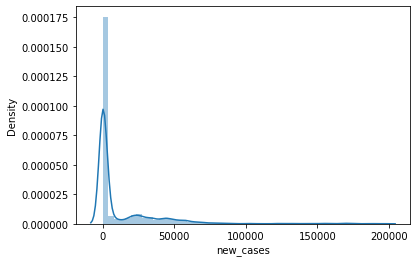

In [92]:
import seaborn as sns
plot=sns.distplot(df['new_cases'])
figure = plot.get_figure()    
figure.savefig('new_cases.png', dpi=400)

As shown in the distribution, it is not gaussian-like distribution, we impute the rest of null values by median of the feature

In [93]:
imp = SimpleImputer(missing_values=np.nan, strategy='median')
imp = imp.fit(df[['new_cases']])
df['new_cases'] = imp.transform(df[['new_cases']]).ravel()

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



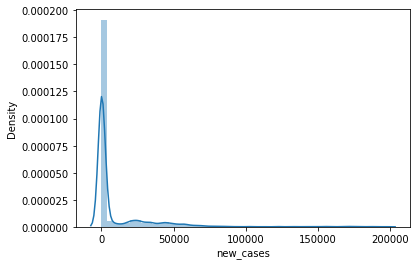

In [94]:
import seaborn as sns
sns.distplot(df['new_cases'])

###### Total Cases

In [95]:
df[df['total_cases'].isna() & df['first_confirmed_case'].notnull() & (df['first_confirmed_case']> df['Date'])]

,Country,Date,State,total_cases,new_cases,total_deaths,new_deaths,new_tests,total_tests,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,diabetes_prevalence,female_smokers,male_smokers,hospital_beds_per_thousand,school_closing,workplace_closing,cancel_public_events,restrictions_on_gathering,close_public_transport,stay_at_home,restrictions_on_internal_movement,international_travel_controls,income_support,debt_relief,public_information_campaigns,testing_policy,contact_tracing,population,net_change,density_P/Km²,land_area_Km²,migrants_net,yearly_change,fert_Rate,urban_pop_%,world_share,average_temperature,minimum_temperature,maximum_temperature,rainfall,relative_humidity,first_confirmed_case,first_fatalities,cardiovascular_diseases_%,cancers_%,diabetes_blood_endocrine_diseases_%,respiratory_diseases_%,liver_disease_%,diarrhea_common_infectious_diseases_%,musculoskeletal_disorders_%,HIV/AIDS_tuberculosis_%,malaria_neglected_tropical_diseases_%,nutritional_deficiencies_%,pneumonia-death-rates,share_of_deaths_from_smoking_%,hospital_beds_per10k,hospital_density,nbr_surgeons,nbr_obstetricians,nbr_anaesthesiologists,medical_doctors_per10k,year,month,day
0,Afghanistan,2020-01-01,,NaN,0.0,NaN,NaN,NaN,NaN,18.6,2.581,1.337,1803.987,NaN,9.59,NaN,NaN,0.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,38928341.0,886592.0,60.0,652860.0,-62920.0,2.33,4.6,25.0,0.50,5.027778,0.444444,9.555556,0.000000,55.903534,2020-02-24,2020-03-22,8.953006,3.372082,5.27328,1.963170,0.498116,15.825522,1.962412,2.938014,1.393345,1.770030,70.614333,3.56,5.0,0.085,NaN,NaN,8.0,2.840,2020,1,1
1,Afghanistan,2020-01-02,,NaN,0.0,NaN,NaN,NaN,NaN,18.6,2.581,1.337,1803.987,NaN,9.59,NaN,NaN,0.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,38928341.0,886592.0,60.0,652860.0,-62920.0,2.33,4.6,25.0,0.50,2.194444,-0.805556,6.194444,1.143000,78.143671,2020-02-24,2020-03-22,8.953006,3.372082,5.27328,1.963170,0.498116,15.825522,1.962412,2.938014,1.393345,1.770030,70.614333,3.56,5.0,0.085,NaN,NaN,8.0,2.840,2020,1,2
2,Afghanistan,2020-01-03,,NaN,0.0,NaN,NaN,NaN,NaN,18.6,2.581,1.337,1803.987,NaN,9.59,NaN,NaN,0.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,38928341.0,886592.0,60.0,652860.0,-62920.0,2.33,4.6,25.0,0.50,1.916667,-2.750000,7.000000,4.953000,79.131404,2020-02-24,2020-03-22,8.953006,3.372082,5.27328,1.963170,0.498116,15.825522,1.962412,2.938014,1.393345,1.770030,70.614333,3.56,5.0,0.085,NaN,NaN,8.0,2.840,2020,1,3
3,Afghanistan,2020-01-04,,NaN,0.0,NaN,NaN,NaN,NaN,18.6,2.581,1.337,1803.987,NaN,9.59,NaN,NaN,0.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,38928341.0,886592.0,60.0,652860.0,-62920.0,2.33,4.6,25.0,0.50,1.888889,-2.166667,5.277778,6.096000,74.746707,2020-02-24,2020-03-22,8.953006,3.372082,5.27328,1.963170,0.498116,15.825522,1.962412,2.938014,1.393345,1.770030,70.614333,3.56,5.0,0.085,NaN,NaN,8.0,2.840,2020,1,4
4,Afghanistan,2020-01-05,,NaN,0.0,NaN,NaN,NaN,NaN,18.6,2.581,1.337,1803.987,NaN,9.59,NaN,NaN,0.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,38928341.0,886592.0,60.0,652860.0,-62920.0,2.33,4.6,25.0,0.50,1.500000,-0.750000,2.944444,2.413000,84.431231,2020-02-24,2020-03-22,8.953006,3.372082,5.27328,1.963170,0.498116,15.825522,1.962412,2.938014,1.393345,1.770030,70.614333,3.56,5.0,0.085,NaN,NaN,8.0,2.840,2020,1,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
87194,Zimbabwe,2020-03-15,,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,NaN,217456.0,38.0,386850.0,-116858.0,1.48,3.6,38.0,0.19,25.166667,16.166667,30.407407,0.338667,54.465335,2020-03-20,2020-03-23,6.560883,4.998633,3.62297,2.377705,0.681232,17.107359,1.907359,25.493061,1.354636,4.517717,140.887702,7.28,17.0,0.078,80.0,63.0,48.0,0.763,2020,3,15
87195,Zimbabwe,

In [96]:
df['total_cases'] = np.where((df['first_confirmed_case']> df['Date']), 0 , df['total_cases'])

In [97]:
print(df['total_cases'].isna().sum()/len(df.index)*100,'%')

6.862206975414523 %


Impute Null values of total cases

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



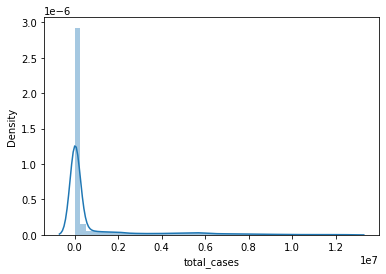

In [98]:
import seaborn as sns
sns.distplot(df['total_cases'])

In [99]:
imp = SimpleImputer(missing_values=np.nan, strategy='median')
imp = imp.fit(df[['total_cases']])
df['total_cases'] = imp.transform(df[['total_cases']]).ravel()

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



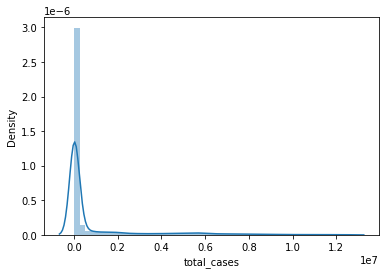

In [100]:
import seaborn as sns
plot=sns.distplot(df['total_cases'])
figure = plot.get_figure()    
figure.savefig('total_cases.png', dpi=400)

###### First Fatalities

In [101]:
df['first_fatalities'].isna().sum()

38280

In [102]:
df['flag'] = df.new_deaths.ne(0)

In [103]:
df['flag']

0        True
1        True
2        True
3        True
4        True
         ... 
87445    True
87446    True
87447    True
87448    True
87449    True
Name: flag, Length: 87450, dtype: bool

In [104]:
index_null=df[df['first_fatalities'].isnull()].index.tolist()

In [105]:
index_first_death=np.where(df.index.isin(df.groupby(['Country', 'State']).flag.idxmax()))[0].tolist() 

In [106]:
for i in index_null:
  for j in index_first_death:   
    if((df['Country'][i]) == (df['Country'][j])):
      if((df['State'][i]) == (df['State'][j])):
        df['first_fatalities'][i]= df['Date'][j]

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [107]:
df['first_fatalities'].isna().sum()

0

In [108]:
del df['flag']

###### New Deaths

In [109]:
print(df['new_deaths'].isna().sum()/len(df.index)*100,'%')
# df['new_deaths']=df['new_deaths'].fillna(0)
print(df['new_deaths'].isna().sum())

49.87535734705546 %
43616


In [110]:
df[df['new_deaths'].isna()  & (df['first_fatalities']> df['Date'])]

,Country,Date,State,total_cases,new_cases,total_deaths,new_deaths,new_tests,total_tests,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,diabetes_prevalence,female_smokers,male_smokers,hospital_beds_per_thousand,school_closing,workplace_closing,cancel_public_events,restrictions_on_gathering,close_public_transport,stay_at_home,restrictions_on_internal_movement,international_travel_controls,income_support,debt_relief,public_information_campaigns,testing_policy,contact_tracing,population,net_change,density_P/Km²,land_area_Km²,migrants_net,yearly_change,fert_Rate,urban_pop_%,world_share,average_temperature,minimum_temperature,maximum_temperature,rainfall,relative_humidity,first_confirmed_case,first_fatalities,cardiovascular_diseases_%,cancers_%,diabetes_blood_endocrine_diseases_%,respiratory_diseases_%,liver_disease_%,diarrhea_common_infectious_diseases_%,musculoskeletal_disorders_%,HIV/AIDS_tuberculosis_%,malaria_neglected_tropical_diseases_%,nutritional_deficiencies_%,pneumonia-death-rates,share_of_deaths_from_smoking_%,hospital_beds_per10k,hospital_density,nbr_surgeons,nbr_obstetricians,nbr_anaesthesiologists,medical_doctors_per10k,year,month,day
0,Afghanistan,2020-01-01,,0.0,0.0,NaN,NaN,NaN,NaN,18.6,2.581,1.337,1803.987,NaN,9.59,NaN,NaN,0.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,38928341.0,886592.0,60.0,652860.0,-62920.0,2.33,4.6,25.0,0.50,5.027778,0.444444,9.555556,0.000,55.903534,2020-02-24,2020-03-22,8.953006,3.372082,5.27328,1.963170,0.498116,15.825522,1.962412,2.938014,1.393345,1.770030,70.614333,3.56,5.0,0.085,NaN,NaN,8.0,2.840,2020,1,1
1,Afghanistan,2020-01-02,,0.0,0.0,NaN,NaN,NaN,NaN,18.6,2.581,1.337,1803.987,NaN,9.59,NaN,NaN,0.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,38928341.0,886592.0,60.0,652860.0,-62920.0,2.33,4.6,25.0,0.50,2.194444,-0.805556,6.194444,1.143,78.143671,2020-02-24,2020-03-22,8.953006,3.372082,5.27328,1.963170,0.498116,15.825522,1.962412,2.938014,1.393345,1.770030,70.614333,3.56,5.0,0.085,NaN,NaN,8.0,2.840,2020,1,2
2,Afghanistan,2020-01-03,,0.0,0.0,NaN,NaN,NaN,NaN,18.6,2.581,1.337,1803.987,NaN,9.59,NaN,NaN,0.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,38928341.0,886592.0,60.0,652860.0,-62920.0,2.33,4.6,25.0,0.50,1.916667,-2.750000,7.000000,4.953,79.131404,2020-02-24,2020-03-22,8.953006,3.372082,5.27328,1.963170,0.498116,15.825522,1.962412,2.938014,1.393345,1.770030,70.614333,3.56,5.0,0.085,NaN,NaN,8.0,2.840,2020,1,3
3,Afghanistan,2020-01-04,,0.0,0.0,NaN,NaN,NaN,NaN,18.6,2.581,1.337,1803.987,NaN,9.59,NaN,NaN,0.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,38928341.0,886592.0,60.0,652860.0,-62920.0,2.33,4.6,25.0,0.50,1.888889,-2.166667,5.277778,6.096,74.746707,2020-02-24,2020-03-22,8.953006,3.372082,5.27328,1.963170,0.498116,15.825522,1.962412,2.938014,1.393345,1.770030,70.614333,3.56,5.0,0.085,NaN,NaN,8.0,2.840,2020,1,4
4,Afghanistan,2020-01-05,,0.0,0.0,NaN,NaN,NaN,NaN,18.6,2.581,1.337,1803.987,NaN,9.59,NaN,NaN,0.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,38928341.0,886592.0,60.0,652860.0,-62920.0,2.33,4.6,25.0,0.50,1.500000,-0.750000,2.944444,2.413,84.431231,2020-02-24,2020-03-22,8.953006,3.372082,5.27328,1.963170,0.498116,15.825522,1.962412,2.938014,1.393345,1.770030,70.614333,3.56,5.0,0.085,NaN,NaN,8.0,2.840,2020,1,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
87197,Zimbabwe,2020-03-18,,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,2.0,3.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,NaN,217456.0,38.0,386850.0,-116858.0,1.48,3.6,38.0,0.19,19.750000,14.888889,25.666667,0.000,69.751335,2020-03-20,2020-03-23,6.560883,4.998633,3.62297,2.377705,0.681232,17.107359,1.907359,25.493061,1.354636,4.517717,140.887702,7.28,17.0,0.078,80.0,63.0,48.0,0.763,2020,3,18
87198,Zimbabwe,2020-03-19,,0.0,0.

In [111]:
df['new_deaths'] = np.where((df['first_fatalities']> df['Date']), 0 , df['new_deaths'])

In [112]:
print(df['new_deaths'].isna().sum()/len(df.index)*100,'%')

36.95140080045741 %


Impute Null values of new deaths, skewed we will use most frequent method

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



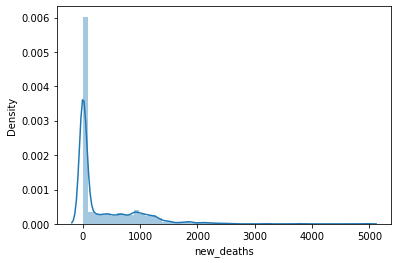

In [113]:
import seaborn as sns
plot=sns.distplot(df['new_deaths'])
figure = plot.get_figure()    
figure.savefig('new_deaths.png', dpi=400)

In [114]:
imp = SimpleImputer(missing_values=np.nan, strategy='most_frequent')
imp = imp.fit(df[['new_deaths']])
df['new_deaths'] = imp.transform(df[['new_deaths']]).ravel()

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



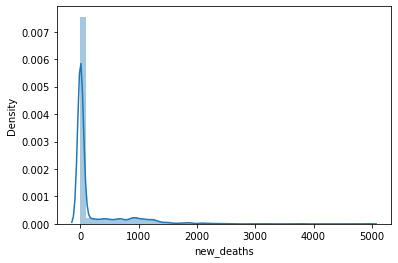

In [115]:
import seaborn as sns
sns.distplot(df['new_deaths'])

In [116]:
print(df['new_deaths'].isna().sum()/len(df.index)*100,'%')

0.0 %


###### Total Deaths

In [117]:
print(df['total_deaths'].isna().sum()/len(df.index)*100,'%')
# df['total_deaths']=df['total_deaths'].fillna(0)
print(df['total_deaths'].isna().sum())

29.59519725557461 %
25881


In [118]:
df[df['total_deaths'].isna() & df['first_fatalities'].notnull() & (df['first_fatalities']> df['Date'])]

,Country,Date,State,total_cases,new_cases,total_deaths,new_deaths,new_tests,total_tests,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,diabetes_prevalence,female_smokers,male_smokers,hospital_beds_per_thousand,school_closing,workplace_closing,cancel_public_events,restrictions_on_gathering,close_public_transport,stay_at_home,restrictions_on_internal_movement,international_travel_controls,income_support,debt_relief,public_information_campaigns,testing_policy,contact_tracing,population,net_change,density_P/Km²,land_area_Km²,migrants_net,yearly_change,fert_Rate,urban_pop_%,world_share,average_temperature,minimum_temperature,maximum_temperature,rainfall,relative_humidity,first_confirmed_case,first_fatalities,cardiovascular_diseases_%,cancers_%,diabetes_blood_endocrine_diseases_%,respiratory_diseases_%,liver_disease_%,diarrhea_common_infectious_diseases_%,musculoskeletal_disorders_%,HIV/AIDS_tuberculosis_%,malaria_neglected_tropical_diseases_%,nutritional_deficiencies_%,pneumonia-death-rates,share_of_deaths_from_smoking_%,hospital_beds_per10k,hospital_density,nbr_surgeons,nbr_obstetricians,nbr_anaesthesiologists,medical_doctors_per10k,year,month,day
0,Afghanistan,2020-01-01,,0.0,0.0,NaN,0.0,NaN,NaN,18.6,2.581,1.337,1803.987,NaN,9.59,NaN,NaN,0.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,38928341.0,886592.0,60.0,652860.0,-62920.0,2.33,4.6,25.0,0.50,5.027778,0.444444,9.555556,0.000,55.903534,2020-02-24,2020-03-22,8.953006,3.372082,5.27328,1.963170,0.498116,15.825522,1.962412,2.938014,1.393345,1.770030,70.614333,3.56,5.0,0.085,NaN,NaN,8.0,2.840,2020,1,1
1,Afghanistan,2020-01-02,,0.0,0.0,NaN,0.0,NaN,NaN,18.6,2.581,1.337,1803.987,NaN,9.59,NaN,NaN,0.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,38928341.0,886592.0,60.0,652860.0,-62920.0,2.33,4.6,25.0,0.50,2.194444,-0.805556,6.194444,1.143,78.143671,2020-02-24,2020-03-22,8.953006,3.372082,5.27328,1.963170,0.498116,15.825522,1.962412,2.938014,1.393345,1.770030,70.614333,3.56,5.0,0.085,NaN,NaN,8.0,2.840,2020,1,2
2,Afghanistan,2020-01-03,,0.0,0.0,NaN,0.0,NaN,NaN,18.6,2.581,1.337,1803.987,NaN,9.59,NaN,NaN,0.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,38928341.0,886592.0,60.0,652860.0,-62920.0,2.33,4.6,25.0,0.50,1.916667,-2.750000,7.000000,4.953,79.131404,2020-02-24,2020-03-22,8.953006,3.372082,5.27328,1.963170,0.498116,15.825522,1.962412,2.938014,1.393345,1.770030,70.614333,3.56,5.0,0.085,NaN,NaN,8.0,2.840,2020,1,3
3,Afghanistan,2020-01-04,,0.0,0.0,NaN,0.0,NaN,NaN,18.6,2.581,1.337,1803.987,NaN,9.59,NaN,NaN,0.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,38928341.0,886592.0,60.0,652860.0,-62920.0,2.33,4.6,25.0,0.50,1.888889,-2.166667,5.277778,6.096,74.746707,2020-02-24,2020-03-22,8.953006,3.372082,5.27328,1.963170,0.498116,15.825522,1.962412,2.938014,1.393345,1.770030,70.614333,3.56,5.0,0.085,NaN,NaN,8.0,2.840,2020,1,4
4,Afghanistan,2020-01-05,,0.0,0.0,NaN,0.0,NaN,NaN,18.6,2.581,1.337,1803.987,NaN,9.59,NaN,NaN,0.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,38928341.0,886592.0,60.0,652860.0,-62920.0,2.33,4.6,25.0,0.50,1.500000,-0.750000,2.944444,2.413,84.431231,2020-02-24,2020-03-22,8.953006,3.372082,5.27328,1.963170,0.498116,15.825522,1.962412,2.938014,1.393345,1.770030,70.614333,3.56,5.0,0.085,NaN,NaN,8.0,2.840,2020,1,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
87197,Zimbabwe,2020-03-18,,0.0,0.0,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,2.0,3.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,NaN,217456.0,38.0,386850.0,-116858.0,1.48,3.6,38.0,0.19,19.750000,14.888889,25.666667,0.000,69.751335,2020-03-20,2020-03-23,6.560883,4.998633,3.62297,2.377705,0.681232,17.107359,1.907359,25.493061,1.354636,4.517717,140.887702,7.28,17.0,0.078,80.0,63.0,48.0,0.763,2020,3,18
87198,Zimbabwe,2020-03-19,,0.0,0.

In [119]:
df['total_deaths'] = np.where((df['first_fatalities']> df['Date']), 0 , df['total_deaths'])

In [120]:
print(df['total_deaths'].isna().sum()/len(df.index)*100,'%')

16.682675814751285 %


Impute Null values of total deaths

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



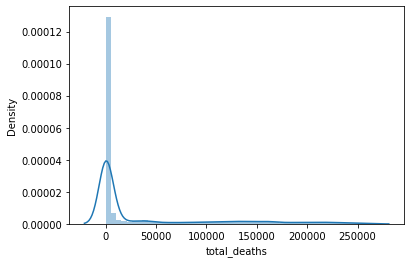

In [121]:
import seaborn as sns
plot=sns.distplot(df['total_deaths'])
figure = plot.get_figure()    
figure.savefig('total_deaths.png', dpi=400)

In [122]:
imp = SimpleImputer(missing_values=np.nan, strategy='median')
imp = imp.fit(df[['total_deaths']])
df['total_deaths'] = imp.transform(df[['total_deaths']]).ravel()

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



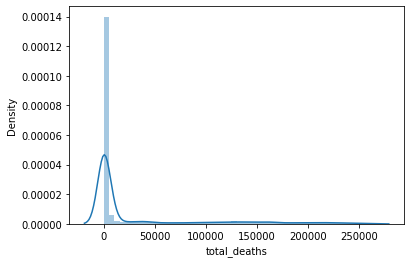

In [123]:
import seaborn as sns
sns.distplot(df['total_deaths'])

##### 	Imputation for numeric features

In the section below, we show 3 different imputations 


*   Imputing null values by the feature median
*   Imputing null values by the feature mode
*   Imputing null value by the feature most frequent value 




In [124]:
df.select_dtypes(include = 'float')

,total_cases,new_cases,total_deaths,new_deaths,new_tests,total_tests,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,diabetes_prevalence,female_smokers,male_smokers,hospital_beds_per_thousand,school_closing,workplace_closing,cancel_public_events,restrictions_on_gathering,close_public_transport,stay_at_home,restrictions_on_internal_movement,international_travel_controls,income_support,debt_relief,public_information_campaigns,testing_policy,contact_tracing,population,net_change,density_P/Km²,land_area_Km²,migrants_net,yearly_change,fert_Rate,urban_pop_%,world_share,average_temperature,minimum_temperature,maximum_temperature,rainfall,relative_humidity,cardiovascular_diseases_%,cancers_%,diabetes_blood_endocrine_diseases_%,respiratory_diseases_%,liver_disease_%,diarrhea_common_infectious_diseases_%,musculoskeletal_disorders_%,HIV/AIDS_tuberculosis_%,malaria_neglected_tropical_diseases_%,nutritional_deficiencies_%,pneumonia-death-rates,share_of_deaths_from_smoking_%,hospital_beds_per10k,hospital_density,nbr_surgeons,nbr_obstetricians,nbr_anaesthesiologists,medical_doctors_per10k
0,0.0,0.0,0.0,0.0,NaN,NaN,18.6,2.581,1.337,1803.987,NaN,9.59,NaN,NaN,0.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,38928341.0,886592.0,60.0,652860.0,-62920.0,2.33,4.6,25.0,0.50,5.027778,0.444444,9.555556,0.000,55.903534,8.953006,3.372082,5.27328,1.963170,0.498116,15.825522,1.962412,2.938014,1.393345,1.770030,70.614333,3.56,5.0,0.085,NaN,NaN,8.0,2.840
1,0.0,0.0,0.0,0.0,NaN,NaN,18.6,2.581,1.337,1803.987,NaN,9.59,NaN,NaN,0.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,38928341.0,886592.0,60.0,652860.0,-62920.0,2.33,4.6,25.0,0.50,2.194444,-0.805556,6.194444,1.143,78.143671,8.953006,3.372082,5.27328,1.963170,0.498116,15.825522,1.962412,2.938014,1.393345,1.770030,70.614333,3.56,5.0,0.085,NaN,NaN,8.0,2.840
2,0.0,0.0,0.0,0.0,NaN,NaN,18.6,2.581,1.337,1803.987,NaN,9.59,NaN,NaN,0.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,38928341.0,886592.0,60.0,652860.0,-62920.0,2.33,4.6,25.0,0.50,1.916667,-2.750000,7.000000,4.953,79.131404,8.953006,3.372082,5.27328,1.963170,0.498116,15.825522,1.962412,2.938014,1.393345,1.770030,70.614333,3.56,5.0,0.085,NaN,NaN,8.0,2.840
3,0.0,0.0,0.0,0.0,NaN,NaN,18.6,2.581,1.337,1803.987,NaN,9.59,NaN,NaN,0.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,38928341.0,886592.0,60.0,652860.0,-62920.0,2.33,4.6,25.0,0.50,1.888889,-2.166667,5.277778,6.096,74.746707,8.953006,3.372082,5.27328,1.963170,0.498116,15.825522,1.962412,2.938014,1.393345,1.770030,70.614333,3.56,5.0,0.085,NaN,NaN,8.0,2.840
4,0.0,0.0,0.0,0.0,NaN,NaN,18.6,2.581,1.337,1803.987,NaN,9.59,NaN,NaN,0.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,38928341.0,886592.0,60.0,652860.0,-62920.0,2.33,4.6,25.0,0.50,1.500000,-0.750000,2.944444,2.413,84.431231,8.953006,3.372082,5.27328,1.963170,0.498116,15.825522,1.962412,2.938014,1.393345,1.770030,70.614333,3.56,5.0,0.085,NaN,NaN,8.0,2.840
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
87445,9120.0,74.0,265.0,0.0,604.0,158894.0,19.6,2.822,1.882,1899.775,21.4,1.82,1.6,30.7,1.7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,14862927.0,217456.0,38.0,386850.0,-116858.0,1.48,3.6,38.0,0.19,NaN,NaN,NaN,NaN,NaN,6.560883,4.998633,3.62297,2.377705,0.681232,17.107359,1.907359,25.493061,1.354636,4.517717,140.887702,7.28,17.0,0.078,80.0,63.0,48.0,0.763
87446,9172.0,52.0,265.0,0.0,1404.0,160298.0,19.6,2.822,1.882,1899.775,21.4,1.82,1.6,30.7,1.7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,14862927.0,217456.0,38.0,386850.0,-116858.0,1.48,3.6,38.0,0.19,NaN,NaN,NaN,NaN,NaN,6.560883,4.998633,3.62297,2.377705,0.681232,17.107359,1.907359,25.493061,1.354636,4.517717,140.887702,7.28,17.0,0.078,80.0,63.0,48.0,0.763
87447,9220.0,48.0,268.0,3.0,NaN,NaN,19.6,2.822,1.882,1899.775,21.4,1.82,1.6,30.7,1.7,NaN,Na

In [125]:
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [126]:
def impute(variable):
  fig, axs = plt.subplots(ncols=4,figsize=(12,3))
  df[variable+'_median'] = df[variable].fillna(df[variable].median())
  df[variable+'_mean']=df[variable].fillna(df[variable].mean())
  #most frequent i.e. mode
  df[variable+'_mode']=df[variable].fillna(df[variable].value_counts().index[0])
  sns.distplot(df[variable],hist=False,color='red', ax=axs[0])
  sns.distplot(df[variable+'_median'],hist=False,color='green', ax=axs[1])
  sns.distplot(df[variable+'_mean'],hist=False,color='blue', ax=axs[2])
  sns.distplot(df[variable+'_mode'],hist=False,color='yellow', ax=axs[3])
  plt.show()
  del df[variable+'_median']
  del df[variable+'_mode']
  del df[variable+'_mean']

col =['new_tests','total_tests','median_age','aged_65_older','aged_70_older','gdp_per_capita','extreme_poverty','diabetes_prevalence','female_smokers','male_smokers',
      'hospital_beds_per_thousand','population','net_change','density_P/Km²','land_area_Km²','migrants_net','yearly_change','fert_Rate'
      ,'urban_pop_%','world_share','average_temperature','minimum_temperature','maximum_temperature','relative_humidity','rainfall','cardiovascular_diseases_%',
      'cancers_%','diabetes_blood_endocrine_diseases_%','respiratory_diseases_%','liver_disease_%','diarrhea_common_infectious_diseases_%',
      'musculoskeletal_disorders_%','HIV/AIDS_tuberculosis_%','malaria_neglected_tropical_diseases_%','nutritional_deficiencies_%'
      ,'pneumonia-death-rates','share_of_deaths_from_smoking_%','hospital_beds_per10k',
      'hospital_density','nbr_surgeons','nbr_obstetricians','nbr_anaesthesiologists','medical_doctors_per10k']
# print(len(col))
# for column in col:
#   impute(column)

In [127]:
target_var='new_cases'
X=df.loc[:,df.columns!= target_var]
Y= df.loc[:,df.columns == target_var]
X = X[col]
X

,new_tests,total_tests,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,diabetes_prevalence,female_smokers,male_smokers,hospital_beds_per_thousand,population,net_change,density_P/Km²,land_area_Km²,migrants_net,yearly_change,fert_Rate,urban_pop_%,world_share,average_temperature,minimum_temperature,maximum_temperature,relative_humidity,rainfall,cardiovascular_diseases_%,cancers_%,diabetes_blood_endocrine_diseases_%,respiratory_diseases_%,liver_disease_%,diarrhea_common_infectious_diseases_%,musculoskeletal_disorders_%,HIV/AIDS_tuberculosis_%,malaria_neglected_tropical_diseases_%,nutritional_deficiencies_%,pneumonia-death-rates,share_of_deaths_from_smoking_%,hospital_beds_per10k,hospital_density,nbr_surgeons,nbr_obstetricians,nbr_anaesthesiologists,medical_doctors_per10k
0,NaN,NaN,18.6,2.581,1.337,1803.987,NaN,9.59,NaN,NaN,0.5,38928341.0,886592.0,60.0,652860.0,-62920.0,2.33,4.6,25.0,0.50,5.027778,0.444444,9.555556,55.903534,0.000,8.953006,3.372082,5.27328,1.963170,0.498116,15.825522,1.962412,2.938014,1.393345,1.770030,70.614333,3.56,5.0,0.085,NaN,NaN,8.0,2.840
1,NaN,NaN,18.6,2.581,1.337,1803.987,NaN,9.59,NaN,NaN,0.5,38928341.0,886592.0,60.0,652860.0,-62920.0,2.33,4.6,25.0,0.50,2.194444,-0.805556,6.194444,78.143671,1.143,8.953006,3.372082,5.27328,1.963170,0.498116,15.825522,1.962412,2.938014,1.393345,1.770030,70.614333,3.56,5.0,0.085,NaN,NaN,8.0,2.840
2,NaN,NaN,18.6,2.581,1.337,1803.987,NaN,9.59,NaN,NaN,0.5,38928341.0,886592.0,60.0,652860.0,-62920.0,2.33,4.6,25.0,0.50,1.916667,-2.750000,7.000000,79.131404,4.953,8.953006,3.372082,5.27328,1.963170,0.498116,15.825522,1.962412,2.938014,1.393345,1.770030,70.614333,3.56,5.0,0.085,NaN,NaN,8.0,2.840
3,NaN,NaN,18.6,2.581,1.337,1803.987,NaN,9.59,NaN,NaN,0.5,38928341.0,886592.0,60.0,652860.0,-62920.0,2.33,4.6,25.0,0.50,1.888889,-2.166667,5.277778,74.746707,6.096,8.953006,3.372082,5.27328,1.963170,0.498116,15.825522,1.962412,2.938014,1.393345,1.770030,70.614333,3.56,5.0,0.085,NaN,NaN,8.0,2.840
4,NaN,NaN,18.6,2.581,1.337,1803.987,NaN,9.59,NaN,NaN,0.5,38928341.0,886592.0,60.0,652860.0,-62920.0,2.33,4.6,25.0,0.50,1.500000,-0.750000,2.944444,84.431231,2.413,8.953006,3.372082,5.27328,1.963170,0.498116,15.825522,1.962412,2.938014,1.393345,1.770030,70.614333,3.56,5.0,0.085,NaN,NaN,8.0,2.840
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
87445,604.0,158894.0,19.6,2.822,1.882,1899.775,21.4,1.82,1.6,30.7,1.7,14862927.0,217456.0,38.0,386850.0,-116858.0,1.48,3.6,38.0,0.19,NaN,NaN,NaN,NaN,NaN,6.560883,4.998633,3.62297,2.377705,0.681232,17.107359,1.907359,25.493061,1.354636,4.517717,140.887702,7.28,17.0,0.078,80.0,63.0,48.0,0.763
87446,1404.0,160298.0,19.6,2.822,1.882,1899.775,21.4,1.82,1.6,30.7,1.7,14862927.0,217456.0,38.0,386850.0,-116858.0,1.48,3.6,38.0,0.19,NaN,NaN,NaN,NaN,NaN,6.560883,4.998633,3.62297,2.377705,0.681232,17.107359,1.907359,25.493061,1.354636,4.517717,140.887702,7.28,17.0,0.078,80.0,63.0,48.0,0.763
87447,NaN,NaN,19.6,2.822,1.882,1899.775,21.4,1.82,1.6,30.7,1.7,14862927.0,217456.0,38.0,386850.0,-116858.0,1.48,3.6,38.0,0.19,NaN,NaN,NaN,NaN,NaN,6.560883,4.998633,3.62297,2.377705,0.681232,17.107359,1.907359,25.493061,1.354636,4.517717,140.887702,7.28,17.0,0.078,80.0,63.0,48.0,0.763
87448,NaN,NaN,19.6,2.822,1.882,1899.775,21.4,1.82,1.6,30.7,1.7,14862927.0,217456.0,38.0,386850.0,-116858.0,1.48,3.6,38.0,0.19,NaN,NaN,NaN,NaN,NaN,6.560883,4.998633,3.62297,2.377705,0.681232,17.107359,1.907359,25.493061,1.354636,4.517717,140.887702,7.28,17.0,0.078,80.0,63.0,48.0,0.763


###### Compare statistical imputation strategies

###### Final Decision

We imputed skewed distribution by most frequent values, we didnt notice any feature with normal dstribution, so we applied imputation by median to the rest of numeric features.

In [128]:
skewed=['new_tests','total_tests','extreme_poverty','population'
,'density_P/Km²','fert_Rate','urban_pop_%','average_temperature','minimum_temperature','maximum_temperature',
'relative_humidity','rainfall','liver_disease_%','diarrhea_common_infectious_diseases_%','HIV/AIDS_tuberculosis_%'
,'malaria_neglected_tropical_diseases_%','nutritional_deficiencies_%','hospital_density','nbr_surgeons','nbr_obstetricians','nbr_anaesthesiologists']

In [129]:
for var in skewed:
  imp = SimpleImputer(missing_values=np.nan, strategy='most_frequent')
  imp = imp.fit(df[[var]])
  df[var] = imp.transform(df[[var]]).ravel()

In [130]:
skewed=set(skewed)

In [131]:
col=set(col)

In [132]:
not_skewed=col.difference(skewed)

In [133]:
for var in not_skewed:
  imp = SimpleImputer(missing_values=np.nan, strategy='median')
  imp = imp.fit(df[[var]])
  df[var] = imp.transform(df[[var]]).ravel()

In [134]:
null_table = null_analysis(df)
px.bar(null_table.reset_index(), x='index', y='percentage', text='counts', height=500)

In [135]:
df

,Country,Date,State,total_cases,new_cases,total_deaths,new_deaths,new_tests,total_tests,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,diabetes_prevalence,female_smokers,male_smokers,hospital_beds_per_thousand,school_closing,workplace_closing,cancel_public_events,restrictions_on_gathering,close_public_transport,stay_at_home,restrictions_on_internal_movement,international_travel_controls,income_support,debt_relief,public_information_campaigns,testing_policy,contact_tracing,population,net_change,density_P/Km²,land_area_Km²,migrants_net,yearly_change,fert_Rate,urban_pop_%,world_share,average_temperature,minimum_temperature,maximum_temperature,rainfall,relative_humidity,first_confirmed_case,first_fatalities,cardiovascular_diseases_%,cancers_%,diabetes_blood_endocrine_diseases_%,respiratory_diseases_%,liver_disease_%,diarrhea_common_infectious_diseases_%,musculoskeletal_disorders_%,HIV/AIDS_tuberculosis_%,malaria_neglected_tropical_diseases_%,nutritional_deficiencies_%,pneumonia-death-rates,share_of_deaths_from_smoking_%,hospital_beds_per10k,hospital_density,nbr_surgeons,nbr_obstetricians,nbr_anaesthesiologists,medical_doctors_per10k,year,month,day
0,Afghanistan,2020-01-01,,0.0,0.0,0.0,0.0,183.0,183.0,18.6,2.581,1.337,1803.987,1.2,9.59,11.2,24.6,0.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,38928341.0,886592.0,60.0,652860.0,-62920.0,2.33,4.6,25.0,0.50,5.027778,0.444444,9.555556,0.000,55.903534,2020-02-24,2020-03-22,8.953006,3.372082,5.27328,1.963170,0.498116,15.825522,1.962412,2.938014,1.393345,1.770030,70.614333,3.56,5.0,0.085,70298.0,25013.0,8.0,2.840,2020,1,1
1,Afghanistan,2020-01-02,,0.0,0.0,0.0,0.0,183.0,183.0,18.6,2.581,1.337,1803.987,1.2,9.59,11.2,24.6,0.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,38928341.0,886592.0,60.0,652860.0,-62920.0,2.33,4.6,25.0,0.50,2.194444,-0.805556,6.194444,1.143,78.143671,2020-02-24,2020-03-22,8.953006,3.372082,5.27328,1.963170,0.498116,15.825522,1.962412,2.938014,1.393345,1.770030,70.614333,3.56,5.0,0.085,70298.0,25013.0,8.0,2.840,2020,1,2
2,Afghanistan,2020-01-03,,0.0,0.0,0.0,0.0,183.0,183.0,18.6,2.581,1.337,1803.987,1.2,9.59,11.2,24.6,0.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,38928341.0,886592.0,60.0,652860.0,-62920.0,2.33,4.6,25.0,0.50,1.916667,-2.750000,7.000000,4.953,79.131404,2020-02-24,2020-03-22,8.953006,3.372082,5.27328,1.963170,0.498116,15.825522,1.962412,2.938014,1.393345,1.770030,70.614333,3.56,5.0,0.085,70298.0,25013.0,8.0,2.840,2020,1,3
3,Afghanistan,2020-01-04,,0.0,0.0,0.0,0.0,183.0,183.0,18.6,2.581,1.337,1803.987,1.2,9.59,11.2,24.6,0.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,38928341.0,886592.0,60.0,652860.0,-62920.0,2.33,4.6,25.0,0.50,1.888889,-2.166667,5.277778,6.096,74.746707,2020-02-24,2020-03-22,8.953006,3.372082,5.27328,1.963170,0.498116,15.825522,1.962412,2.938014,1.393345,1.770030,70.614333,3.56,5.0,0.085,70298.0,25013.0,8.0,2.840,2020,1,4
4,Afghanistan,2020-01-05,,0.0,0.0,0.0,0.0,183.0,183.0,18.6,2.581,1.337,1803.987,1.2,9.59,11.2,24.6,0.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,38928341.0,886592.0,60.0,652860.0,-62920.0,2.33,4.6,25.0,0.50,1.500000,-0.750000,2.944444,2.413,84.431231,2020-02-24,2020-03-22,8.953006,3.372082,5.27328,1.963170,0.498116,15.825522,1.962412,2.938014,1.393345,1.770030,70.614333,3.56,5.0,0.085,70298.0,25013.0,8.0,2.840,2020,1,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
87445,Zimbabwe,2020-11-21,,9120.0,74.0,265.0,0.0,604.0,158894.0,19.6,2.822,1.882,1899.775,21.4,1.82,1.6,30.7,1.7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,14862927.0,217456.0,38.0,386850.0,-116858.0,1.48,3.6,38.0,0.19,28.555556,24.000000,32.000000,0.000,67.135487,2020-03-20,2020-03-23,6.560883,4.998633,3.62297,2.377705,0.681232,17.107359,1.907359,25.493061,1.3546

In [136]:
df['median_age']=df['median_age'].fillna(df['median_age'].mean())

In [137]:
print(df['median_age'].isna().sum())
df['median_age']

0


0        18.6
1        18.6
2        18.6
3        18.6
4        18.6
         ... 
87445    19.6
87446    19.6
87447    19.6
87448    19.6
87449    19.6
Name: median_age, Length: 87450, dtype: float64

##### 	Imputation for categorical/ordinal features (OXFORD Policy Tracker)

In [138]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 87450 entries, 0 to 87449
Data columns (total 68 columns):
 #   Column                                 Non-Null Count  Dtype         
---  ------                                 --------------  -----         
 0   Country                                87450 non-null  object        
 1   Date                                   87450 non-null  datetime64[ns]
 2   State                                  87450 non-null  object        
 3   total_cases                            87450 non-null  float64       
 4   new_cases                              87450 non-null  float64       
 5   total_deaths                           87450 non-null  float64       
 6   new_deaths                             87450 non-null  float64       
 7   new_tests                              87450 non-null  float64       
 8   total_tests                            87450 non-null  float64       
 9   median_age                             87450 non-null  float6

The data is ordinal according to different categories shown in the following codebook https://github.com/OxCGRT/covid-policy-tracker/blob/master/documentation/codebook.md. 
The categories are already encoded to 0,1,2 and 3. The codebook shows each feature encoding dictionary.

In [139]:
max(df['school_closing'].unique())

3.0

In [140]:
df['school_closing'].unique()

array([ 0.,  3.,  2.,  1., nan])

In [141]:
cat_cols = ['school_closing','workplace_closing','cancel_public_events','restrictions_on_gathering','close_public_transport','stay_at_home',
            'restrictions_on_internal_movement','international_travel_controls','income_support','debt_relief','public_information_campaigns','testing_policy','contact_tracing']

In [142]:
null_table = null_analysis(df)
px.bar(null_table.reset_index(), x='index', y='percentage', text='counts', height=500)

One of the imputation for categorical data is:  Replacing NAN with new Category variable. In this we can replace the NAN with any category like missing or unknown. According to the notebook, the data is ordinal for all policies, and the categories total number may differ from one feature to another,so we will add one for the max number per each column and replace the null value by this number.

In [143]:
def impute_freq_cat(df,variable):
    max_cat = max(df[variable].unique())
    df[variable].fillna(max_cat+1,inplace=True)

for column in cat_cols: 
  impute_freq_cat(df,column)

In [144]:
null_table = null_analysis(df)
px.bar(null_table.reset_index(), x='index', y='percentage', text='counts', height=500)

# Time Series Analysis

In [145]:
from sklearn import preprocessing
for f in df.columns:
    if df[f].dtype=='object':
        lbl = preprocessing.LabelEncoder()
        lbl.fit(list(df[f].values)) 
        df[f] = lbl.transform(list(df[f].values))
        print(lbl.classes_)
dtype_df = df.dtypes.reset_index()
dtype_df.columns = ["Count", "Column Type"]
dtype_df.groupby("Column Type").aggregate('count').reset_index()

['Afghanistan' 'Albania' 'Algeria' 'Andorra' 'Angola' 'Argentina' 'Aruba'
 'Australia' 'Austria' 'Azerbaijan' 'Bahamas' 'Bahrain' 'Bangladesh'
 'Barbados' 'Belarus' 'Belgium' 'Belize' 'Benin' 'Bermuda' 'Bhutan'
 'Bolivia' 'Bosnia and Herzegovina' 'Botswana' 'Brazil' 'Brunei'
 'Bulgaria' 'Burkina Faso' 'Burundi' 'Cambodia' 'Cameroon' 'Canada'
 'Cape Verde' 'Central African Republic' 'Chad' 'Chile' 'China' 'Colombia'
 'Comoros' 'Congo' 'Costa Rica' "Cote d'Ivoire" 'Croatia' 'Cuba' 'Cyprus'
 'Czech Republic' 'Democratic Republic of Congo' 'Denmark' 'Djibouti'
 'Dominica' 'Dominican Republic' 'Ecuador' 'Egypt' 'El Salvador' 'Eritrea'
 'Estonia' 'Eswatini' 'Ethiopia' 'Faeroe Islands' 'Fiji' 'Finland'
 'France' 'Gabon' 'Gambia' 'Georgia' 'Germany' 'Ghana' 'Greece'
 'Greenland' 'Guam' 'Guatemala' 'Guinea' 'Guyana' 'Haiti' 'Honduras'
 'Hong Kong' 'Hungary' 'Iceland' 'India' 'Indonesia' 'Iran' 'Iraq'
 'Ireland' 'Israel' 'Italy' 'Jamaica' 'Japan' 'Jordan' 'Kazakhstan'
 'Kenya' 'Kosovo' 'Kuwait' 

,Column Type,Count
0,int64,5
1,datetime64[ns],3
2,float64,60


In [146]:
df.head()

,Country,Date,State,total_cases,new_cases,total_deaths,new_deaths,new_tests,total_tests,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,diabetes_prevalence,female_smokers,male_smokers,hospital_beds_per_thousand,school_closing,workplace_closing,cancel_public_events,restrictions_on_gathering,close_public_transport,stay_at_home,restrictions_on_internal_movement,international_travel_controls,income_support,debt_relief,public_information_campaigns,testing_policy,contact_tracing,population,net_change,density_P/Km²,land_area_Km²,migrants_net,yearly_change,fert_Rate,urban_pop_%,world_share,average_temperature,minimum_temperature,maximum_temperature,rainfall,relative_humidity,first_confirmed_case,first_fatalities,cardiovascular_diseases_%,cancers_%,diabetes_blood_endocrine_diseases_%,respiratory_diseases_%,liver_disease_%,diarrhea_common_infectious_diseases_%,musculoskeletal_disorders_%,HIV/AIDS_tuberculosis_%,malaria_neglected_tropical_diseases_%,nutritional_deficiencies_%,pneumonia-death-rates,share_of_deaths_from_smoking_%,hospital_beds_per10k,hospital_density,nbr_surgeons,nbr_obstetricians,nbr_anaesthesiologists,medical_doctors_per10k,year,month,day
0,0,2020-01-01,0,0.0,0.0,0.0,0.0,183.0,183.0,18.6,2.581,1.337,1803.987,1.2,9.59,11.2,24.6,0.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,38928341.0,886592.0,60.0,652860.0,-62920.0,2.33,4.6,25.0,0.5,5.027778,0.444444,9.555556,0.000,55.903534,2020-02-24,2020-03-22,8.953006,3.372082,5.27328,1.96317,0.498116,15.825522,1.962412,2.938014,1.393345,1.77003,70.614333,3.56,5.0,0.085,70298.0,25013.0,8.0,2.84,2020,1,1
1,0,2020-01-02,0,0.0,0.0,0.0,0.0,183.0,183.0,18.6,2.581,1.337,1803.987,1.2,9.59,11.2,24.6,0.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,38928341.0,886592.0,60.0,652860.0,-62920.0,2.33,4.6,25.0,0.5,2.194444,-0.805556,6.194444,1.143,78.143671,2020-02-24,2020-03-22,8.953006,3.372082,5.27328,1.96317,0.498116,15.825522,1.962412,2.938014,1.393345,1.77003,70.614333,3.56,5.0,0.085,70298.0,25013.0,8.0,2.84,2020,1,2
2,0,2020-01-03,0,0.0,0.0,0.0,0.0,183.0,183.0,18.6,2.581,1.337,1803.987,1.2,9.59,11.2,24.6,0.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,38928341.0,886592.0,60.0,652860.0,-62920.0,2.33,4.6,25.0,0.5,1.916667,-2.750000,7.000000,4.953,79.131404,2020-02-24,2020-03-22,8.953006,3.372082,5.27328,1.96317,0.498116,15.825522,1.962412,2.938014,1.393345,1.77003,70.614333,3.56,5.0,0.085,70298.0,25013.0,8.0,2.84,2020,1,3
3,0,2020-01-04,0,0.0,0.0,0.0,0.0,183.0,183.0,18.6,2.581,1.337,1803.987,1.2,9.59,11.2,24.6,0.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,38928341.0,886592.0,60.0,652860.0,-62920.0,2.33,4.6,25.0,0.5,1.888889,-2.166667,5.277778,6.096,74.746707,2020-02-24,2020-03-22,8.953006,3.372082,5.27328,1.96317,0.498116,15.825522,1.962412,2.938014,1.393345,1.77003,70.614333,3.56,5.0,0.085,70298.0,25013.0,8.0,2.84,2020,1,4
4,0,2020-01-05,0,0.0,0.0,0.0,0.0,183.0,183.0,18.6,2.581,1.337,1803.987,1.2,9.59,11.2,24.6,0.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,38928341.0,886592.0,60.0,652860.0,-62920.0,2.33,4.6,25.0,0.5,1.500000,-0.750000,2.944444,2.413,84.431231,2020-02-24,2020-03-22,8.953006,3.372082,5.27328,1.96317,0.498116,15.825522,1.962412,2.938014,1.393345,1.77003,70.614333,3.56,5.0,0.085,70298.0,25013.0,8.0,2.84,2020,1,5


## Time Series Decomposition

These are the components of a time series



*   Trend - Consistent upwards or downwards slope of a time series
*   Seasonality - Clear periodic pattern of a time series(like sine funtion)
*   Noise - Outliers or missing values





In [147]:
df.drop(df[df['State']>0].index,inplace=True)

In [148]:
unique(df['State'])

array([0])

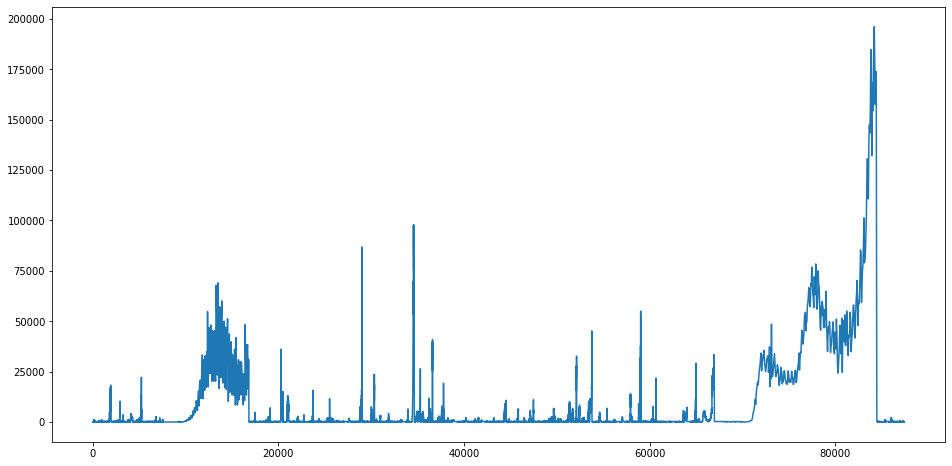

In [149]:
df['new_cases'].plot(figsize=(16,8))

## Countries Split

In [150]:
df_cases_country = {}
sns.set(palette = 'Set1',style='darkgrid')
#Function for making a time serie on a designated country and plotting the rolled mean and standard 
def roll(country,case='new_cases'):
    time_series=df.loc[(df['Country']==country)]  
    # time_series=time_series[['Date',case]]
    time_series=time_series.set_index('Date')
    time_series.astype('int64')
    #return (time_series.rolling(window=4,center=False).mean())
    return time_series


for country in (unique(df['Country'])):
  df_count=df.loc[(df['Country']==country)] 
  if (max(df_count['State'])==0):
    df_cases_country[country]= roll(country)
  

In [151]:
df_cases_country[0]

,Country,State,total_cases,new_cases,total_deaths,new_deaths,new_tests,total_tests,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,diabetes_prevalence,female_smokers,male_smokers,hospital_beds_per_thousand,school_closing,workplace_closing,cancel_public_events,restrictions_on_gathering,close_public_transport,stay_at_home,restrictions_on_internal_movement,international_travel_controls,income_support,debt_relief,public_information_campaigns,testing_policy,contact_tracing,population,net_change,density_P/Km²,land_area_Km²,migrants_net,yearly_change,fert_Rate,urban_pop_%,world_share,average_temperature,minimum_temperature,maximum_temperature,rainfall,relative_humidity,first_confirmed_case,first_fatalities,cardiovascular_diseases_%,cancers_%,diabetes_blood_endocrine_diseases_%,respiratory_diseases_%,liver_disease_%,diarrhea_common_infectious_diseases_%,musculoskeletal_disorders_%,HIV/AIDS_tuberculosis_%,malaria_neglected_tropical_diseases_%,nutritional_deficiencies_%,pneumonia-death-rates,share_of_deaths_from_smoking_%,hospital_beds_per10k,hospital_density,nbr_surgeons,nbr_obstetricians,nbr_anaesthesiologists,medical_doctors_per10k,year,month,day
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2020-01-01,0,0,0.0,0.0,0.0,0.0,183.0,183.0,18.6,2.581,1.337,1803.987,1.2,9.59,11.2,24.6,0.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,38928341.0,886592.0,60.0,652860.0,-62920.0,2.33,4.6,25.0,0.5,5.027778,0.444444,9.555556,0.000,55.903534,2020-02-24,2020-03-22,8.953006,3.372082,5.27328,1.96317,0.498116,15.825522,1.962412,2.938014,1.393345,1.77003,70.614333,3.56,5.0,0.085,70298.0,25013.0,8.0,2.84,2020,1,1
2020-01-02,0,0,0.0,0.0,0.0,0.0,183.0,183.0,18.6,2.581,1.337,1803.987,1.2,9.59,11.2,24.6,0.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,38928341.0,886592.0,60.0,652860.0,-62920.0,2.33,4.6,25.0,0.5,2.194444,-0.805556,6.194444,1.143,78.143671,2020-02-24,2020-03-22,8.953006,3.372082,5.27328,1.96317,0.498116,15.825522,1.962412,2.938014,1.393345,1.77003,70.614333,3.56,5.0,0.085,70298.0,25013.0,8.0,2.84,2020,1,2
2020-01-03,0,0,0.0,0.0,0.0,0.0,183.0,183.0,18.6,2.581,1.337,1803.987,1.2,9.59,11.2,24.6,0.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,38928341.0,886592.0,60.0,652860.0,-62920.0,2.33,4.6,25.0,0.5,1.916667,-2.750000,7.000000,4.953,79.131404,2020-02-24,2020-03-22,8.953006,3.372082,5.27328,1.96317,0.498116,15.825522,1.962412,2.938014,1.393345,1.77003,70.614333,3.56,5.0,0.085,70298.0,25013.0,8.0,2.84,2020,1,3
2020-01-04,0,0,0.0,0.0,0.0,0.0,183.0,183.0,18.6,2.581,1.337,1803.987,1.2,9.59,11.2,24.6,0.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,38928341.0,886592.0,60.0,652860.0,-62920.0,2.33,4.6,25.0,0.5,1.888889,-2.166667,5.277778,6.096,74.746707,2020-02-24,2020-03-22,8.953006,3.372082,5.27328,1.96317,0.498116,15.825522,1.962412,2.938014,1.393345,1.77003,70.614333,3.56,5.0,0.085,70298.0,25013.0,8.0,2.84,2020,1,4
2020-01-05,0,0,0.0,0.0,0.0,0.0,183.0,183.0,18.6,2.581,1.337,1803.987,1.2,9.59,11.2,24.6,0.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,38928341.0,886592.0,60.0,652860.0,-62920.0,2.33,4.6,25.0,0.5,1.500000,-0.750000,2.944444,2.413,84.431231,2020-02-24,2020-03-22,8.953006,3.372082,5.27328,1.96317,0.498116,15.825522,1.962412,2.938014,1.393345,1.77003,70.614333,3.56,5.0,0.085,70298.0,25013.0,8.0,2.84,2020,1,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-11-21,0,0,44365.0,232.0,1675.0,25.0,183.0,183.0,18.6,2.581,1.337,1803.987,1.2,9.59,11.2,24.6,0.5,4.0,4.0,3.0,5.0,3.0,4.0,3.0,5.0,3.0,3.0,3.0,4.0,3.0,38928341.0,886592.0,60.0,652860.0,-62920.0,2.33,4.6,25.0,0.5,28.555556,24.000000,32.000000,0.000,67.135487,2020-02-24,2020-03-22,8.953006,3.372082,5.27328,1.96317,0.498116,15.825522,1.962412,2.938014,1.393345,1.77003,70.614333,3.56,5

In [152]:
len(df_cases_country)

182

In [153]:
for country in (unique(df['Country'])):
  df_cases_country[country]=df_cases_country[country].dropna()

In [154]:
len(df_cases_country)

182

In [155]:
df_decomposition={}
from pylab import rcParams
import matplotlib.pyplot 
import statsmodels.api as sm
def plot_seasonal_decomposition(df):
  fig_decomp = matplotlib.pyplot.figure(figsize=(8.0, 5.0))
  decomposed_cases_volume = sm.tsa.seasonal_decompose(df["new_cases"].values,model='additive',freq=7, extrapolate_trend='freq') # The frequncy is set to 7 days
  plt=decomposed_cases_volume.plot()
  return decomposed_cases_volume

<Figure size 576x360 with 0 Axes>

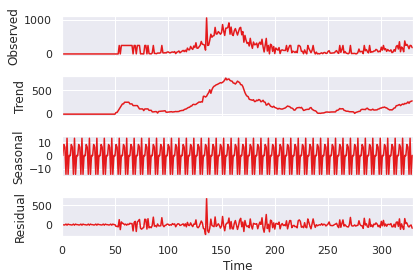

<Figure size 576x360 with 0 Axes>

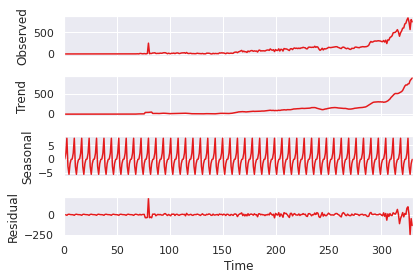

<Figure size 576x360 with 0 Axes>

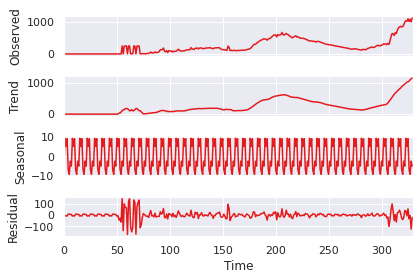

<Figure size 576x360 with 0 Axes>

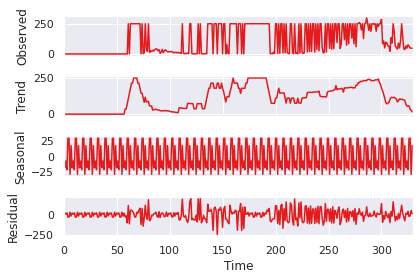

<Figure size 576x360 with 0 Axes>

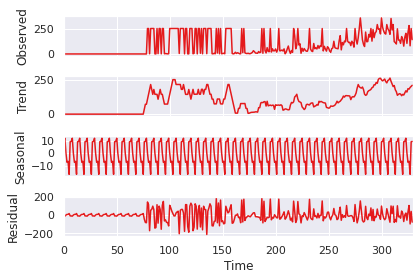

<Figure size 576x360 with 0 Axes>

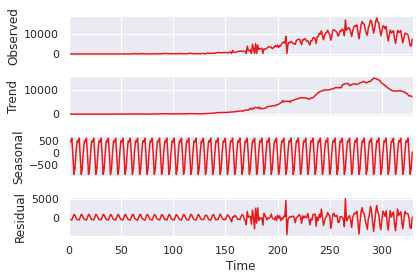

<Figure size 576x360 with 0 Axes>

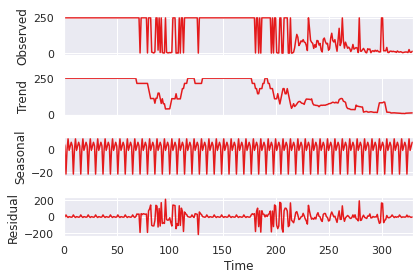

<Figure size 576x360 with 0 Axes>

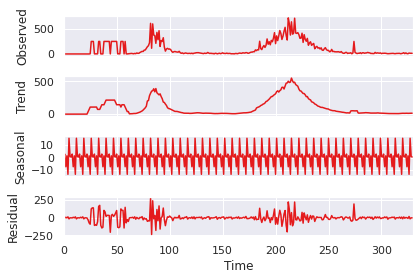

<Figure size 576x360 with 0 Axes>

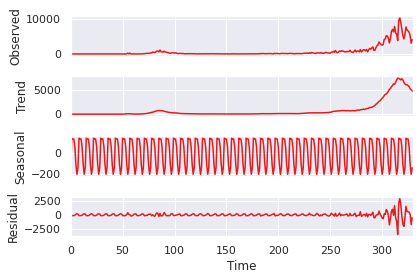

<Figure size 576x360 with 0 Axes>

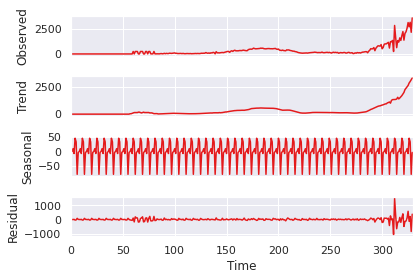

<Figure size 576x360 with 0 Axes>

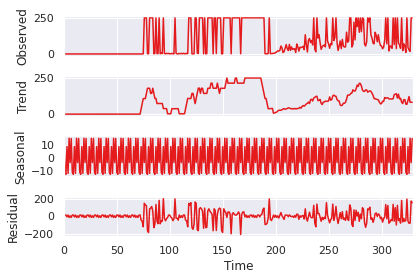

<Figure size 576x360 with 0 Axes>

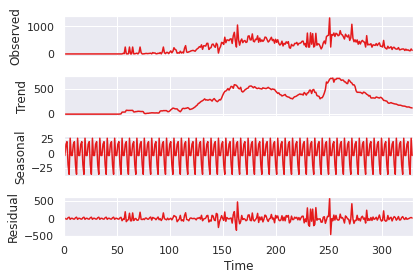

<Figure size 576x360 with 0 Axes>

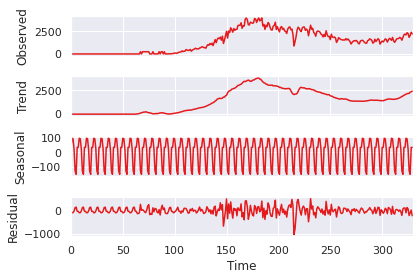

<Figure size 576x360 with 0 Axes>

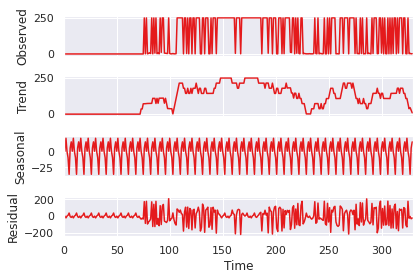

<Figure size 576x360 with 0 Axes>

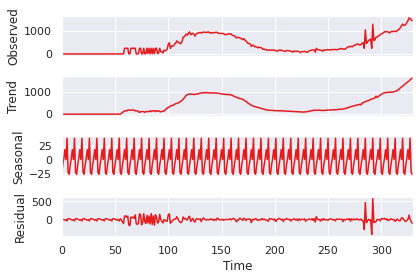

<Figure size 576x360 with 0 Axes>

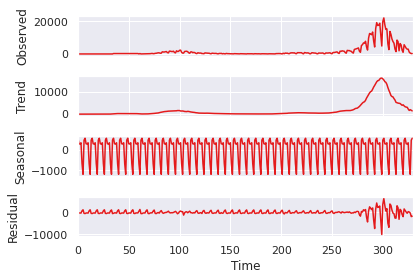

<Figure size 576x360 with 0 Axes>

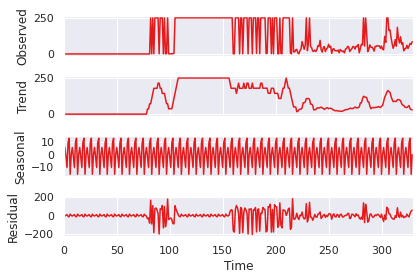

<Figure size 576x360 with 0 Axes>

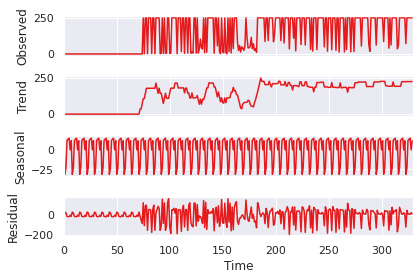

<Figure size 576x360 with 0 Axes>

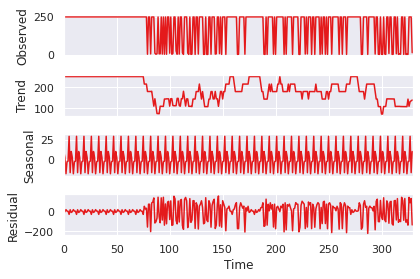

<Figure size 576x360 with 0 Axes>

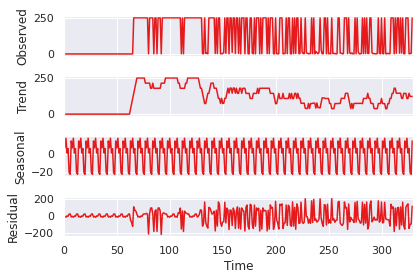

<Figure size 576x360 with 0 Axes>

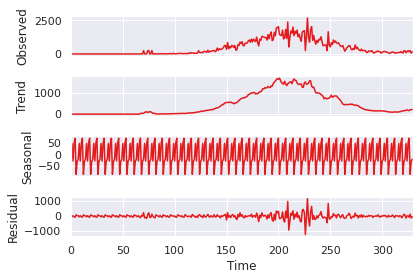

<Figure size 576x360 with 0 Axes>

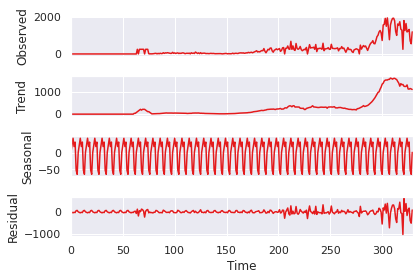

<Figure size 576x360 with 0 Axes>

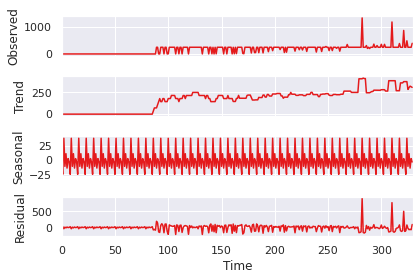

<Figure size 576x360 with 0 Axes>

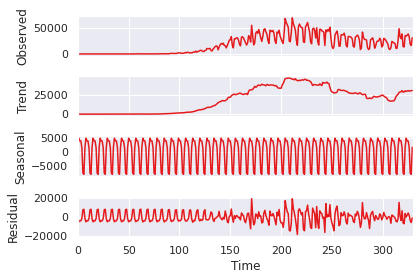

<Figure size 576x360 with 0 Axes>

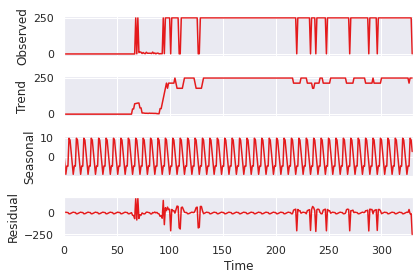

<Figure size 576x360 with 0 Axes>

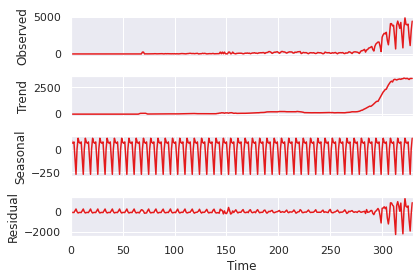

<Figure size 576x360 with 0 Axes>

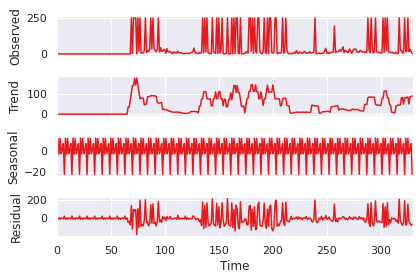

<Figure size 576x360 with 0 Axes>

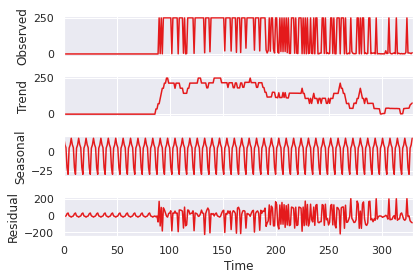

<Figure size 576x360 with 0 Axes>

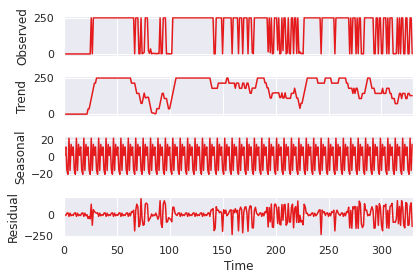

<Figure size 576x360 with 0 Axes>

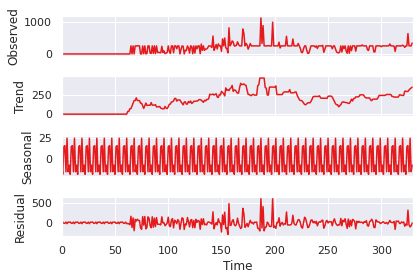

<Figure size 576x360 with 0 Axes>

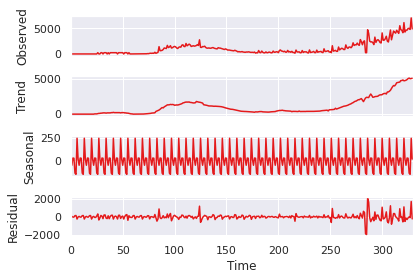

<Figure size 576x360 with 0 Axes>

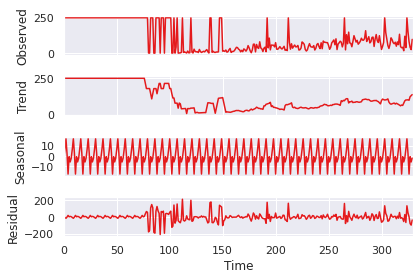

<Figure size 576x360 with 0 Axes>

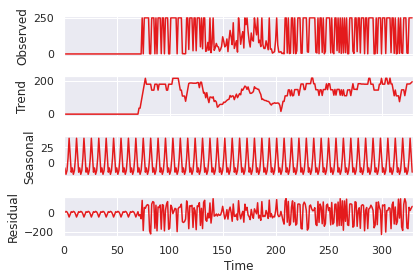

<Figure size 576x360 with 0 Axes>

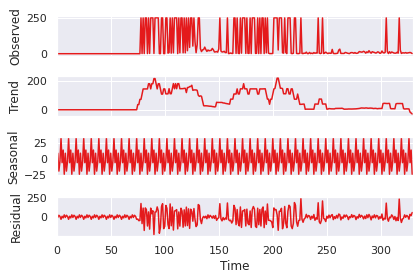

<Figure size 576x360 with 0 Axes>

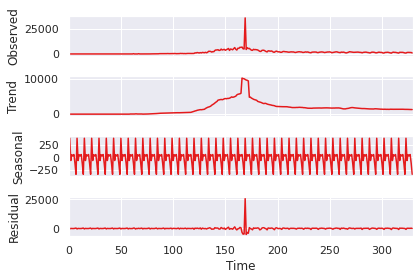

<Figure size 576x360 with 0 Axes>

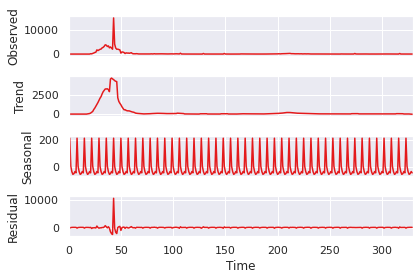

<Figure size 576x360 with 0 Axes>

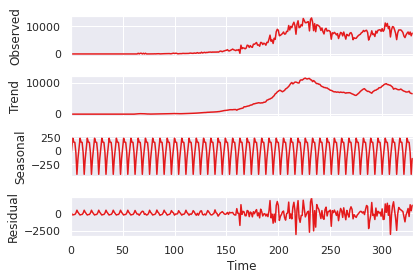

<Figure size 576x360 with 0 Axes>

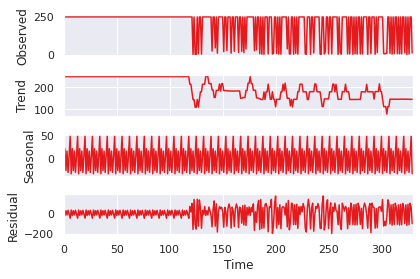

<Figure size 576x360 with 0 Axes>

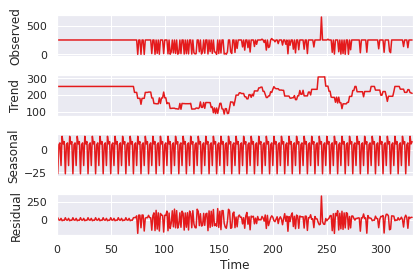

<Figure size 576x360 with 0 Axes>

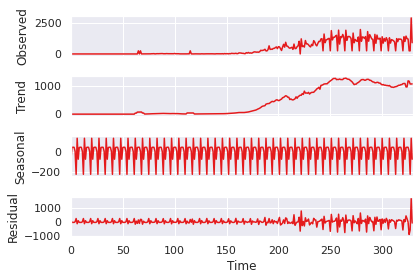

<Figure size 576x360 with 0 Axes>

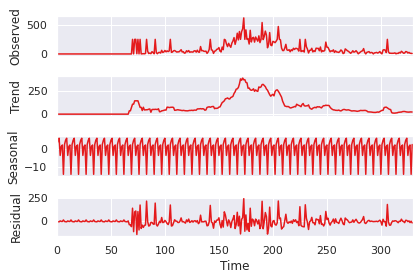

<Figure size 576x360 with 0 Axes>

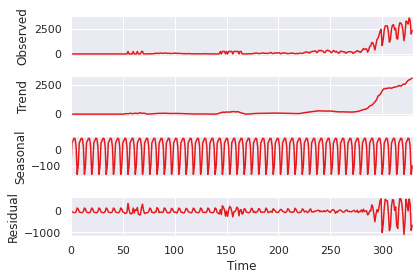

<Figure size 576x360 with 0 Axes>

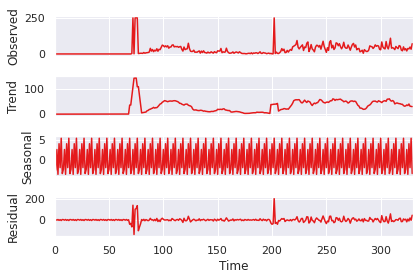

<Figure size 576x360 with 0 Axes>

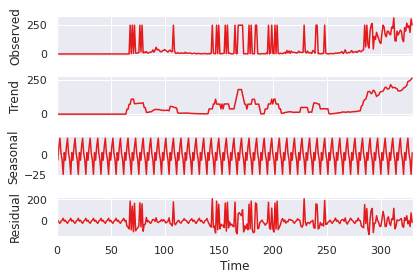

<Figure size 576x360 with 0 Axes>

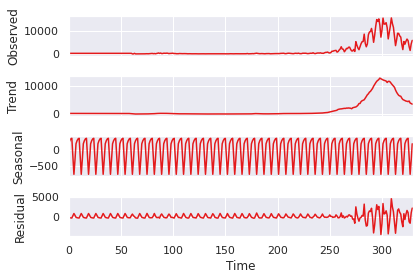

<Figure size 576x360 with 0 Axes>

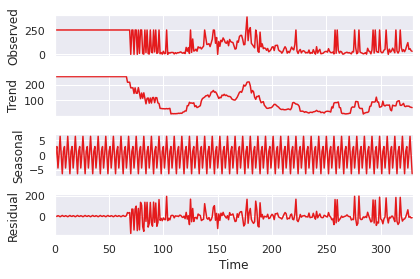

<Figure size 576x360 with 0 Axes>

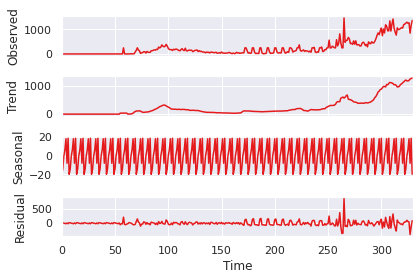

<Figure size 576x360 with 0 Axes>

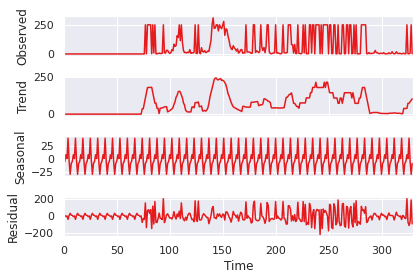

<Figure size 576x360 with 0 Axes>

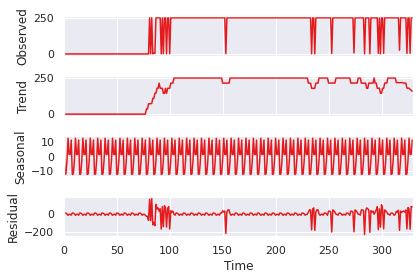

<Figure size 576x360 with 0 Axes>

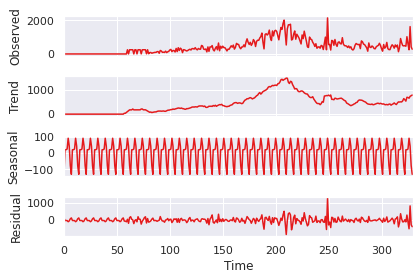

<Figure size 576x360 with 0 Axes>

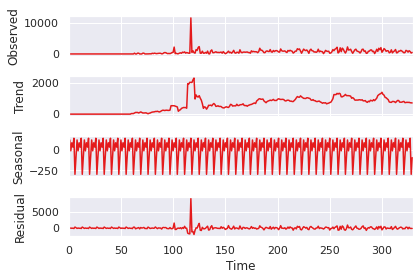

<Figure size 576x360 with 0 Axes>

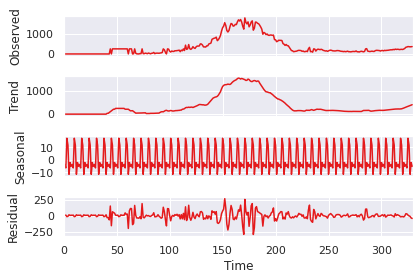

<Figure size 576x360 with 0 Axes>

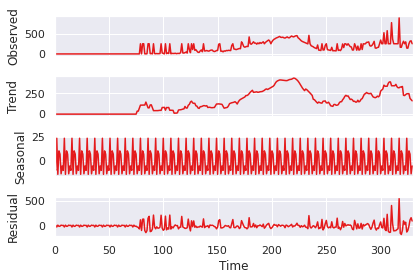

<Figure size 576x360 with 0 Axes>

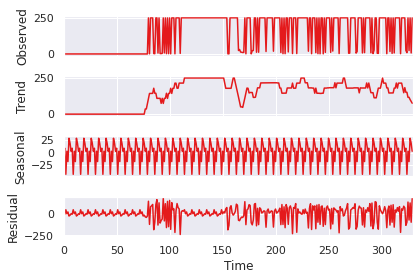

<Figure size 576x360 with 0 Axes>

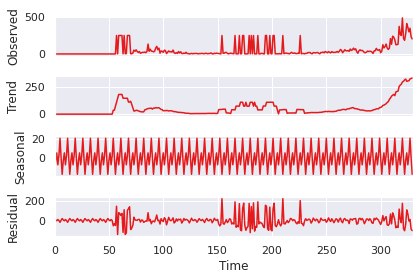

<Figure size 576x360 with 0 Axes>

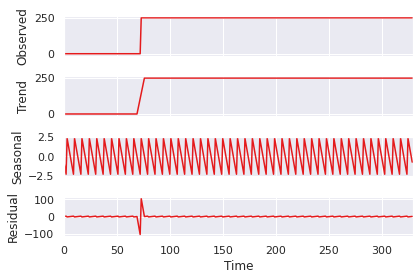

<Figure size 576x360 with 0 Axes>

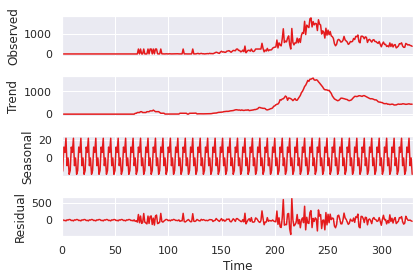

<Figure size 576x360 with 0 Axes>

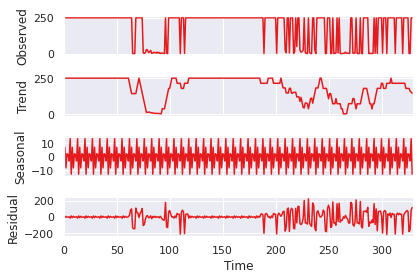

<Figure size 576x360 with 0 Axes>

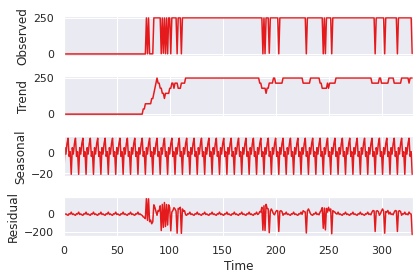

<Figure size 576x360 with 0 Axes>

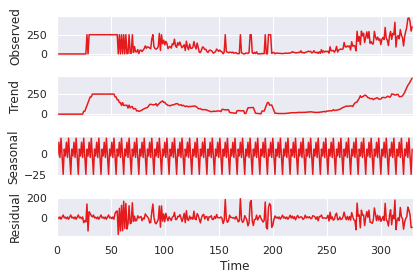

<Figure size 576x360 with 0 Axes>

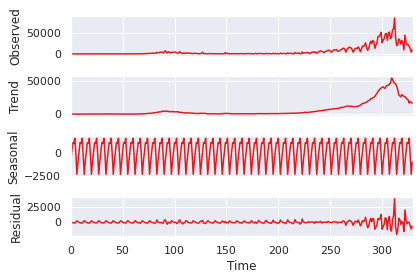

<Figure size 576x360 with 0 Axes>

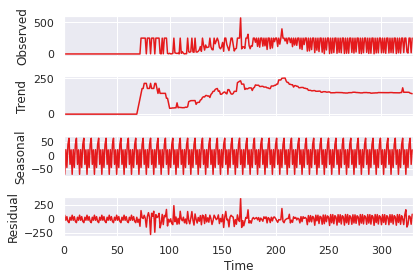

<Figure size 576x360 with 0 Axes>

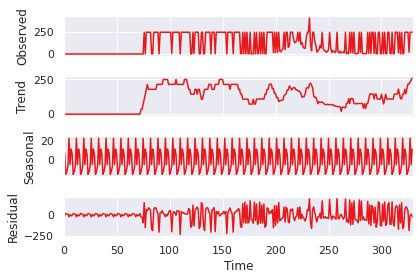

<Figure size 576x360 with 0 Axes>

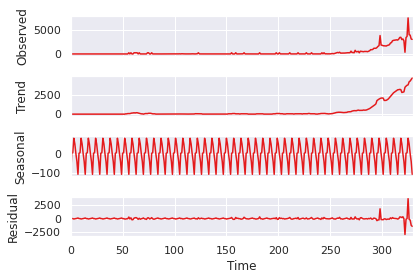

<Figure size 576x360 with 0 Axes>

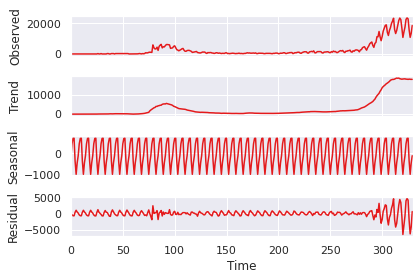

<Figure size 576x360 with 0 Axes>

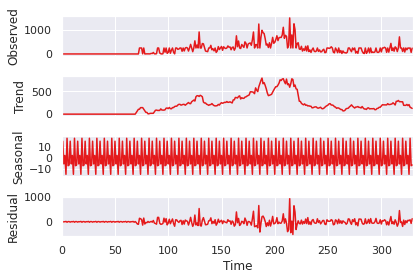

<Figure size 576x360 with 0 Axes>

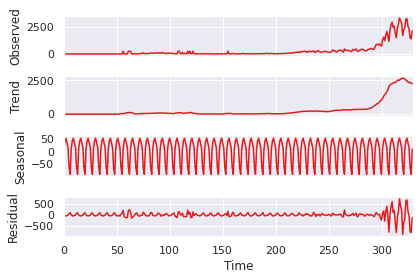

<Figure size 576x360 with 0 Axes>

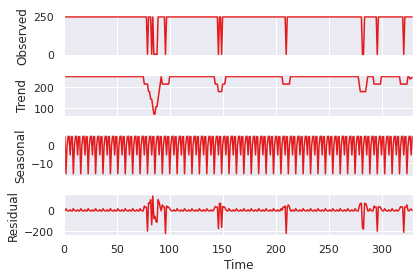

<Figure size 576x360 with 0 Axes>

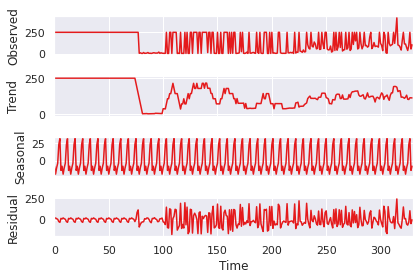

<Figure size 576x360 with 0 Axes>

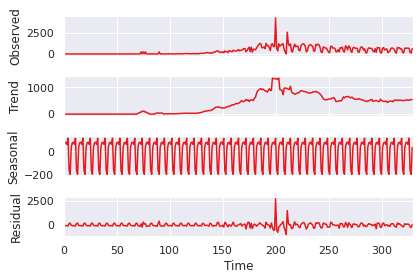

<Figure size 576x360 with 0 Axes>

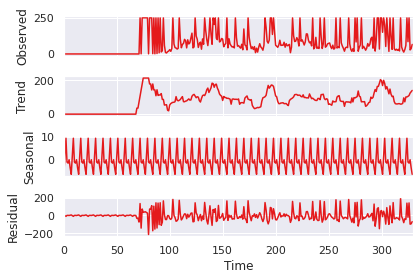

<Figure size 576x360 with 0 Axes>

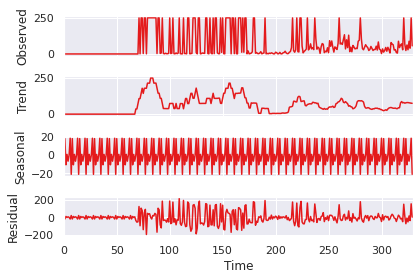

<Figure size 576x360 with 0 Axes>

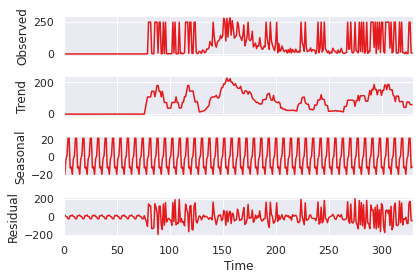

<Figure size 576x360 with 0 Axes>

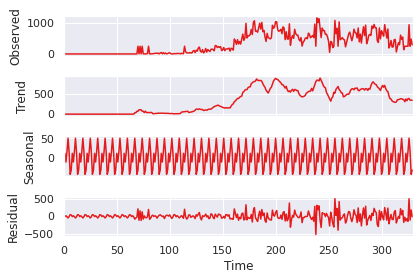

<Figure size 576x360 with 0 Axes>

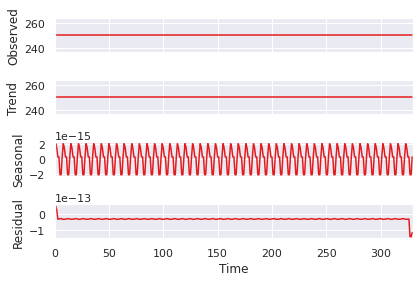

<Figure size 576x360 with 0 Axes>

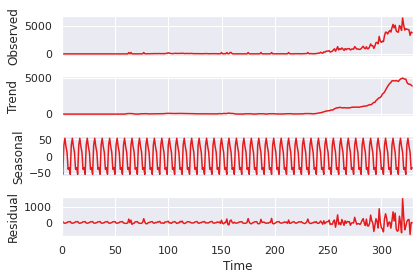

<Figure size 576x360 with 0 Axes>

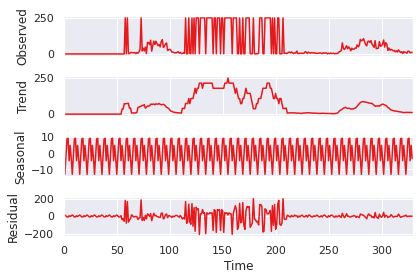

<Figure size 576x360 with 0 Axes>

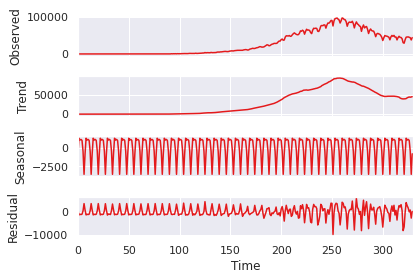

<Figure size 576x360 with 0 Axes>

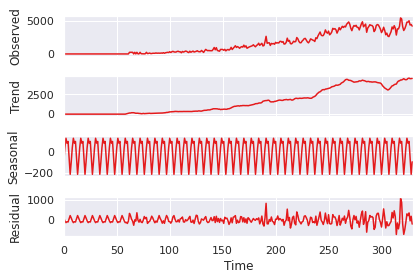

<Figure size 576x360 with 0 Axes>

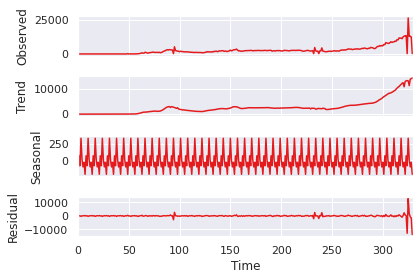

<Figure size 576x360 with 0 Axes>

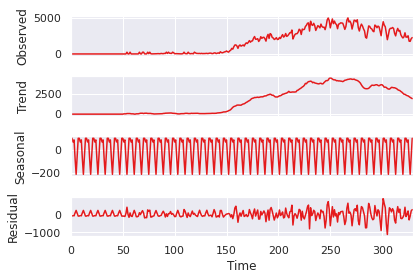

<Figure size 576x360 with 0 Axes>

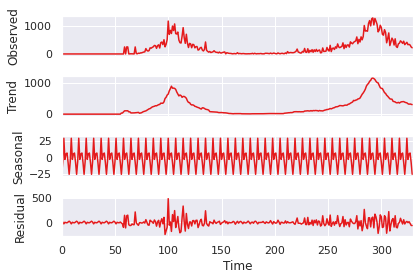

<Figure size 576x360 with 0 Axes>

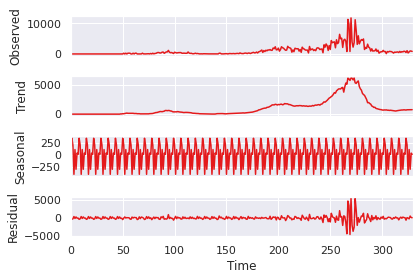

<Figure size 576x360 with 0 Axes>

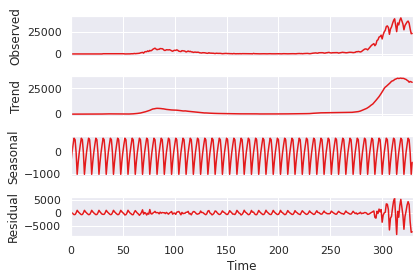

<Figure size 576x360 with 0 Axes>

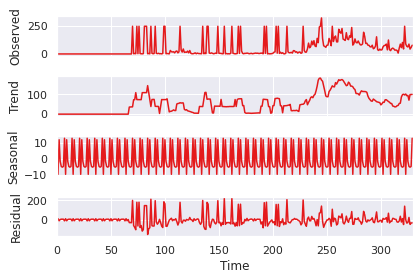

<Figure size 576x360 with 0 Axes>

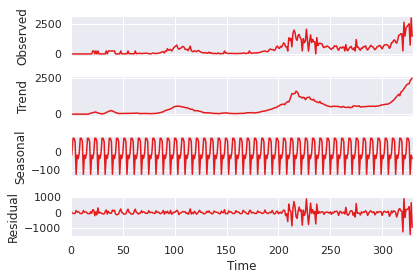

<Figure size 576x360 with 0 Axes>

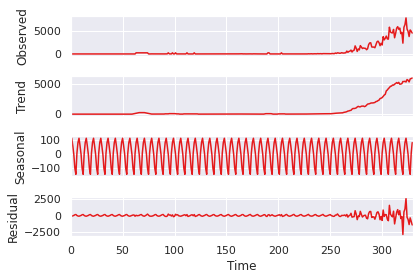

<Figure size 576x360 with 0 Axes>

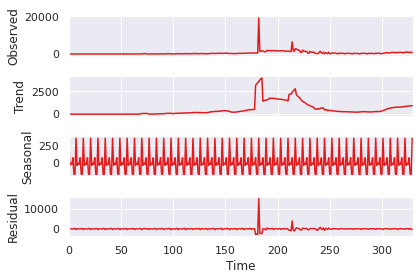

<Figure size 576x360 with 0 Axes>

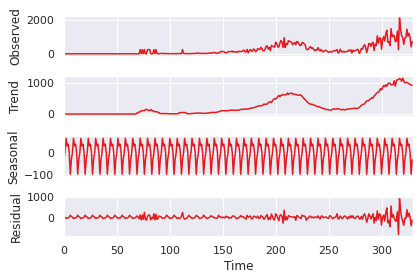

<Figure size 576x360 with 0 Axes>

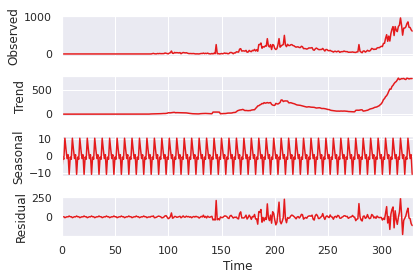

<Figure size 576x360 with 0 Axes>

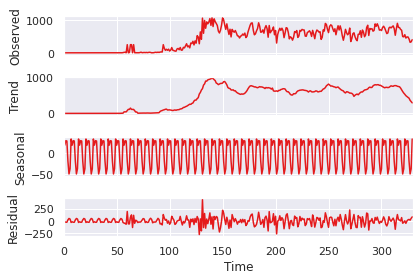

<Figure size 576x360 with 0 Axes>

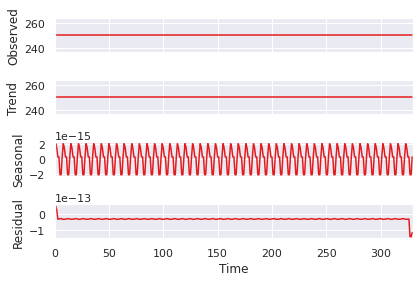

<Figure size 576x360 with 0 Axes>

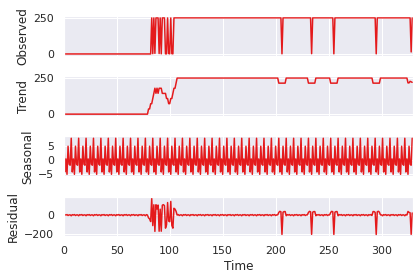

<Figure size 576x360 with 0 Axes>

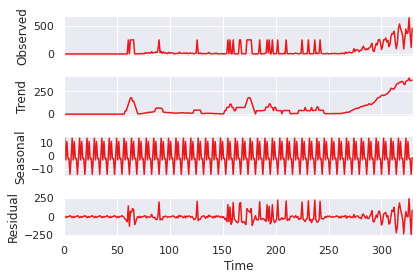

<Figure size 576x360 with 0 Axes>

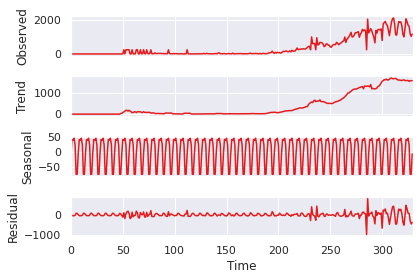

<Figure size 576x360 with 0 Axes>

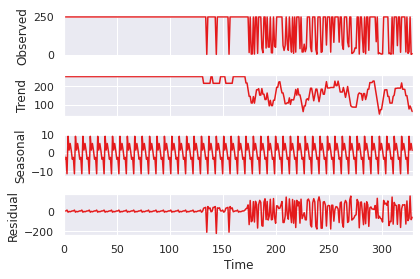

<Figure size 576x360 with 0 Axes>

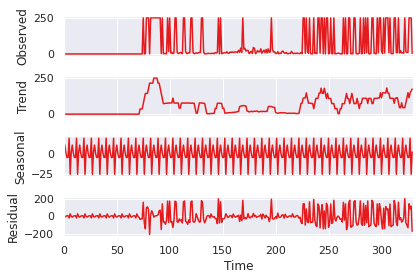

<Figure size 576x360 with 0 Axes>

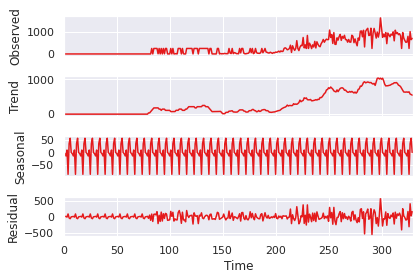

<Figure size 576x360 with 0 Axes>

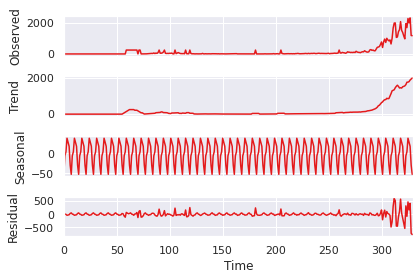

<Figure size 576x360 with 0 Axes>

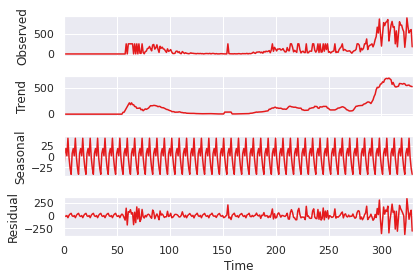

<Figure size 576x360 with 0 Axes>

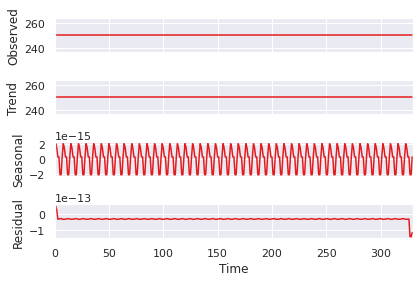

<Figure size 576x360 with 0 Axes>

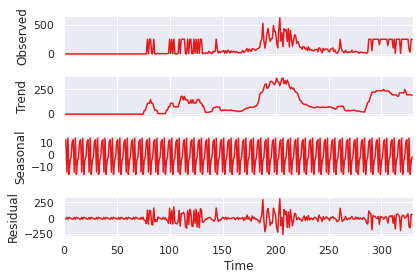

<Figure size 576x360 with 0 Axes>

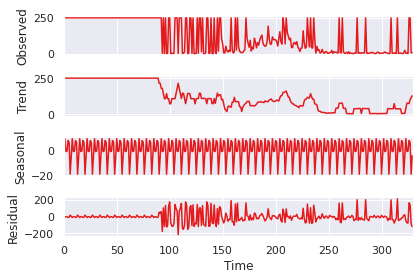

<Figure size 576x360 with 0 Axes>

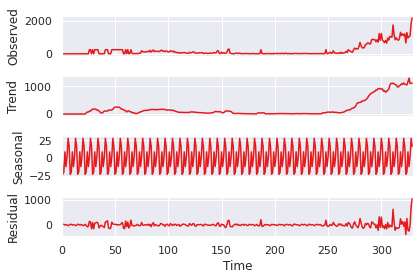

<Figure size 576x360 with 0 Axes>

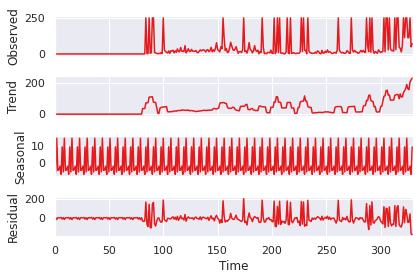

<Figure size 576x360 with 0 Axes>

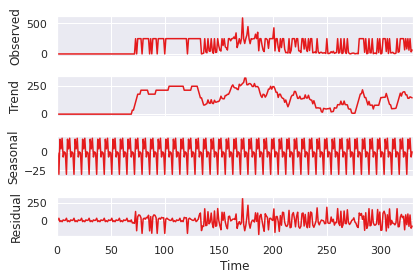

<Figure size 576x360 with 0 Axes>

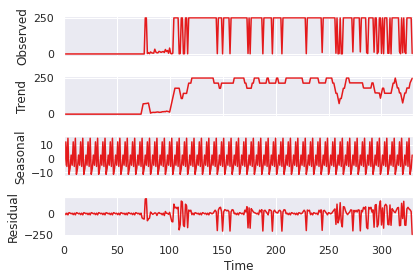

<Figure size 576x360 with 0 Axes>

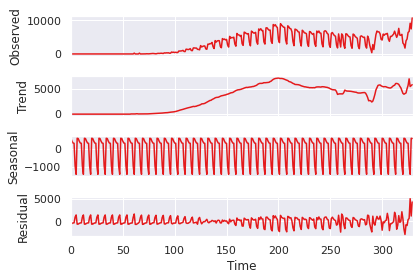

<Figure size 576x360 with 0 Axes>

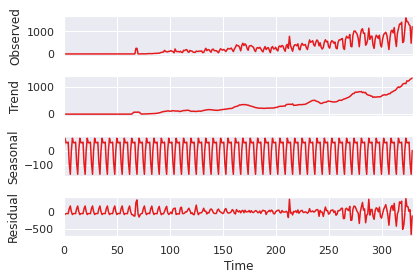

<Figure size 576x360 with 0 Axes>

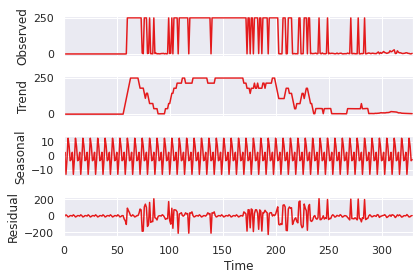

<Figure size 576x360 with 0 Axes>

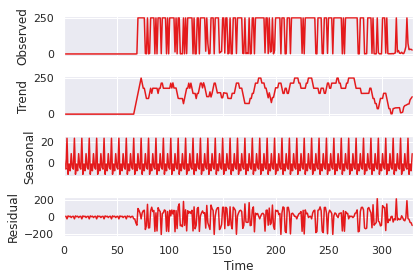

<Figure size 576x360 with 0 Axes>

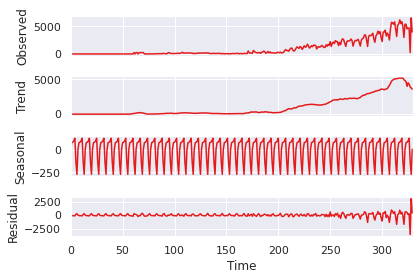

<Figure size 576x360 with 0 Axes>

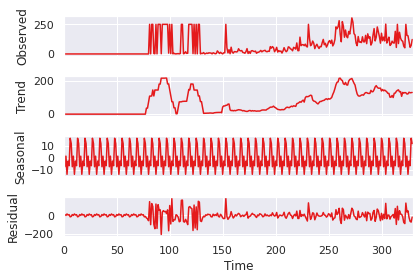

<Figure size 576x360 with 0 Axes>

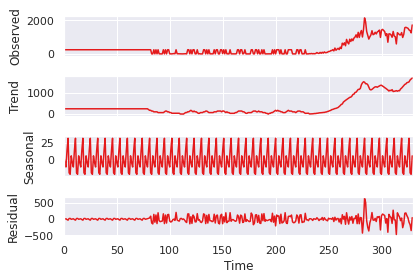

<Figure size 576x360 with 0 Axes>

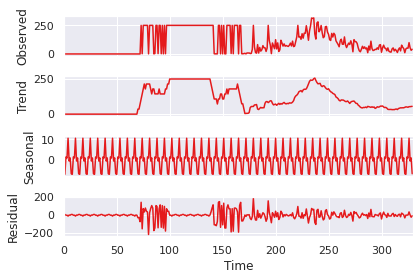

<Figure size 576x360 with 0 Axes>

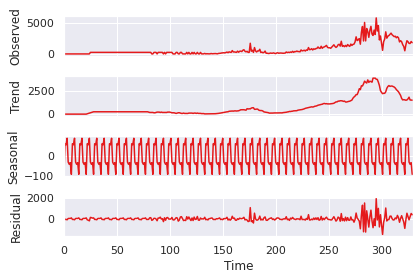

<Figure size 576x360 with 0 Axes>

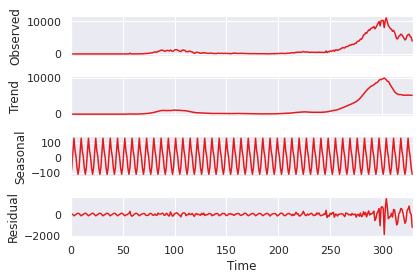

<Figure size 576x360 with 0 Axes>

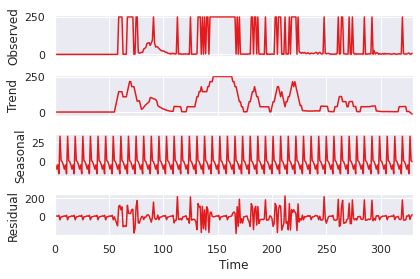

<Figure size 576x360 with 0 Axes>

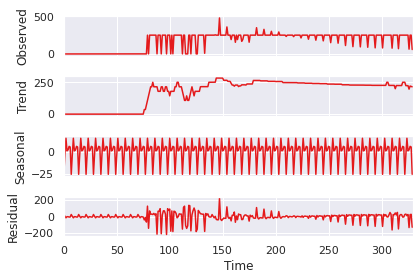

<Figure size 576x360 with 0 Axes>

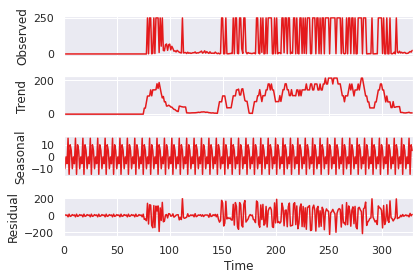

<Figure size 576x360 with 0 Axes>

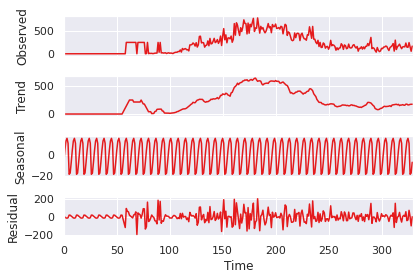

<Figure size 576x360 with 0 Axes>

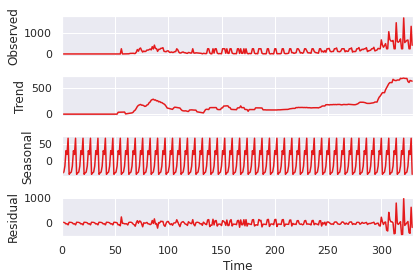

<Figure size 576x360 with 0 Axes>

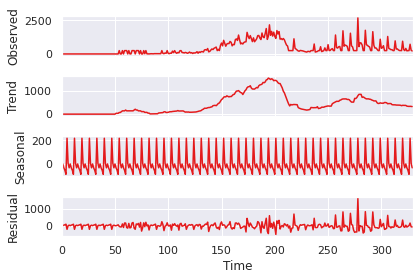

<Figure size 576x360 with 0 Axes>

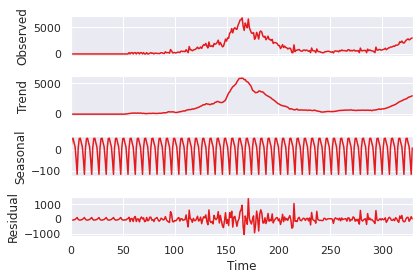

<Figure size 576x360 with 0 Axes>

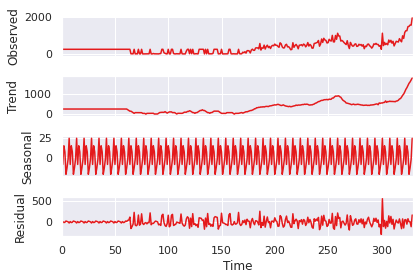

<Figure size 576x360 with 0 Axes>

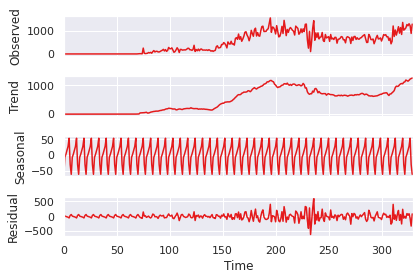

<Figure size 576x360 with 0 Axes>

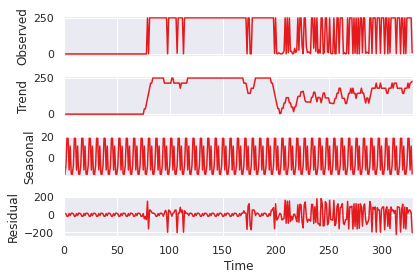

<Figure size 576x360 with 0 Axes>

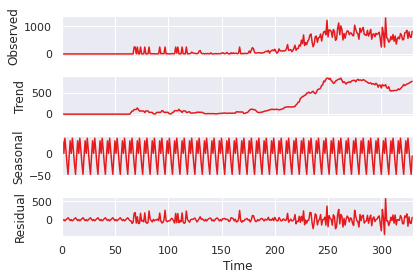

<Figure size 576x360 with 0 Axes>

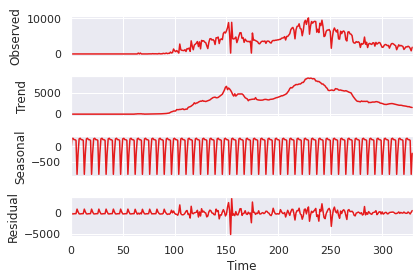

<Figure size 576x360 with 0 Axes>

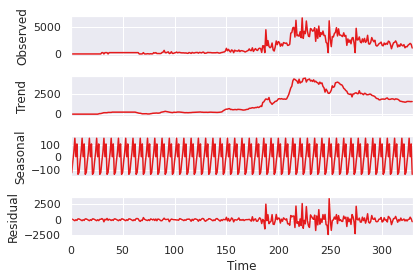

<Figure size 576x360 with 0 Axes>

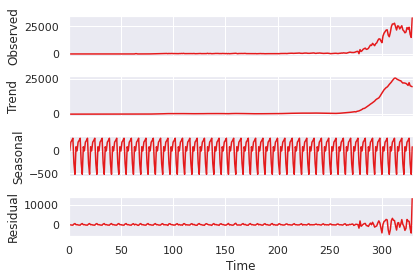

<Figure size 576x360 with 0 Axes>

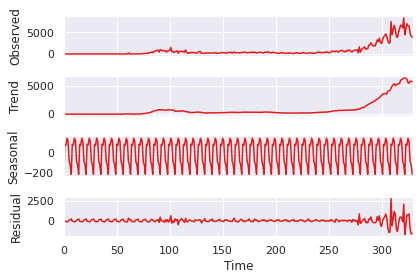

<Figure size 576x360 with 0 Axes>

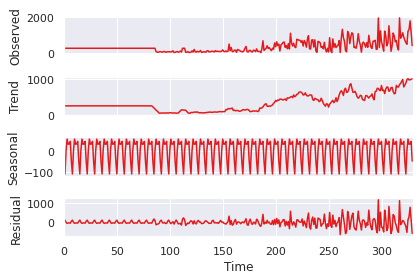

<Figure size 576x360 with 0 Axes>

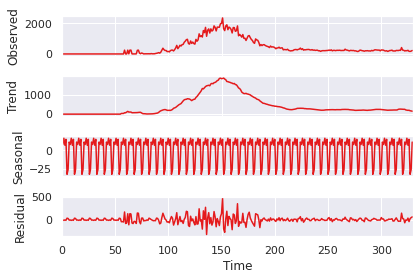

<Figure size 576x360 with 0 Axes>

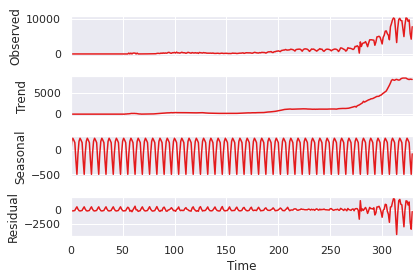

<Figure size 576x360 with 0 Axes>

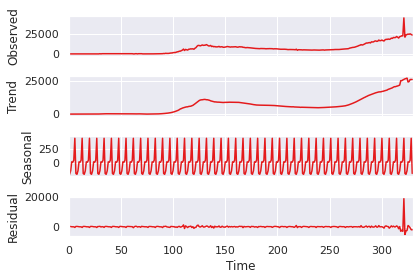

<Figure size 576x360 with 0 Axes>

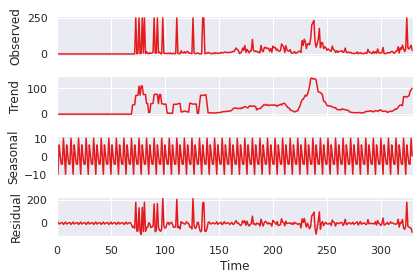

<Figure size 576x360 with 0 Axes>

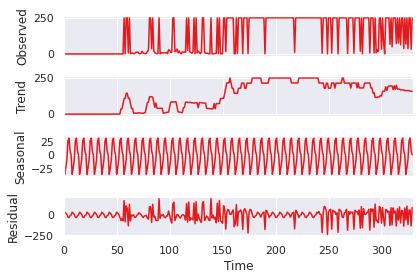

<Figure size 576x360 with 0 Axes>

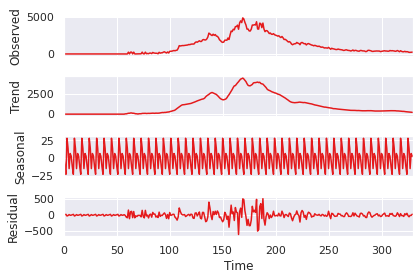

<Figure size 576x360 with 0 Axes>

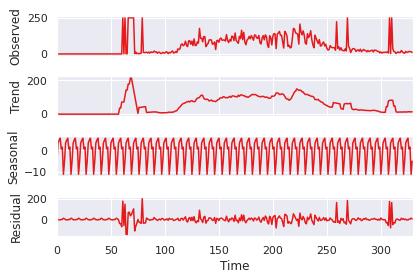

<Figure size 576x360 with 0 Axes>

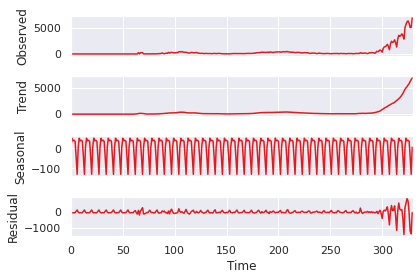

<Figure size 576x360 with 0 Axes>

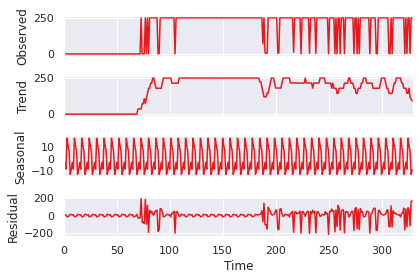

<Figure size 576x360 with 0 Axes>

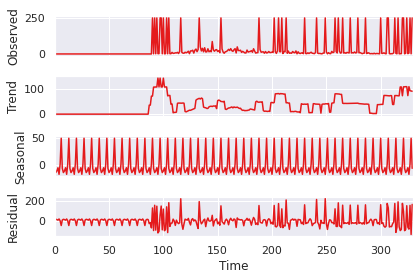

<Figure size 576x360 with 0 Axes>

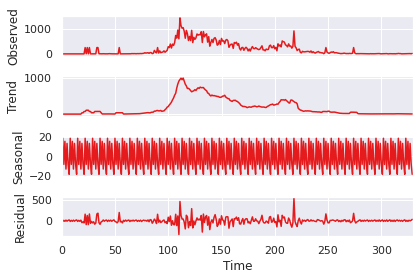

<Figure size 576x360 with 0 Axes>

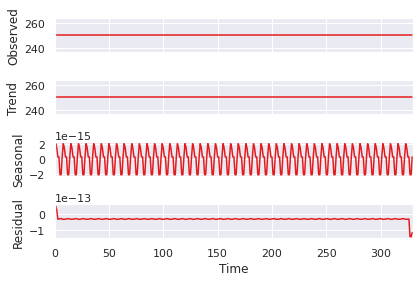

<Figure size 576x360 with 0 Axes>

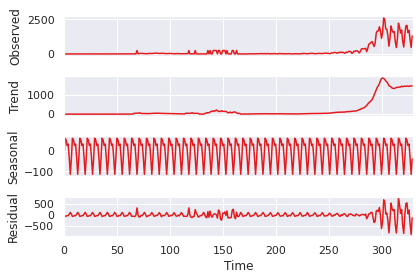

<Figure size 576x360 with 0 Axes>

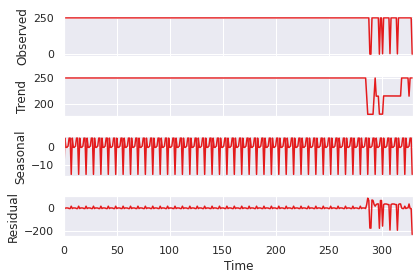

<Figure size 576x360 with 0 Axes>

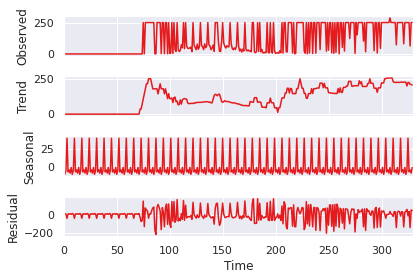

<Figure size 576x360 with 0 Axes>

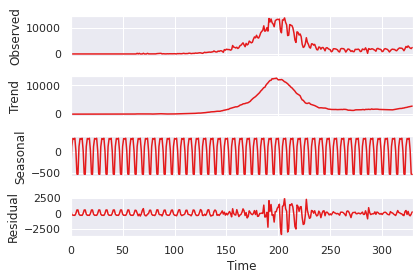

<Figure size 576x360 with 0 Axes>

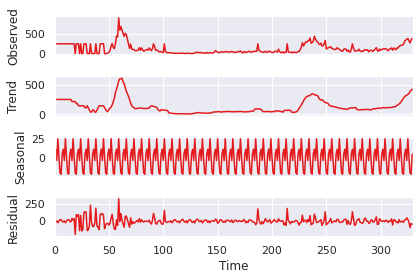

<Figure size 576x360 with 0 Axes>

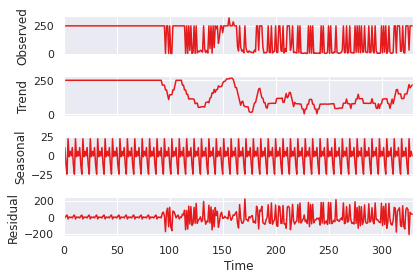

<Figure size 576x360 with 0 Axes>

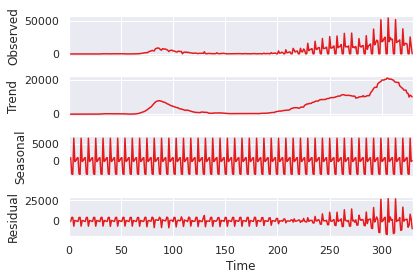

<Figure size 576x360 with 0 Axes>

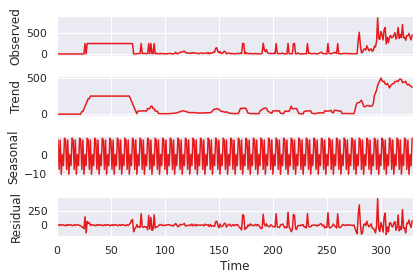

<Figure size 576x360 with 0 Axes>

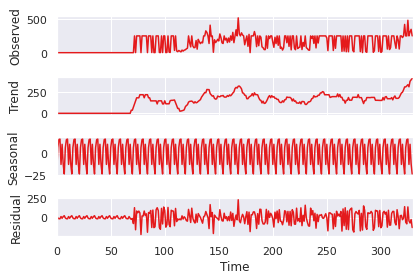

<Figure size 576x360 with 0 Axes>

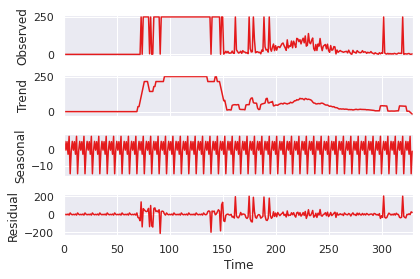

<Figure size 576x360 with 0 Axes>

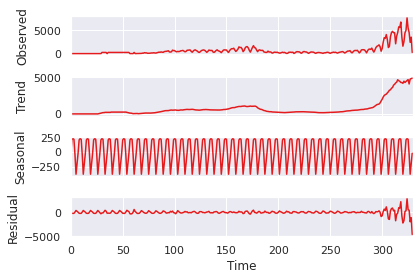

<Figure size 576x360 with 0 Axes>

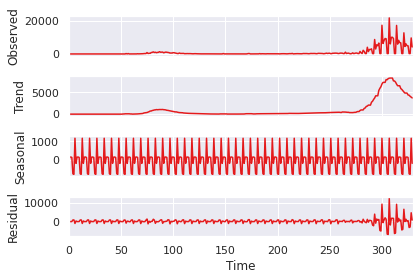

<Figure size 576x360 with 0 Axes>

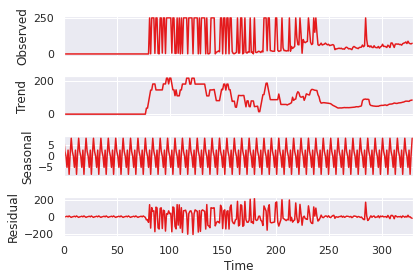

<Figure size 576x360 with 0 Axes>

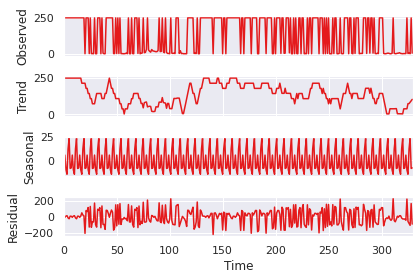

<Figure size 576x360 with 0 Axes>

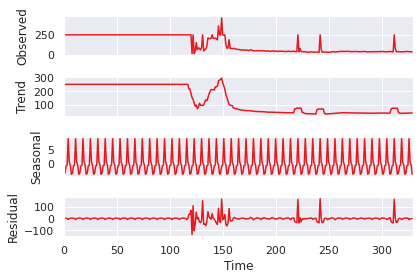

<Figure size 576x360 with 0 Axes>

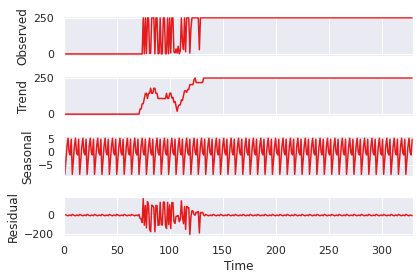

<Figure size 576x360 with 0 Axes>

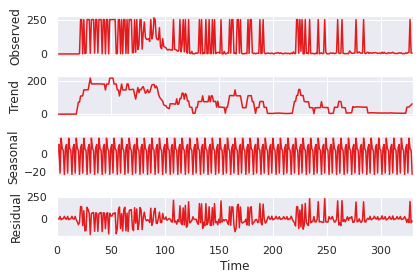

<Figure size 576x360 with 0 Axes>

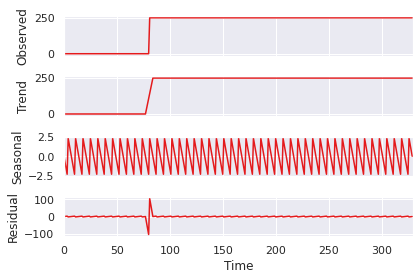

<Figure size 576x360 with 0 Axes>

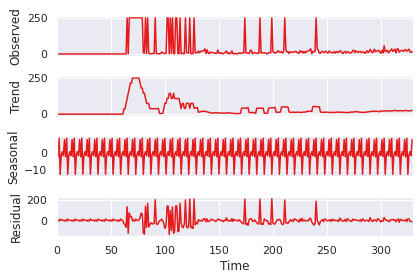

<Figure size 576x360 with 0 Axes>

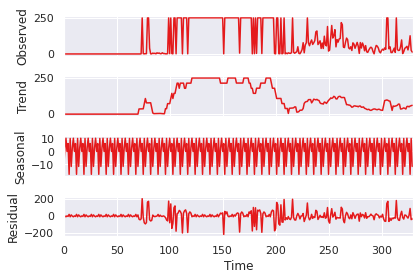

<Figure size 576x360 with 0 Axes>

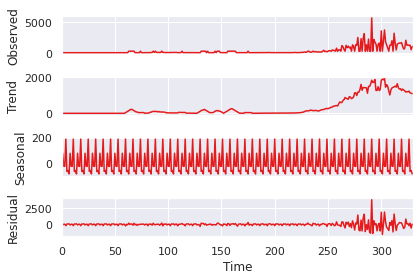

<Figure size 576x360 with 0 Axes>

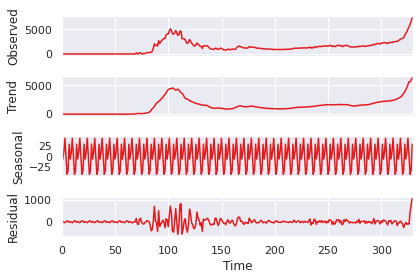

<Figure size 576x360 with 0 Axes>

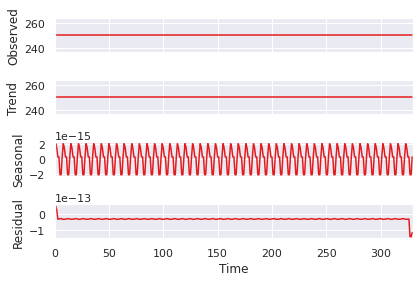

<Figure size 576x360 with 0 Axes>

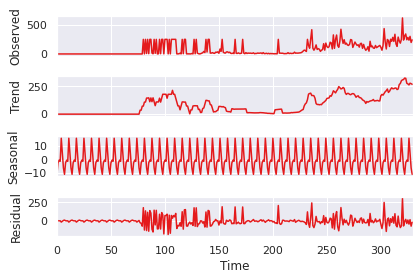

<Figure size 576x360 with 0 Axes>

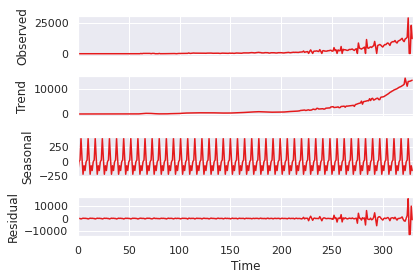

<Figure size 576x360 with 0 Axes>

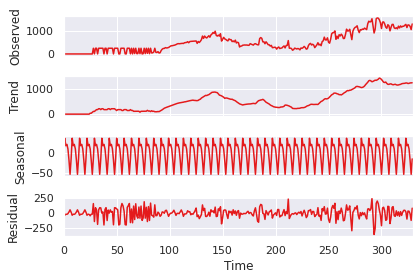

<Figure size 576x360 with 0 Axes>

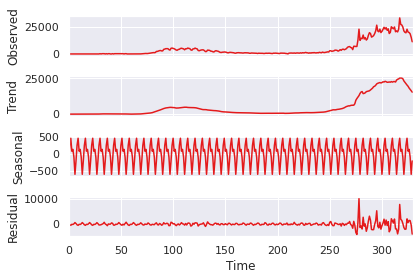

<Figure size 576x360 with 0 Axes>

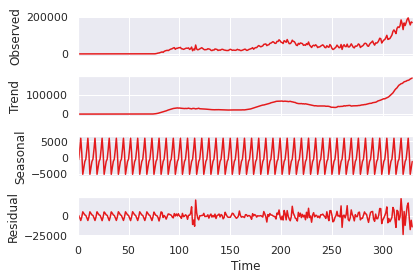

<Figure size 576x360 with 0 Axes>

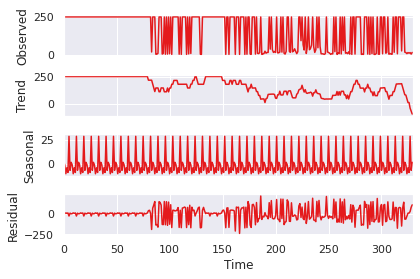

<Figure size 576x360 with 0 Axes>

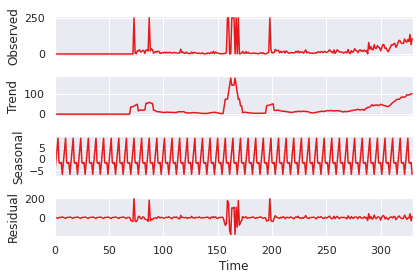

<Figure size 576x360 with 0 Axes>

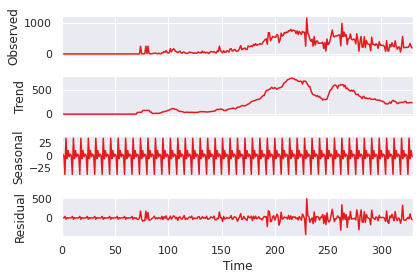

<Figure size 576x360 with 0 Axes>

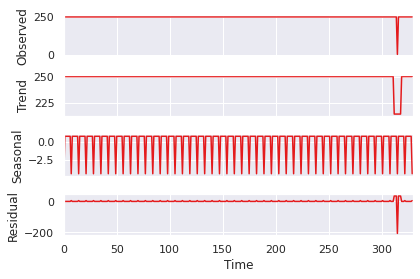

<Figure size 576x360 with 0 Axes>

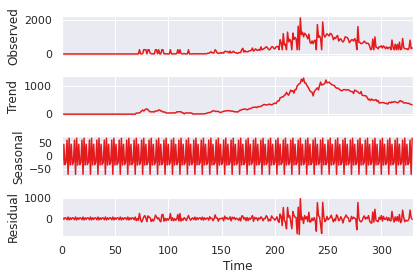

<Figure size 576x360 with 0 Axes>

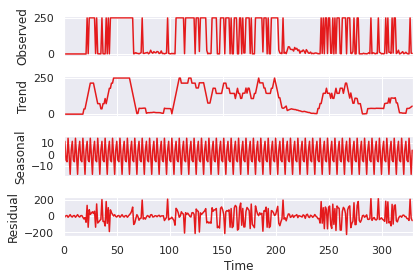

<Figure size 576x360 with 0 Axes>

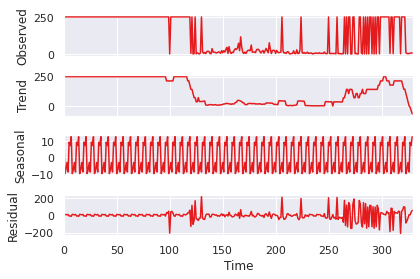

<Figure size 576x360 with 0 Axes>

In [ ]:
for country in (unique(df['Country'])):
  df_decomposition[country]=plot_seasonal_decomposition(df_cases_country[country])

In [ ]:
len(df_decomposition)

In [ ]:
df_decomposition[0].trend

## Detrending and deseasonalizing for each country

In [ ]:
for country in (unique(df['Country'])):
  trend = df_decomposition[country].trend
  season = df_decomposition[country].seasonal
  df_country=df_cases_country[country]
  target_variable='new_cases'
  df_country['%s_trend' % target_variable] = trend
  df_country['%s_seasonality' % target_variable] = season
  df_cases_country[country]=df_country

In [ ]:
df_cases_country[1]

## Stationary Time Series

The Augmented Dickey-Fuller test is a type of statistical test called a unit root test.

The intuition behind a unit root test is that it determines how strongly a time series is defined by a trend.

The null hypothesis of the test is that the time series can be represented by a unit root, that it is not stationary (has some time-dependent structure). The alternate hypothesis (rejecting the null hypothesis) is that the time series is stationary.

* Null Hypothesis (H0): If failed to be rejected, it suggests the time series has a unit root, meaning it is non-stationary. It has some time dependent structure.
* Alternate Hypothesis (H1): The null hypothesis is rejected; it suggests the time series does not have a unit root, meaning it is stationary. It does not have time-dependent structure.

p-value > 0.05: Fail to reject the null hypothesis (H0), the data has a unit root and is non-stationary.
p-value <= 0.05: Reject the null hypothesis (H0), the data does not have a unit root and is stationary.

Stationarity is important as non-stationary series that depend on time have too many parameters to account for when modelling the time series. diff() method can easily convert a non-stationary series to a stationary series.

We will try to decompose seasonal component of the above decomposed time series.

With the ADF test, the "null hypothesis" (the hypothesis that we either reject or fail to reject) is that the series follows a random walk. Therefore, a low p-value (say less than 5%) means we can reject the null hypothesis that the series is a random walk.

In [ ]:
from statsmodels.tsa.stattools import adfuller
stationary=[]
for country in (unique(df['Country'])):
  df_country=df_cases_country[country]
  # Augmented Dickey-Fuller test on new cases 
  adf = adfuller(df_country["new_cases"],regression='ct')
  print("p-value of new cases: {}".format(float(adf[1])))
  if(float(adf[1])<=0.05):
    stationary.append(country)
  print('ADF Statistic: %f' % adf[0])
  print('p-value: %f' % adf[1])
  print('Lags used: %d' % adf[2])
  print('Critical Values:')
  for key, value in adf[4].items():
    print('%s: %.3f' % (key, value))

Only 20 countries show stationary time series, i.e. independent of time

In [ ]:
len(stationary)

## Lags and Auto correlation plots

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from pandas.plotting import autocorrelation_plot

In [ ]:
for country in (unique(df['Country'])):
  df_country=df_cases_country[country]
    #autocorrelation_plot(df_country)
    #plt.figure()
  plt=autocorrelation_plot(df_country['new_cases'])


In [ ]:
for country in (unique(df['Country'])):
  df_country=df_cases_country[country]
  plot_acf(df_country['new_cases'],lags=25,title="New Cases Auto Correlation")

In [ ]:
nb_lags=5
for country in (unique(df['Country'])):
  for i in range(1, nb_lags + 1):
    lag_label = 'lag_' + str(i) 
    df_country=df_cases_country[country]
    df_country[lag_label] = df_country['new_cases'].shift(i)
    df_cases_country[country]=df_country

In [ ]:
df_cases_country[0]

## White Noise

White noise has

* Constant mean
* Constant variance
* Zero auto-correlation at all lags
We can notice below how all lags are statistically insigficant as they lie inside the confidence interval(shaded portion).

In [ ]:
import statsmodels.stats.diagnostic as smm
jungbox=[]
boxpierce=[]
for country in (unique(df['Country'])):
  if(country not in (176,177)): #united states and UK
    df_country=df_cases_country[country]
    arr = smm.acorr_ljungbox(df_country['new_cases'], boxpierce=True)
    df_jungbox = pd.DataFrame({'lb': arr[0], 'p-values': arr[1], 'bpvalue': arr[2], 'bpp-values': arr[3]})
    df_jungbox .index.name = 'lag_nb'
    if len(df_jungbox[df_jungbox['p-values'] <= 0.05]) == len(df_jungbox):
      print('all p-values for ljung box <= 0.05')
      jungbox.append(country)
    if len(df_jungbox[df_jungbox['bpp-values'] <= 0.05]) == len(df_jungbox):
      print('all p-values for box pierce <= 0.05')
      boxpierce.append(country)
    print('-----------------------------------------------')

In [ ]:
len(boxpierce)

In [ ]:
len(jungbox)

In [ ]:
boxpierce=set(boxpierce)

In [ ]:
jungbox=set(jungbox)

In [ ]:
countries= set(unique(df['Country']))

In [ ]:
countries ^ jungbox

In [ ]:
countries ^ boxpierce

# Machine Learning Models

In [ ]:
df_model=pd.DataFrame()

In [ ]:
for country in (unique(df['Country'])):
  df_model= pd.concat([df_model,df_cases_country[country]])

In [ ]:
df_model

In [ ]:
df_model.to_csv('data2.csv')

## Feature Selection

In [ ]:
df_model=df_model.reset_index()

In [ ]:
df_model[df_model['Country']==0]
len(df['Country'].unique())
len(df_policies['Country'].unique())

In [ ]:
del df_model['first_fatalities']
del df_model['first_confirmed_case']
del df_model['State']
del df_model['Date']

In [ ]:
df_model=df_model.fillna(0)
df_model=df_model.fillna(0)

In [ ]:
target_var='new_cases'
X=df_model.loc[:,df_model.columns!= target_var]
Y= df_model.loc[:,df_model.columns == target_var]
X

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X,Y, test_size=0.35)

In [186]:
X_train

,Country,total_cases,total_deaths,new_deaths,new_tests,total_tests,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,diabetes_prevalence,female_smokers,male_smokers,hospital_beds_per_thousand,school_closing,workplace_closing,cancel_public_events,restrictions_on_gathering,close_public_transport,stay_at_home,restrictions_on_internal_movement,international_travel_controls,income_support,debt_relief,public_information_campaigns,testing_policy,contact_tracing,population,net_change,density_P/Km²,land_area_Km²,migrants_net,yearly_change,fert_Rate,urban_pop_%,world_share,average_temperature,minimum_temperature,maximum_temperature,rainfall,relative_humidity,cardiovascular_diseases_%,cancers_%,diabetes_blood_endocrine_diseases_%,respiratory_diseases_%,liver_disease_%,diarrhea_common_infectious_diseases_%,musculoskeletal_disorders_%,HIV/AIDS_tuberculosis_%,malaria_neglected_tropical_diseases_%,nutritional_deficiencies_%,pneumonia-death-rates,share_of_deaths_from_smoking_%,hospital_beds_per10k,hospital_density,nbr_surgeons,nbr_obstetricians,nbr_anaesthesiologists,medical_doctors_per10k,year,month,day,new_cases_trend,new_cases_seasonality,lag_1,lag_2,lag_3,lag_4,lag_5
6407,19,21.0,263.0,0.0,183.0,183.0,28.6,4.885,2.977,8708.597,1.5,9.75,11.2,24.6,1.700,3.0,2.0,2.0,4.0,1.0,1.0,2.0,4.0,1.0,2.0,2.0,2.0,2.0,771612.0,8516.0,20.0,38117.0,320.0,1.12,2.0,46.0,0.01,22.380952,16.674603,25.968254,18.868571,76.151901,11.605897,5.886293,6.682997,5.281997,2.230237,11.048948,6.687138,1.796658,1.103587,4.422314,31.286347,7.12,17.40,0.130,6.0,13.0,3.0,3.715,2020,5,17,144.285714,5.463038e+00,1.0,5.0,4.0,250.0,2.0
28478,86,349.0,6.0,0.0,183.0,183.0,23.2,3.810,2.361,8337.490,0.1,11.75,11.2,24.6,1.400,3.0,3.0,2.0,4.0,2.0,3.0,2.0,4.0,1.0,1.0,2.0,2.0,1.0,10203140.0,101440.0,115.0,88780.0,10220.0,1.00,2.8,91.0,0.13,15.839506,10.364198,21.549383,0.000000,54.613582,10.368327,6.546243,8.559044,3.192203,0.743249,4.038198,8.614570,0.063441,0.122996,2.339584,18.346125,11.90,14.00,0.110,70298.0,25013.0,18236.0,23.436,2020,4,8,81.857143,7.858657e+01,4.0,22.0,24.0,250.0,21.0
44492,134,123944.0,4748.0,30.0,21330.0,2393670.0,43.0,17.850,11.690,23313.199,5.7,9.74,22.9,37.1,6.892,2.0,1.0,1.0,3.0,0.0,1.0,0.0,2.0,2.0,2.0,2.0,2.0,1.0,19237682.0,-126866.0,84.0,230170.0,-73999.0,-0.66,1.6,55.0,0.25,10.816667,8.244444,15.311111,13.716000,91.785465,30.375869,15.842704,3.639497,3.504012,3.637005,2.706428,6.606262,0.589812,0.100102,0.974086,22.204376,15.84,62.70,0.750,9157.0,2389.0,1854.0,22.586,2020,9,29,1657.714286,-4.996581e+02,1438.0,1552.0,1629.0,1639.0,1767.0
55335,167,6304.0,263.0,0.0,183.0,183.0,33.6,9.468,5.430,18563.307,1.2,8.11,11.2,24.6,2.770,1.0,2.0,2.0,0.0,0.0,0.0,2.0,4.0,0.0,0.0,1.0,1.0,0.0,331002647.0,89111.0,13.0,469930.0,-5000.0,1.50,2.8,53.0,0.08,30.765432,23.222222,37.716049,0.000000,32.707647,13.653027,9.953129,6.227766,3.489215,1.769979,4.643922,6.711279,1.600613,0.885384,1.906098,36.494528,12.55,22.00,0.110,70298.0,25013.0,18236.0,20.500,2020,8,13,250.000000,2.073316e-15,250.0,250.0,250.0,250.0,250.0
46258,140,0.0,0.0,0.0,5.0,30.0,41.2,17.366,5.430,14048.881,1.2,10.08,37.7,40.2,5.609,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,2.0,1.0,0.0,6804596.0,-34864.0,100.0,87460.0,4000.0,-0.40,1.5,56.0,0.11,1.188889,-2.922222,3.600000,1.128889,84.947093,30.348214,18.305517,6.156796,3.949241,1.113474,1.414953,6.665328,0.131262,0.090232,0.454038,10.489371,20.00,56.54,0.240,70298.0,1317.0,18236.0,31.250,2020,2,28,0.000000,3.798852e+01,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
33246,100,6304.0,263.0,0.0,183.0,183.0,33.6,9.468,5.430,18563.307,1.2,8.11,11.2,24.6,2.770,1.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,1.0,2.0,2.0,3.0,2.0,331002647.0,8890.0,21645.0,30.0,5000.0,1.39,1.2,83.0,0.01,28.555556,24.000000,32.000000

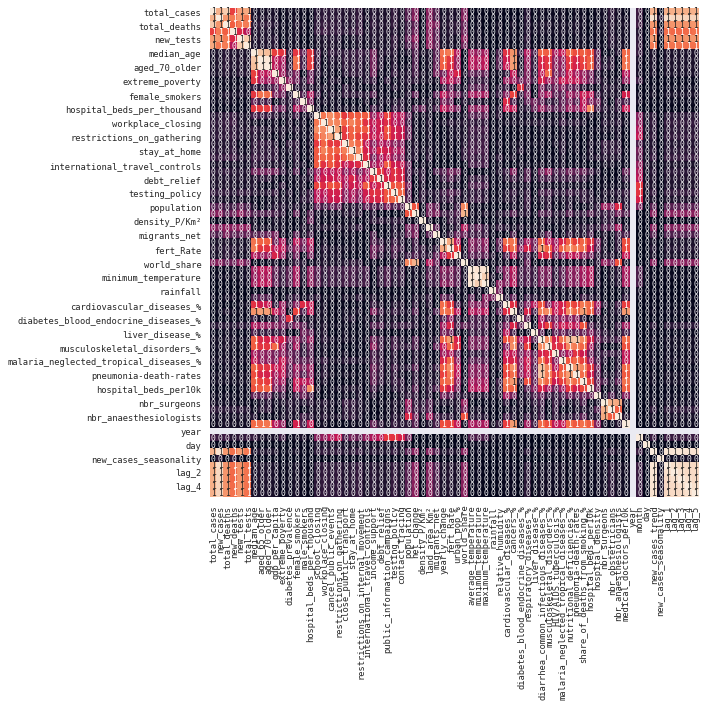

In [ ]:
import matplotlib.pyplot as plt
corrmat = df_model.drop(["Country"], axis=1).corr(method='pearson', min_periods=1000)
# plot absolute values
corrmat = np.abs(corrmat)
sns.set(context="paper", font="monospace")
f, ax = plt.subplots(figsize=(12, 9))
plot=sns.heatmap(corrmat, cbar=False, annot=True, square=True, fmt='.0f', 
            annot_kws={'size': 8})
#plot.savefig('correlation.png')

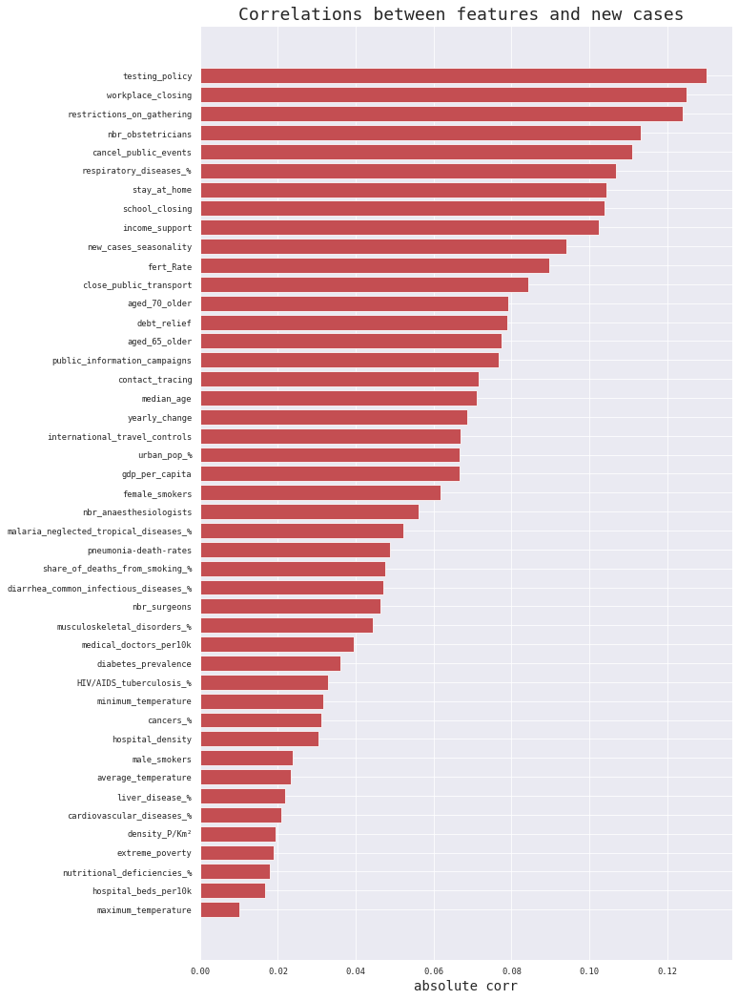

<Figure size 432x288 with 0 Axes>

In [ ]:
remain_num = 50
corr_target = corrmat['new_cases'].reset_index()[:-2]
corr_target.columns = ['feature','abs_corr']
corr_target = corr_target.sort_values(by = 'abs_corr', ascending = True)[:remain_num].loc[corr_target['abs_corr'] >0.01]
ind = np.arange(corr_target.shape[0])
width = 0.9
fig, ax = plt.subplots(figsize=(10,18))
rects = ax.barh(ind, corr_target.abs_corr.values, color='r')
ax.set_yticks(ind)
ax.set_yticklabels(corr_target.feature.values, rotation='horizontal')
ax.set_xlabel("absolute corr", fontsize = 14)
ax.set_title("Correlations between features and new cases ", fontsize = 18)
plt.show()
plt.savefig('correlation with new cases.png')

In [ ]:
import xgboost as xgb
xgb_params = {
    'eta': 0.05,
    'max_depth': 50,
    'subsample': 1.0,
    'colsample_bytree': 0.7,
    'objective': 'reg:linear',
    'eval_metric': 'rmse',
    'silent': 1
}
dtrain = xgb.DMatrix(X_train, y_train, feature_names=X_train.columns.values)
model = xgb.train(dict(xgb_params, silent=0), dtrain, num_boost_round=50)
remain_num = 50

[09:29:41] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


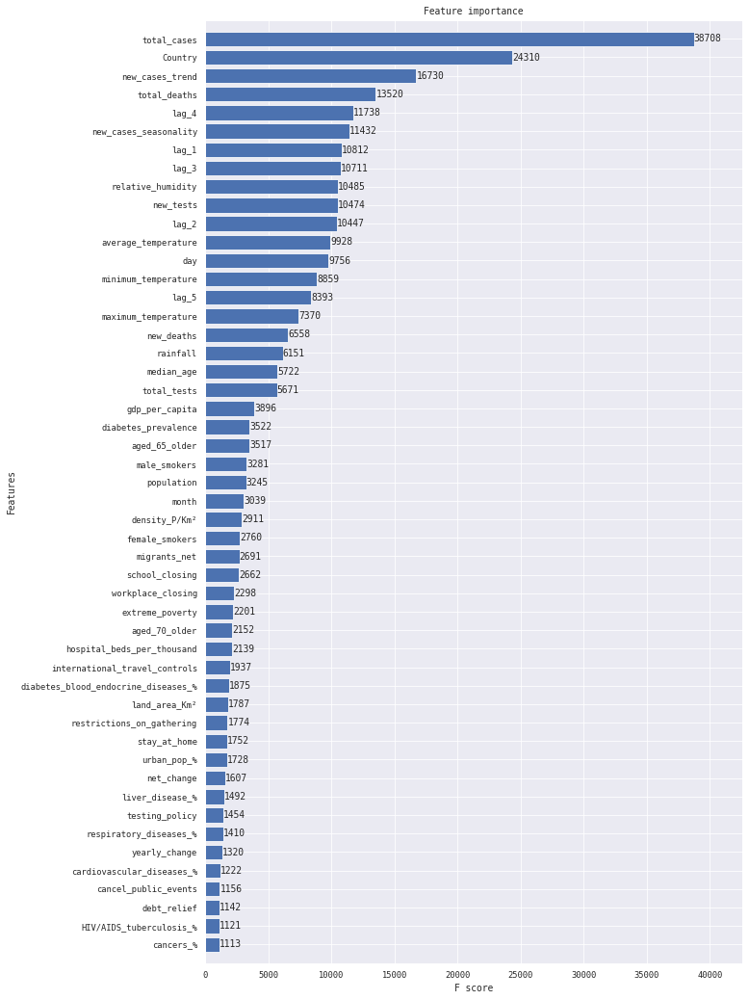

In [ ]:
fig, ax = plt.subplots(figsize=(10,18))
xgb.plot_importance(model, max_num_features=remain_num, height=0.8, ax=ax)
plt.show()
#plt.savefig('XGBoost.png')

# XGBoost Regressor

### Model Fitting

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
import xgboost as xgb
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
import xgboost as xgb
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
xg_reg = xgb.XGBRegressor(objective ='reg:squarederror', colsample_bytree = 0.3, learning_rate = 0.5,
                max_depth = 10, alpha = 10, n_estimators = 1)
eval_set = [(X_test, y_test)]
xg_reg.fit(X_train,y_train, eval_metric="error", eval_set=eval_set, verbose=True)
kfold = KFold(n_splits=10, random_state=0)
results = cross_val_score(xg_reg, X_train, y_train, cv=kfold,scoring='r2')
y_pred = xg_reg.predict(X_test)
mse = mean_squared_error(y_pred, y_test)

[0]	validation_0-error:-995.114


In [ ]:
results

In [ ]:
from sklearn.metrics import mean_absolute_error
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
print("RMSE: %f" % (rmse))
mean_absolute_error(y_test, y_pred)

RMSE: 3303.158528


538.3629636484621

In [ ]:
from matplotlib import pyplot
pyplot.subplots(1, figsize=(10,10))
pyplot.boxplot(results, showmeans=True)

In [ ]:
print("R2: %0.2f (+/- %0.2f)" % (results.mean(), results.std() * 2))

In [ ]:
import matplotlib.pyplot as plt

xgb.plot_tree(xg_reg,num_trees=0)
plt.rcParams['figure.figsize'] = [1000, 500]
plt.show()

### Hyper-Parameter Tuning

In [ ]:
#XGBoost hyper-parameter tuning
from sklearn.model_selection import GridSearchCV
def hyperParameterTuning(X_train, y_train):
    param_tuning = {
        'learning_rate': [0.1,0.3,0.5,0.7],
        'max_depth': [3, 5, 7, 10],
        'subsample': [0.5, 0.7],
        'colsample_bytree': [0.5, 0.7],
        'n_estimators' : [40,50, 60],
        'objective': ['reg:squarederror']
    }

    xgb_model = xgb.XGBRegressor()
    kfold = KFold(n_splits=10, random_state=0)
    gsearch = GridSearchCV(estimator = xgb_model,
                           param_grid = param_tuning,                        
                           #scoring = 'neg_mean_absolute_error', #MAE
                           #scoring = 'neg_mean_squared_error',  #MSE
                           scoring='r2',
                           cv = kfold,
                           #eval_metric=["auc", "error", "error@0.6"],
                           n_jobs = -1,
                           verbose = 1)

    gsearch.fit(X_train,y_train)

    return gsearch.best_params_


In [ ]:
#hyperParameterTuning(X_train, y_train)

Fitting 5 folds for each of 1728 candidates, totalling 8640 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:   24.0s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:  6.5min
[Parallel(n_jobs=-1)]: Done 792 tasks      | elapsed: 14.9min
[Parallel(n_jobs=-1)]: Done 1242 tasks      | elapsed: 22.3min
[Parallel(n_jobs=-1)]: Done 1792 tasks      | elapsed: 32.9min
[Parallel(n_jobs=-1)]: Done 2442 tasks      | elapsed: 45.7min
[Parallel(n_jobs=-1)]: Done 3192 tasks      | elapsed: 60.3min
[Parallel(n_jobs=-1)]: Done 4042 tasks      | elapsed: 76.9min
[Parallel(n_jobs=-1)]: Done 4992 tasks      | elapsed: 100.2min
[Parallel(n_jobs=-1)]: Done 6042 tasks      | elapsed: 124.2min
[Parallel(n_jobs=-1)]: Done 7192 tasks      | elapsed: 155.1min
[Parallel(n_jobs=-1)]: Done 8442 tasks      | elapsed: 183.5min
[Parallel(n_jobs=-1)]: Done 8640 out of 8640 | elapsed: 191.2min finished


{'colsample_bytree': 0.7,
 'learning_rate': 0.5,
 'max_depth': 10,
 'min_child_weight': 5,
 'n_estimators': 50,
 'objective': 'reg:squarederror',
 'subsample': 0.7}

### Model with Best Parameters

In [ ]:
xg_reg = xgb.XGBRegressor(objective ='reg:squarederror', colsample_bytree = 0.7, learning_rate = 0.5,
                max_depth = 10, n_estimators = 60,subsample= 0.7)
eval_set = [(X_test, y_test)]
kfold = KFold(n_splits=10, random_state=0)
results = cross_val_score(xg_reg, X_train, y_train, cv=kfold,scoring='r2')
xg_reg.fit(X_train,y_train, eval_metric="rmse", eval_set=eval_set, verbose=True)
y_pred = xg_reg.predict(X_test)
mse = mean_squared_error(y_pred, y_test)

[0]	validation_0-rmse:3297.84
[1]	validation_0-rmse:2009.38
[2]	validation_0-rmse:1384.55
[3]	validation_0-rmse:1155.21
[4]	validation_0-rmse:1048.82
[5]	validation_0-rmse:961.313
[6]	validation_0-rmse:932.073
[7]	validation_0-rmse:924.514
[8]	validation_0-rmse:922.643
[9]	validation_0-rmse:919.433
[10]	validation_0-rmse:920.061
[11]	validation_0-rmse:917.415
[12]	validation_0-rmse:919.307
[13]	validation_0-rmse:919.761
[14]	validation_0-rmse:925.034
[15]	validation_0-rmse:922.357
[16]	validation_0-rmse:923.642
[17]	validation_0-rmse:924.831
[18]	validation_0-rmse:923.439
[19]	validation_0-rmse:924.455
[20]	validation_0-rmse:926.552
[21]	validation_0-rmse:926.554
[22]	validation_0-rmse:926.106
[23]	validation_0-rmse:926.608
[24]	validation_0-rmse:927.017
[25]	validation_0-rmse:926.54
[26]	validation_0-rmse:926.406
[27]	validation_0-rmse:926.384
[28]	validation_0-rmse:926.49
[29]	validation_0-rmse:926.637
[30]	validation_0-rmse:927.432
[31]	validation_0-rmse:927.35
[32]	validation_0-rms

In [ ]:
results

array([0.98470047, 0.97685872, 0.97177819, 0.9659824 , 0.97758418,
       0.95846973, 0.97651943, 0.97528921, 0.97113954, 0.98196068])

{'boxes': [<matplotlib.lines.Line2D at 0x7fe1cf261860>],
 'caps': [<matplotlib.lines.Line2D at 0x7fe1cf3aa588>,
 'fliers': [<matplotlib.lines.Line2D at 0x7fe1d9413518>],
 'means': [<matplotlib.lines.Line2D at 0x7fe1d9413860>],
 'medians': [<matplotlib.lines.Line2D at 0x7fe1cf3aab38>],
 'whiskers': [<matplotlib.lines.Line2D at 0x7fe1cf261da0>,
  <matplotlib.lines.Line2D at 0x7fe1cf3aab00>]}

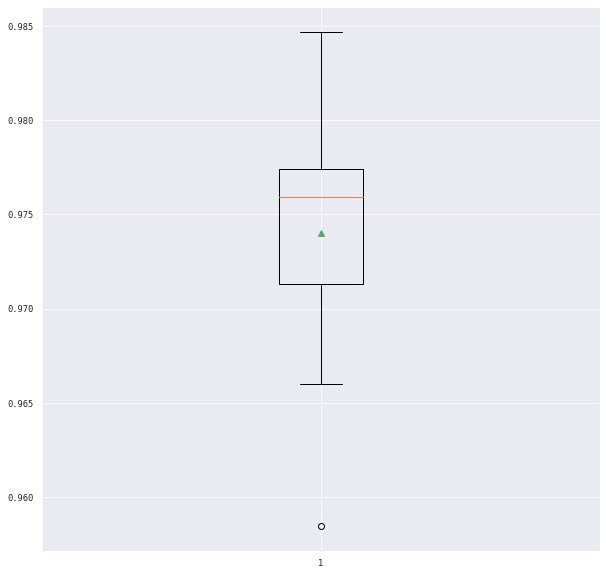

In [ ]:
from matplotlib import pyplot
pyplot.subplots(1, figsize=(10,10))
pyplot.boxplot(results, showmeans=True)

In [ ]:
print("R2: %0.2f (+/- %0.2f)" % (results.mean(), results.std() * 2))

R2: 0.97 (+/- 0.01)


In [ ]:
from sklearn.metrics import mean_absolute_error
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
print("RMSE: %f" % (rmse))
mean_absolute_error(y_test, y_pred)

RMSE: 927.880592


161.7743787946538

In [ ]:
y_test.index

Int64Index([35535,  4396,  8073,   635,  8477, 38772, 59759, 33993, 33822,
            17801,
            ...
            16940, 43210, 50343,  9736, 56675, 21990, 26760, 20301, 38476,
             1342],
           dtype='int64', length=20958)

In [ ]:
y_pred=pd.DataFrame(y_pred, index=y_test.index)

In [ ]:
y_pred.index

Int64Index([35535,  4396,  8073,   635,  8477, 38772, 59759, 33993, 33822,
            17801,
            ...
            16940, 43210, 50343,  9736, 56675, 21990, 26760, 20301, 38476,
             1342],
           dtype='int64', length=20958)

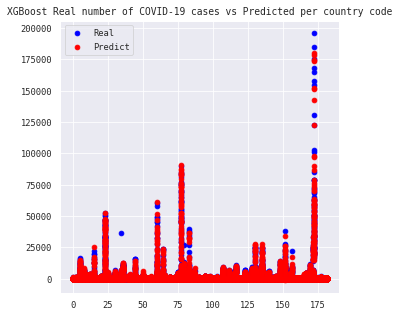

In [ ]:
#Plot Real vs Predict
plt.subplots(1, figsize=(5,5))
plt.scatter(X_test['Country'], y_test,color='blue', label='Real')
plt.scatter(X_test['Country'], y_pred , color='red' , label='Predict')
plt.title("XGBoost Real number of COVID-19 cases vs Predicted per country code")
plt.legend(loc='best')

plt.show()

### Scaling

In [ ]:
target_var='new_cases'
X=df_model.loc[:,df_model.columns!= target_var]
Y= df_model.loc[:,df_model.columns == target_var]
X=X.fillna(0) # to fill nan lags values

In [ ]:
#MinMaxScaler,QuantileTransformer,Normalizer,RobustScaler,StandardScaler
from sklearn.preprocessing import MinMaxScaler,MaxAbsScaler,QuantileTransformer,Normalizer,PowerTransformer,RobustScaler,StandardScaler
X = StandardScaler().fit_transform(X)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X,Y, test_size=0.35)

In [ ]:
# define the grid search parameters
model = xg_reg
kfold = KFold(n_splits=10, random_state=0)
eval_set = [(X_test, y_test)]
kfold = KFold(n_splits=10, random_state=0)
results = cross_val_score(model, X_train, y_train, cv=kfold,scoring='r2')
model.fit(X_train,y_train, verbose=1)
y_pred = model.predict(X_test)
#mse = mean_squared_error(y_pred, y_test)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
print("RMSE: %f" % (rmse))
print("MAE: %f" % (mean_absolute_error(y_test, y_pred)))

RMSE: 913.340305
MAE: 147.952931


In [ ]:
results

array([0.97646778, 0.9711007 , 0.96329687, 0.97229644, 0.97896317,
       0.96831248, 0.96907336, 0.97219455, 0.98188562, 0.97873247])

In [ ]:
print("R2: %0.2f " % (results.mean()))

R2: 0.97 


### Learning Curve

In [ ]:
from sklearn.model_selection import learning_curve

estimator=xg_reg
train_sizes, train_scores, test_scores = learning_curve(estimator, X_test, y_test, cv=10, scoring='neg_mean_squared_error', n_jobs=-1)

In [ ]:
train_scores

array([[  -29.04530724,   -31.49696194,   -31.49696194,   -31.49696194,
          -31.49696194,   -31.49696194,   -31.49696194,   -31.49696194,
          -31.49696194,   -31.49696194],
       [ -372.49119671,  -630.79064264,  -561.79391548,  -561.17191802,
         -561.17191802,  -561.17191802,  -561.17191802,  -561.17191802,
         -561.17191802,  -561.17191802],
       [ -924.39382603,  -714.02699961,  -518.84755721,  -701.85777444,
         -700.71117473,  -679.82079437,  -679.82079437,  -679.82079437,
         -679.82079437,  -679.82079437],
       [-1257.86254438,  -852.10604601, -1348.80240153, -1365.52790135,
        -1438.59336386, -1817.41995266, -1342.03102576, -1032.01986188,
        -1032.01986188, -1032.01986188],
       [-1641.54414956, -1388.55215073, -1726.19406984, -1495.33771219,
        -1534.12325054, -1425.90517887, -1603.07056994, -1122.82732802,
        -1215.12017455, -1410.03844889]])

In [ ]:
train_scores_mean = -train_scores.mean(axis = 1)
test_scores_mean = -test_scores.mean(axis =1 )
print('Mean training scores\n\n', pd.Series(train_scores_mean, index = train_sizes))
print('\n', '-' * 20) # separator
print('\nMean validation scores\n\n',pd.Series(test_scores_mean, index = train_sizes))

Mean training scores

 1934       1.716345
6288     109.570876
10641    298.060108
14995    540.652385
19349    806.582714
dtype: float64

 --------------------

Mean validation scores

 1934     2.553669e+06
6288     1.962481e+06
10641    1.453077e+06
14995    1.154362e+06
19349    1.028261e+06
dtype: float64


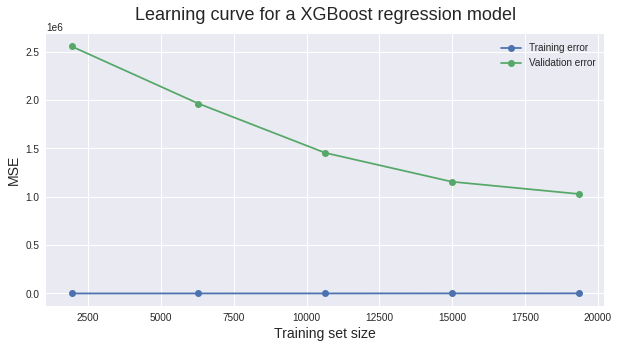

In [ ]:
import matplotlib.pyplot as plt
plt.subplots(1, figsize=(10,5))
plt.style.use('seaborn')
plt.plot(train_sizes, train_scores_mean,'o-', label = 'Training error')
plt.plot(train_sizes, test_scores_mean,'o-', label = 'Validation error')
plt.ylabel('MSE', fontsize = 14)
plt.xlabel('Training set size', fontsize = 14)
plt.title('Learning curve for a XGBoost regression model', fontsize = 18, y = 1.03)
plt.legend()

### Feature Selection

In [ ]:
target_var='new_cases'
X=df_model.loc[:,df_model.columns!= target_var]
Y= df_model.loc[:,df_model.columns == target_var]
X=X.fillna(0) # to fill nan lags values
X_train, X_test, y_train, y_test = train_test_split(X,Y, test_size=0.35)

In [ ]:
xg_reg.feature_importances_

array([2.2165287e-04, 1.1376371e-02, 5.9328496e-04, 4.7176937e-03,
       9.9854963e-04, 2.1175223e-03, 1.6099222e-03, 2.7612341e-04,
       2.6190249e-04, 2.6557254e-04, 1.4111459e-03, 3.0745927e-04,
       3.8426449e-03, 2.0916478e-04, 1.0116085e-03, 4.3202087e-04,
       3.4373402e-04, 3.2501895e-04, 3.2069016e-04, 1.3090124e-04,
       2.0638692e-04, 5.3605905e-05, 9.2225475e-03, 1.0718809e-03,
       3.5605524e-04, 2.6667229e-04, 5.3504150e-04, 1.0153740e-04,
       3.6636856e-04, 8.4490171e-03, 1.1513098e-04, 6.5134669e-04,
       8.9136441e-04, 1.5868247e-04, 3.2168068e-04, 1.7916258e-04,
       3.2888176e-03, 8.8199874e-04, 1.1776489e-03, 1.2330016e-03,
       1.9682562e-03, 1.7477990e-03, 3.6137720e-04, 7.3115812e-03,
       9.3486262e-05, 1.0516757e-04, 8.5277919e-04, 7.9174199e-05,
       1.0611624e-03, 1.7965144e-04, 7.6849893e-04, 2.2684240e-04,
       2.1495890e-04, 4.3719495e-04, 4.0556758e-04, 8.9971453e-04,
       6.6482456e-04, 1.2072214e-03, 1.2477394e-04, 1.4582982e

In [ ]:
from sklearn.feature_selection import SelectFromModel

model = SelectFromModel(estimator=(xg_reg),threshold= 0.001).fit(X_train, y_train)
X_train_new = model.transform(X_train)
X_test_new = model.transform(X_test)
selcted_features = X_train.columns[model.get_support()]
print(X_train_new.shape)
#Selected features
selcted_features=['total_cases', 'total_deaths', 'new_deaths', 'new_tests',
       'diabetes_prevalence', 'female_smokers', 'workplace_closing',
       'cancel_public_events', 'restrictions_on_internal_movement',
       'contact_tracing', 'urban_pop_%', 'rainfall', 'relative_humidity',
       'liver_disease_%', 'diarrhea_common_infectious_diseases_%',
       'musculoskeletal_disorders_%', 'hospital_density', 'nbr_surgeons',
       'new_cases_trend', 'new_cases_seasonality', 'lag_1', 'lag_2', 'lag_3',
       'lag_4', 'lag_5']

(39926, 25)


Index(['total_cases', 'total_deaths', 'new_deaths', 'new_tests',
       'diabetes_prevalence', 'female_smokers', 'workplace_closing',
       'cancel_public_events', 'restrictions_on_internal_movement',
       'contact_tracing', 'urban_pop_%', 'rainfall', 'relative_humidity',
       'liver_disease_%', 'diarrhea_common_infectious_diseases_%',
       'musculoskeletal_disorders_%', 'hospital_density', 'nbr_surgeons',
       'new_cases_trend', 'new_cases_seasonality', 'lag_1', 'lag_2', 'lag_3',
       'lag_4', 'lag_5'],
      dtype='object')

In [ ]:
selcted_features=['total_cases', 'total_deaths', 'new_deaths', 'new_tests',
       'diabetes_prevalence', 'female_smokers', 'workplace_closing',
       'cancel_public_events', 'restrictions_on_internal_movement',
       'contact_tracing', 'urban_pop_%', 'rainfall', 'relative_humidity',
       'liver_disease_%', 'diarrhea_common_infectious_diseases_%',
       'musculoskeletal_disorders_%', 'hospital_density', 'nbr_surgeons',
       'new_cases_trend', 'new_cases_seasonality', 'lag_1', 'lag_2', 'lag_3',
       'lag_4', 'lag_5']

In [ ]:
X=X[selcted_features]
X_train, X_test, y_train, y_test = train_test_split(X,Y, test_size=0.35)

#### Hyper-Parameter Tuning

In [ ]:
hyperParameterTuning(X_train, y_train)

Fitting 3 folds for each of 1728 candidates, totalling 5184 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:   11.8s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:   59.4s
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done 792 tasks      | elapsed:  5.8min
[Parallel(n_jobs=-1)]: Done 1242 tasks      | elapsed:  9.3min
[Parallel(n_jobs=-1)]: Done 1792 tasks      | elapsed: 13.7min
[Parallel(n_jobs=-1)]: Done 2442 tasks      | elapsed: 18.4min
[Parallel(n_jobs=-1)]: Done 3192 tasks      | elapsed: 25.1min
[Parallel(n_jobs=-1)]: Done 4042 tasks      | elapsed: 33.2min
[Parallel(n_jobs=-1)]: Done 4992 tasks      | elapsed: 42.1min
[Parallel(n_jobs=-1)]: Done 5184 out of 5184 | elapsed: 44.7min finished


{'colsample_bytree': 0.7,
 'learning_rate': 0.5,
 'max_depth': 3,
 'min_child_weight': 1,
 'n_estimators': 60,
 'objective': 'reg:squarederror',
 'subsample': 0.7}

#### Model with Best Parameters

In [ ]:
xg_reg_fs = xgb.XGBRegressor(objective ='reg:squarederror', colsample_bytree = 0.7, learning_rate = 0.5,
                max_depth = 3, n_estimators = 60,subsample= 0.7)
eval_set = [(X_test, y_test)]
kfold = KFold(n_splits=10, random_state=0)
results = cross_val_score(xg_reg_fs, X_train, y_train, cv=kfold,scoring='r2')
xg_reg_fs.fit(X_train,y_train, eval_metric="rmse", eval_set=eval_set, verbose=True)
y_pred = xg_reg_fs.predict(X_test)
mse = mean_squared_error(y_pred, y_test)

[0]	validation_0-rmse:3000.06
[1]	validation_0-rmse:1777.56
[2]	validation_0-rmse:1256.44
[3]	validation_0-rmse:1074.19
[4]	validation_0-rmse:988.124
[5]	validation_0-rmse:971.486
[6]	validation_0-rmse:959.031
[7]	validation_0-rmse:962.792
[8]	validation_0-rmse:890.886
[9]	validation_0-rmse:874.196
[10]	validation_0-rmse:847.164
[11]	validation_0-rmse:837.86
[12]	validation_0-rmse:817.858
[13]	validation_0-rmse:818.673
[14]	validation_0-rmse:832.022
[15]	validation_0-rmse:833.789
[16]	validation_0-rmse:829.468
[17]	validation_0-rmse:839.995
[18]	validation_0-rmse:832.081
[19]	validation_0-rmse:836.709
[20]	validation_0-rmse:828.314
[21]	validation_0-rmse:830.695
[22]	validation_0-rmse:822.683
[23]	validation_0-rmse:811.089
[24]	validation_0-rmse:806.793
[25]	validation_0-rmse:806.515
[26]	validation_0-rmse:807.466
[27]	validation_0-rmse:802.295
[28]	validation_0-rmse:802.89
[29]	validation_0-rmse:804.478
[30]	validation_0-rmse:803.139
[31]	validation_0-rmse:801.509
[32]	validation_0-rm

In [ ]:
from sklearn.metrics import mean_absolute_error
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
print("RMSE: %f" % (rmse))
mean_absolute_error(y_test, y_pred)

RMSE: 787.437302


171.83734095459778

In [ ]:
print("R2: %0.2f (+/- %0.2f)" % (results.mean(), results.std() * 2))

R2: 0.98 (+/- 0.01)


#### Scaling

In [ ]:
target_var='new_cases'
X=df_model.loc[:,df_model.columns!= target_var]
Y= df_model.loc[:,df_model.columns == target_var]
X=X.fillna(0) # to fill nan lags values

In [ ]:
#MinMaxScaler,QuantileTransformer,Normalizer,RobustScaler,StandardScaler
from sklearn.preprocessing import MinMaxScaler,MaxAbsScaler,QuantileTransformer,Normalizer,PowerTransformer,RobustScaler,StandardScaler
X = QuantileTransformer().fit_transform(X)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X,Y, test_size=0.35)

In [ ]:
# define the grid search parameters
model = xg_reg_fs
kfold = KFold(n_splits=10, random_state=0)
eval_set = [(X_test, y_test)]
kfold = KFold(n_splits=10, random_state=0)
results = cross_val_score(model, X_train, y_train, cv=kfold,scoring='r2')
model.fit(X_train,y_train, verbose=1)
y_pred = model.predict(X_test)
#mse = mean_squared_error(y_pred, y_test)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
print("RMSE: %f" % (rmse))
print("MAE: %f" % (mean_absolute_error(y_test, y_pred)))

RMSE: 820.211710
MAE: 173.761341


In [ ]:
results

array([0.95993742, 0.96115442, 0.93435486, 0.96203487, 0.97809326,
       0.94660816, 0.97535803, 0.96547442, 0.9742832 , 0.97247802])

In [ ]:
print("R2: %0.2f , " % (results.mean()))

R2: 0.97 , 


#### Learning Curve

In [ ]:
from sklearn.model_selection import learning_curve

estimator=xg_reg_fs
train_sizes, train_scores, test_scores = learning_curve(estimator, X_test[selcted_features], y_test, cv=10, scoring='neg_mean_squared_error', n_jobs=-1)

In [ ]:
train_scores

array([[ -11616.57768046,  -10070.9948646 ,  -10070.9948646 ,
         -10070.9948646 ,  -10070.9948646 ,  -10070.9948646 ,
         -10070.9948646 ,  -10070.9948646 ,  -10070.9948646 ,
         -10070.9948646 ],
       [ -39301.25963491,  -39233.95609453,  -39991.66339176,
         -39464.20164366,  -39464.20164366,  -39464.20164366,
         -39464.20164366,  -39464.20164366,  -39464.20164366,
         -39464.20164366],
       [ -57099.93536726,  -61290.87197083,  -67709.33670631,
         -57472.30202022,  -47226.50646007,  -64835.11691671,
         -64835.11691671,  -64835.11691671,  -64835.11691671,
         -64835.11691671],
       [ -86908.92567141,  -85229.48217232,  -94922.0318151 ,
         -82594.89793458,  -98000.69889151,  -91184.75262147,
         -88883.85013865,  -78413.73984814,  -78413.73984814,
         -78413.73984814],
       [-119171.56494472, -115419.89515812, -115171.19096322,
        -103945.79389037, -100911.43028164,  -95329.98274488,
        -107644.82052692

In [ ]:
train_scores_mean = -train_scores.mean(axis = 1)
test_scores_mean = -test_scores.mean(axis =1 )
print('Mean training scores\n\n', pd.Series(train_scores_mean, index = train_sizes))
print('\n', '-' * 20) # separator
print('\nMean validation scores\n\n',pd.Series(test_scores_mean, index = train_sizes))

Mean training scores

 1934      13151.967272
6288      40955.632060
10641     56782.253795
14995     79842.917245
19349    104455.276845
dtype: float64

 --------------------

Mean validation scores

 1934     1.783604e+06
6288     1.079596e+06
10641    1.010195e+06
14995    9.022042e+05
19349    8.908389e+05
dtype: float64


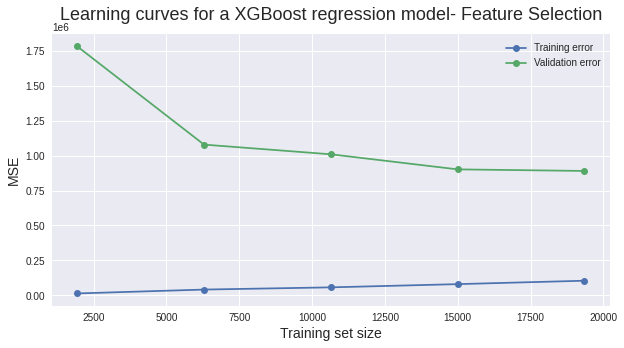

In [ ]:
import matplotlib.pyplot as plt
plt.subplots(1, figsize=(10,5))
plt.style.use('seaborn')
plt.plot(train_sizes, train_scores_mean,'o-', label = 'Training error')
plt.plot(train_sizes, test_scores_mean,'o-', label = 'Validation error')
plt.ylabel('MSE', fontsize = 14)
plt.xlabel('Training set size', fontsize = 14)
plt.title('Learning curves for a XGBoost regression model- Feature Selection', fontsize = 18, y = 1.03)
plt.legend()

# Neural Network Model

### Model Building

In [ ]:
%tensorflow_version 1.x
from sklearn.datasets import make_regression
import keras.backend as K
from keras.models import Sequential
from keras.layers import Dense
from keras.optimizers import SGD,Adagrad,Adam,Adadelta
from matplotlib import pyplot
import tensorflow_probability as tfp
from keras.regularizers import l1
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from sklearn import metrics
from sklearn.preprocessing import StandardScaler
from sklearn import preprocessing
from sklearn.preprocessing import MinMaxScaler,MaxAbsScaler,QuantileTransformer,Normalizer,PowerTransformer,RobustScaler
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from keras.wrappers.scikit_learn import KerasRegressor
from sklearn.model_selection import GridSearchCV


TensorFlow 1.x selected.


Using TensorFlow backend.


In [ ]:
target_var='new_cases'
X=df_model.loc[:,df_model.columns!= target_var]
Y= df_model.loc[:,df_model.columns == target_var]

In [ ]:
X=X.fillna(0)

In [ ]:
X=StandardScaler().fit_transform(X)

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X,Y, test_size=0.35)

In [ ]:
def create_model():
  model = Sequential()
  model.add(Dense(128,input_dim = X_train.shape[1], activation='relu'))
  model.add(Dense(256,activation='relu'))
  model.add(Dense(256,activation='relu'))
  model.add(Dense(1,activation='relu'))
  opt = SGD(lr=0.2,clipnorm=1)
  model.compile(loss='mean_squared_error', optimizer=opt, metrics=['mean_absolute_error'])
  return model

In [ ]:

model=create_model()
history = model.fit(X_train, y_train, epochs=30,verbose=1,validation_data=(X_test, y_test))
test_loss, test_acc = model.evaluate(X_test, y_test,verbose=1)


Epoch 1/30
1244/1244 [==============================] - 3s 2ms/step - loss: 2400764.0000 - mean_absolute_error: 279.7718 - val_loss: 788773.6250 - val_mean_absolute_error: 185.1277
Epoch 2/30
1244/1244 [==============================] - 3s 2ms/step - loss: 1150667.0000 - mean_absolute_error: 216.1662 - val_loss: 1369352.5000 - val_mean_absolute_error: 232.6422
Epoch 3/30
1244/1244 [==============================] - 3s 2ms/step - loss: 945182.2500 - mean_absolute_error: 203.5134 - val_loss: 689286.3125 - val_mean_absolute_error: 220.1533
Epoch 4/30
1244/1244 [==============================] - 3s 2ms/step - loss: 898594.2500 - mean_absolute_error: 194.4483 - val_loss: 704364.4375 - val_mean_absolute_error: 190.0535
Epoch 5/30
1244/1244 [==============================] - 3s 2ms/step - loss: 837154.1250 - mean_absolute_error: 190.3975 - val_loss: 542328.6875 - val_mean_absolute_error: 160.6664
Epoch 6/30
1244/1244 [==============================] - 3s 2ms/step - loss: 774240.7500 - mean_ab

### Parameter Tuning

#### Batch Size and epoch

In [ ]:


model = KerasRegressor(build_fn=create_model, verbose=False)
batch_size =  [60, 80, 100]
epochs = [10,20,30,50, 100]
kfold = KFold(n_splits=10, random_state=0)
param_grid = dict(batch_size=batch_size, epochs=epochs)
grid = GridSearchCV(estimator=model, param_grid=param_grid, n_jobs=-1, cv=kfold,verbose=1)
grid_result = grid.fit(X_train, y_train)
# summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))

Fitting 10 folds for each of 15 candidates, totalling 150 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed: 16.2min
[Parallel(n_jobs=-1)]: Done 150 out of 150 | elapsed: 64.6min finished


Best: -443192.400000 using {'batch_size': 100, 'epochs': 100}


#### Tune the Training Optimization Algorithm

In [ ]:
def tuned_model(optimizer='SGD'):
  model = Sequential()
  model.add(Dense(128,input_dim = X_train.shape[1], activation='relu'))
  model.add(Dense(16,activation='relu'))
  model.add(Dense(16,activation='relu'))
  model.add(Dense(1,activation='relu'))
  model.compile(loss='mean_squared_error', optimizer=optimizer, metrics=['mean_absolute_error'])
  return model

In [ ]:
model = KerasRegressor(build_fn=tuned_model, epochs=100, batch_size=100, verbose=False)
optimizer = ['SGD', 'Adagrad', 'Adam']
param_grid = dict(optimizer=optimizer)
kfold = KFold(n_splits=10, random_state=0)
grid = GridSearchCV(estimator=model, param_grid=param_grid, n_jobs=-1, cv=kfold,verbose=1)
grid_result = grid.fit(X_train, y_train)
# summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))

Fitting 10 folds for each of 3 candidates, totalling 30 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:  9.6min finished


Best: -492511.371875 using {'optimizer': 'Adam'}


#### Tuning Learning rate, neurons, and activation function

In [ ]:
def tuned_model(learn_rate=0.1,neurons=256,activation='relu'):
  model = Sequential()
  model.add(Dense(128,input_dim = X_train.shape[1], activation=activation))
  model.add(Dense(neurons,activation=activation))
  model.add(Dense(neurons,activation=activation))
  model.add(Dense(1,activation=activation))
  opt = Adam(lr=learn_rate)
  model.compile(loss='mean_squared_error', optimizer=opt, metrics=['mean_absolute_error'])
  return model

In [ ]:
# define the grid search parameters
model = KerasRegressor(build_fn=tuned_model, nb_epoch=100, batch_size=100, verbose=False)
learn_rate = [0.08,0.1,0.2, 0.3,0.4,0.5,0.6,0.7,0.8]
activation = ['relu','linear']
neurons = [16,64,128,256]
kfold = KFold(n_splits=10, random_state=0)
param_grid = dict(learn_rate=learn_rate,neurons=neurons,activation=activation)
grid = GridSearchCV(estimator=model, param_grid=param_grid, n_jobs=-1, cv=kfold,scoring='neg_mean_squared_error',verbose=1)
grid_result = grid.fit(X_train, y_train)
# summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))


Fitting 10 folds for each of 72 candidates, totalling 720 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:   37.6s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:  6.6min
[Parallel(n_jobs=-1)]: Done 720 out of 720 | elapsed: 10.1min finished


Best: -1508370.480631 using {'activation': 'relu', 'learn_rate': 0.08, 'neurons': 128}


### Model with Best Parameters

In [ ]:
def tuned_model(learn_rate=0.08,neurons=128,activation='relu'):
  model = Sequential()
  model.add(Dense(128,input_dim = X_train.shape[1], activation=activation))
  model.add(Dense(neurons,activation=activation))
  model.add(Dense(neurons,activation=activation))
  model.add(Dense(1,activation=activation))
  opt = Adam(lr=learn_rate)
  model.compile(loss='mean_squared_error', optimizer=opt, metrics=['mean_absolute_error'])
  return model

In [ ]:
# define the grid search parameters
model = KerasRegressor(build_fn=tuned_model, nb_epoch=100, batch_size=100, verbose=False)
kfold = KFold(n_splits=10, random_state=0)
eval_set = [(X_test, y_test)]
model.fit(X_train,y_train, verbose=1)
kfold = KFold(n_splits=10, random_state=0)
results = cross_val_score(model, X_train, y_train, cv=kfold,scoring='r2')
y_pred = model.predict(X_test)
#mse = mean_squared_error(y_pred, y_test)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
print("RMSE: %f" % (rmse))
print("MAE: %f" % (mean_absolute_error(y_test, y_pred)))

Epoch 1/1
39926/39926 [==============================] - 5s 132us/step - loss: 10115643.9926 - mean_absolute_error: 529.2184
RMSE: 1067.557632
MAE: 261.427412


In [ ]:
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error

rmse = np.sqrt(mean_squared_error(y_test, y_pred))
print("RMSE: %f" % (rmse))
print("MAE: %f" % (mean_absolute_error(y_test, y_pred)))

RMSE: 1109.019840
MAE: 269.083348


In [ ]:
y_pred

array([337.63766 ,  51.779907,  89.28596 , ...,  31.952682,  42.77088 ,
        59.903015], dtype=float32)

In [ ]:
y_test

,new_cases
5359,110.0
24224,53.0
50730,142.0
48001,0.0
48169,7.0
...,...
60283,142.0
8861,49.0
25705,82.0
23388,142.0


In [ ]:
results.mean()

0.9545168565149067

### Scaling

In [ ]:
target_var='new_cases'
X=df_model.loc[:,df_model.columns!= target_var]
Y= df_model.loc[:,df_model.columns == target_var]
X=X.fillna(0)


In [ ]:
#MinMaxScaler,MaxAbsScaler,QuantileTransformer,Normalizer,PowerTransformer,RobustScaler
X = RobustScaler().fit_transform(X)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X,Y, test_size=0.35)

In [ ]:
# define the grid search parameters
model = KerasRegressor(build_fn=tuned_model, nb_epoch=100, batch_size=100, verbose=False)
kfold = KFold(n_splits=10, random_state=0)
eval_set = [(X_test, y_test)]
model.fit(X_train,y_train, verbose=1)
kfold = KFold(n_splits=10, random_state=0)
results = cross_val_score(model, X_train, y_train, cv=kfold,scoring='r2')
y_pred = model.predict(X_test)
#mse = mean_squared_error(y_pred, y_test)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
print("RMSE: %f" % (rmse))
print("MAE: %f" % (mean_absolute_error(y_test, y_pred)))

Epoch 1/1
39926/39926 [==============================] - 6s 145us/step - loss: 3660115.2005 - mean_absolute_error: 323.0254
RMSE: 1014.919543
MAE: 211.903646


In [ ]:
results.mean()

0.11572889180345211

In [ ]:
results.std()

0.013347149599143054

In [ ]:
y_test

,new_cases
27577,0.0
47999,0.0
59411,142.0
56620,1.0
44155,256.0
...,...
30579,242.0
16605,142.0
17997,186.0
32493,142.0


### Learning Curve

In [ ]:
from sklearn.model_selection import learning_curve
estimator=model
train_sizes, train_scores, test_scores = learning_curve(estimator, X_test, y_test, cv=10, scoring='neg_mean_squared_error', n_jobs=-1)

In [ ]:
train_scores_mean = -train_scores.mean(axis = 1)
test_scores_mean = -test_scores.mean(axis =1 )
print('Mean training scores\n\n', pd.Series(train_scores_mean, index = train_sizes))
print('\n', '-' * 20) # separator
print('\nMean validation scores\n\n',pd.Series(test_scores_mean, index = train_sizes))

Mean training scores

 1934     1.580223e+07
6288     2.804098e+06
10641    1.384735e+06
14995    3.976668e+06
19349    1.193642e+06
dtype: float64

 --------------------

Mean validation scores

 1934     2.459256e+07
6288     2.712180e+06
10641    1.638000e+06
14995    3.770221e+06
19349    1.383063e+06
dtype: float64


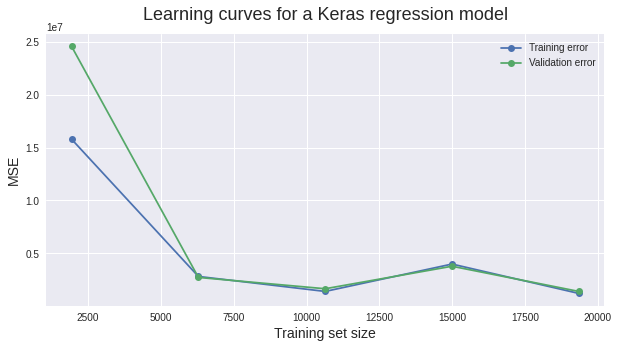

In [ ]:
import matplotlib.pyplot as plt
plt.subplots(1, figsize=(10,5))
plt.style.use('seaborn')
plt.plot(train_sizes, train_scores_mean,'o-', label = 'Training error')
plt.plot(train_sizes, test_scores_mean,'o-', label = 'Validation error')
plt.ylabel('MSE', fontsize = 14)
plt.xlabel('Training set size', fontsize = 14)
plt.title('Learning curves for a Keras regression model', fontsize = 18, y = 1.03)
plt.legend()

### Feature Selection

In [ ]:
from sklearn.feature_selection import SelectFromModel

model = SelectFromModel(estimator=(xg_reg),threshold= 0.001).fit(X_train, y_train)
selcted_features = X_train.columns[model.get_support()]
print(X_train_new.shape)
#Selected features
selcted_features

(39926, 26)


Index(['total_cases', 'new_deaths', 'new_tests', 'total_tests', 'median_age',
       'extreme_poverty', 'female_smokers', 'school_closing',
       'international_travel_controls', 'income_support', 'debt_relief',
       'land_area_Km²', 'minimum_temperature', 'maximum_temperature',
       'relative_humidity', 'liver_disease_%',
       'diarrhea_common_infectious_diseases_%', 'hospital_density',
       'nbr_obstetricians', 'new_cases_trend', 'new_cases_seasonality',
       'lag_1', 'lag_2', 'lag_3', 'lag_4', 'lag_5'],
      dtype='object')

In [ ]:
#final tuning was done on these features
sel=['total_cases', 'new_deaths', 'new_tests', 'total_tests', 'median_age',
       'extreme_poverty', 'female_smokers', 'school_closing',
       'international_travel_controls', 'income_support', 'debt_relief',
       'land_area_Km²', 'minimum_temperature', 'maximum_temperature',
       'relative_humidity', 'liver_disease_%',
       'diarrhea_common_infectious_diseases_%', 'hospital_density',
       'nbr_obstetricians', 'new_cases_trend', 'new_cases_seasonality',
       'lag_1', 'lag_2', 'lag_3', 'lag_4', 'lag_5']

In [ ]:
target_var='new_cases'
X=df_model.loc[:,df_model.columns!= target_var]
Y= df_model.loc[:,df_model.columns == target_var]
X=X.fillna(0)

In [ ]:
X=X[sel]
X

,total_cases,new_deaths,new_tests,total_tests,median_age,extreme_poverty,female_smokers,school_closing,international_travel_controls,income_support,debt_relief,land_area_Km²,minimum_temperature,maximum_temperature,relative_humidity,liver_disease_%,diarrhea_common_infectious_diseases_%,hospital_density,nbr_obstetricians,new_cases_trend,new_cases_seasonality,lag_1,lag_2,lag_3,lag_4,lag_5
0,0.0,0.0,183.0,183.0,18.6,1.2,19.1,0.0,0.0,0.0,0.0,652860.0,0.444444,9.555556,55.903534,0.498116,15.825522,0.085,12431.0,0.000000,5.270376,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,183.0,183.0,18.6,1.2,19.1,0.0,0.0,0.0,0.0,652860.0,-0.805556,6.194444,78.143671,0.498116,15.825522,0.085,12431.0,0.000000,-4.137353,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,183.0,183.0,18.6,1.2,19.1,0.0,0.0,0.0,0.0,652860.0,-2.750000,7.000000,79.131404,0.498116,15.825522,0.085,12431.0,0.000000,4.603855,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,183.0,183.0,18.6,1.2,19.1,0.0,0.0,0.0,0.0,652860.0,-2.166667,5.277778,74.746707,0.498116,15.825522,0.085,12431.0,0.000000,9.818886,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,183.0,183.0,18.6,1.2,19.1,0.0,0.0,0.0,0.0,652860.0,-0.750000,2.944444,84.431231,0.498116,15.825522,0.085,12431.0,0.000000,-12.327077,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61420,8786.0,0.0,848.0,154096.0,19.6,21.4,1.6,1.0,2.0,1.0,0.0,386850.0,24.000000,31.000000,67.135487,0.681232,17.107359,0.078,63.0,65.428571,10.665815,21.0,69.0,29.0,57.0,49.0
61421,8897.0,0.0,875.0,154971.0,19.6,21.4,1.6,4.0,5.0,3.0,3.0,386850.0,24.000000,31.000000,67.135487,0.681232,17.107359,0.078,63.0,70.571429,6.181343,144.0,21.0,69.0,29.0,57.0
61422,8945.0,3.0,1246.0,156217.0,19.6,21.4,1.6,4.0,5.0,3.0,3.0,386850.0,24.000000,31.000000,67.135487,0.681232,17.107359,0.078,63.0,84.183673,1.044225,111.0,144.0,21.0,69.0,29.0
61423,8981.0,1.0,183.0,183.0,19.6,21.4,1.6,4.0,5.0,3.0,3.0,386850.0,24.000000,31.000000,67.135487,0.681232,17.107359,0.078,63.0,90.204082,-6.488124,48.0,111.0,144.0,21.0,69.0


In [ ]:
X = StandardScaler().fit_transform(X)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X,Y, test_size=0.35)

#### Parameter Tuning

##### Batch Size and epoch

In [ ]:
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from keras.wrappers.scikit_learn import KerasRegressor
from sklearn.model_selection import GridSearchCV

model = KerasRegressor(build_fn=create_model, verbose=False)
batch_size =  [60, 80, 100]
epochs = [10,20,30,50, 100]
kfold = KFold(n_splits=10, random_state=0)
param_grid = dict(batch_size=batch_size, epochs=epochs)
grid = GridSearchCV(estimator=model, param_grid=param_grid, n_jobs=-1, cv=kfold,verbose=1)
grid_result = grid.fit(X_train, y_train)
# summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))

Fitting 10 folds for each of 15 candidates, totalling 150 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed: 22.2min
[Parallel(n_jobs=-1)]: Done 150 out of 150 | elapsed: 85.6min finished


Best: -430831.129192 using {'batch_size': 80, 'epochs': 100}


##### Tune the Training Optimization Algorithm

In [ ]:
def tuned_model(optimizer='SGD'):
  model = Sequential()
  model.add(Dense(128,input_dim = X_train.shape[1], activation='relu'))
  model.add(Dense(16,activation='relu'))
  model.add(Dense(16,activation='relu'))
  model.add(Dense(1,activation='relu'))
  model.compile(loss='mean_squared_error', optimizer=optimizer, metrics=['mean_absolute_error'])
  return model

In [ ]:
model = KerasRegressor(build_fn=tuned_model, epochs=100, batch_size=80, verbose=False)
optimizer = ['SGD', 'Adagrad', 'Adam']
param_grid = dict(optimizer=optimizer)
kfold = KFold(n_splits=10, random_state=0)
grid = GridSearchCV(estimator=model, param_grid=param_grid, n_jobs=-1, cv=kfold,verbose=1)
grid_result = grid.fit(X_train, y_train)
# summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))

Fitting 10 folds for each of 3 candidates, totalling 30 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed: 11.5min finished


Best: -523123.177934 using {'optimizer': 'Adam'}


##### Tuning Learning rate, neurons, and activation function

In [ ]:
def tuned_model(learn_rate=0.1,neurons=256,activation='relu'):
  model = Sequential()
  model.add(Dense(128,input_dim = X_train.shape[1], activation=activation))
  model.add(Dense(neurons,activation=activation))
  model.add(Dense(neurons,activation=activation))
  model.add(Dense(1,activation=activation))
  opt = Adam(lr=learn_rate)
  model.compile(loss='mean_squared_error', optimizer=opt, metrics=['mean_absolute_error'])
  return model

In [ ]:
# define the grid search parameters
model = KerasRegressor(build_fn=tuned_model, nb_epoch=100, batch_size=80, verbose=False)
learn_rate = [0.08,0.1,0.2, 0.3,0.4,0.5]
activation = ['relu','linear']
neurons = [16,64,128,256]
kfold = KFold(n_splits=10, random_state=0)
param_grid = dict(learn_rate=learn_rate,neurons=neurons,activation=activation)
grid = GridSearchCV(estimator=model, param_grid=param_grid, n_jobs=-1, cv=kfold,scoring='neg_mean_squared_error',verbose=1)
grid_result = grid.fit(X_train, y_train)
# summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))


Fitting 10 folds for each of 48 candidates, totalling 480 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:   44.3s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:  8.6min
[Parallel(n_jobs=-1)]: Done 480 out of 480 | elapsed:  9.4min finished


Best: -2101493.599973 using {'activation': 'relu', 'learn_rate': 0.1, 'neurons': 128}


#### Model with Best Parameters

In [ ]:
def tuned_model(learn_rate=0.1,neurons=128,activation='relu'):
  model = Sequential()
  model.add(Dense(128,input_dim = X_train.shape[1], activation=activation))
  model.add(Dense(neurons,activation=activation))
  model.add(Dense(neurons,activation=activation))
  model.add(Dense(1,activation=activation))
  opt = Adam(lr=learn_rate)
  model.compile(loss='mean_squared_error', optimizer=opt, metrics=['mean_absolute_error'])
  return model

In [ ]:
# define the grid search parameters
model_fs = KerasRegressor(build_fn=tuned_model, nb_epoch=100, batch_size=80, verbose=False)
kfold = KFold(n_splits=10, random_state=0)
eval_set = [(X_test, y_test)]
model_fs.fit(X_train,y_train, verbose=1)
kfold = KFold(n_splits=10, random_state=0)
results = cross_val_score(model_fs, X_train, y_train, cv=kfold,scoring='r2')
y_pred = model_fs.predict(X_test)
#mse = mean_squared_error(y_pred, y_test)

Instructions for updating:
If using Keras pass *_constraint arguments to layers.

Epoch 1/1
38802/38802 [==============================] - 1s 34us/step - loss: 5385437.1140 - mean_absolute_error: 500.3346


#### Scaling

In [ ]:
target_var='new_cases'
X=df_model.loc[:,df_model.columns!= target_var]
Y= df_model.loc[:,df_model.columns == target_var]
X=X.fillna(0)

In [ ]:
X=X[sel]
X

,total_cases,new_deaths,new_tests,total_tests,median_age,extreme_poverty,female_smokers,school_closing,international_travel_controls,income_support,debt_relief,land_area_Km²,minimum_temperature,maximum_temperature,relative_humidity,liver_disease_%,diarrhea_common_infectious_diseases_%,hospital_density,nbr_obstetricians,new_cases_trend,new_cases_seasonality,lag_1,lag_2,lag_3,lag_4,lag_5
0,0.0,0.0,183.0,183.0,18.6,1.2,19.1,0.0,0.0,0.0,0.0,652860.0,0.444444,9.555556,55.903534,0.498116,15.825522,0.085,12431.0,0.000000,5.270376,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,183.0,183.0,18.6,1.2,19.1,0.0,0.0,0.0,0.0,652860.0,-0.805556,6.194444,78.143671,0.498116,15.825522,0.085,12431.0,0.000000,-4.137353,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,183.0,183.0,18.6,1.2,19.1,0.0,0.0,0.0,0.0,652860.0,-2.750000,7.000000,79.131404,0.498116,15.825522,0.085,12431.0,0.000000,4.603855,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,183.0,183.0,18.6,1.2,19.1,0.0,0.0,0.0,0.0,652860.0,-2.166667,5.277778,74.746707,0.498116,15.825522,0.085,12431.0,0.000000,9.818886,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,183.0,183.0,18.6,1.2,19.1,0.0,0.0,0.0,0.0,652860.0,-0.750000,2.944444,84.431231,0.498116,15.825522,0.085,12431.0,0.000000,-12.327077,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61420,8786.0,0.0,848.0,154096.0,19.6,21.4,1.6,1.0,2.0,1.0,0.0,386850.0,24.000000,31.000000,67.135487,0.681232,17.107359,0.078,63.0,65.428571,10.665815,21.0,69.0,29.0,57.0,49.0
61421,8897.0,0.0,875.0,154971.0,19.6,21.4,1.6,4.0,5.0,3.0,3.0,386850.0,24.000000,31.000000,67.135487,0.681232,17.107359,0.078,63.0,70.571429,6.181343,144.0,21.0,69.0,29.0,57.0
61422,8945.0,3.0,1246.0,156217.0,19.6,21.4,1.6,4.0,5.0,3.0,3.0,386850.0,24.000000,31.000000,67.135487,0.681232,17.107359,0.078,63.0,84.183673,1.044225,111.0,144.0,21.0,69.0,29.0
61423,8981.0,1.0,183.0,183.0,19.6,21.4,1.6,4.0,5.0,3.0,3.0,386850.0,24.000000,31.000000,67.135487,0.681232,17.107359,0.078,63.0,90.204082,-6.488124,48.0,111.0,144.0,21.0,69.0


In [ ]:
#MinMaxScaler,QuantileTransformer,Normalizer,RobustScaler,StandardScaler
X = RobustScaler().fit_transform(X)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X,Y, test_size=0.35)

In [ ]:
# define the grid search parameters
model = KerasRegressor(build_fn=tuned_model, nb_epoch=100, batch_size=80, verbose=False)
kfold = KFold(n_splits=10, random_state=0)
eval_set = [(X_test, y_test)]
model.fit(X_train,y_train, verbose=1)
kfold = KFold(n_splits=10, random_state=0)
results = cross_val_score(model, X_train, y_train, cv=kfold,scoring='r2')
y_pred = model.predict(X_test)
#mse = mean_squared_error(y_pred, y_test)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
print("RMSE: %f" % (rmse))
print("MAE: %f" % (mean_absolute_error(y_test, y_pred)))

Epoch 1/1
39926/39926 [==============================] - 2s 48us/step - loss: 33063107.8163 - mean_absolute_error: 970.7310
RMSE: 5766.123111
MAE: 965.174566


In [ ]:
results

array([ 0.09648816,  0.13524836,  0.27570594, -0.03377407,  0.16734393,
        0.18564865,  0.36141136, -0.03279592,  0.14760497, -0.02604161])

In [ ]:
print("R2: %0.2f %0.2f  " % (results.mean(),results.std()))

R2: 0.27 0.44  


#### Learning Curve

In [ ]:
from sklearn.model_selection import learning_curve
estimator=model_fs
train_sizes, train_scores, test_scores = learning_curve(estimator, X_test[selcted_features], y_test, cv=10, scoring='neg_mean_squared_error', n_jobs=-1)

In [ ]:
train_scores_mean = -train_scores.mean(axis = 1)
test_scores_mean = -test_scores.mean(axis =1 )
print('Mean training scores\n\n', pd.Series(train_scores_mean, index = train_sizes))
print('\n', '-' * 20) # separator
print('\nMean validation scores\n\n',pd.Series(test_scores_mean, index = train_sizes))

Mean training scores

 1880     3.417421e+07
6111     7.168685e+06
10342    7.094190e+06
14573    5.607723e+06
18804    2.440699e+06
dtype: float64

 --------------------

Mean validation scores

 1880     2.397141e+07
6111     8.461718e+06
10342    8.440959e+06
14573    6.671167e+06
18804    3.001822e+06
dtype: float64


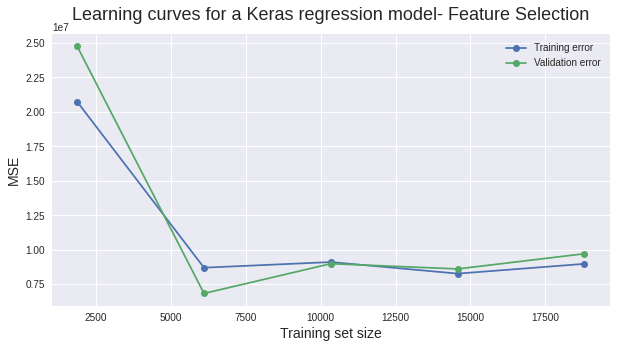

In [ ]:
import matplotlib.pyplot as plt
plt.subplots(1, figsize=(10,5))
plt.style.use('seaborn')
plt.plot(train_sizes, train_scores_mean,'o-', label = 'Training error')
plt.plot(train_sizes, test_scores_mean,'o-', label = 'Validation error')
plt.ylabel('MSE', fontsize = 14)
plt.xlabel('Training set size', fontsize = 14)
plt.title('Learning curves for a Keras regression model- Feature Selection', fontsize = 18, y = 1.03)
plt.legend()

# Regression Tree

In [243]:
from sklearn import svm
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_absolute_error
from matplotlib import pyplot
from sklearn.feature_selection import SelectFromModel
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error
from matplotlib import pyplot
from sklearn.model_selection import GridSearchCV
import matplotlib.pyplot as plt
from matplotlib import pyplot
from sklearn.metrics import mean_absolute_error
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score
from sklearn import metrics
target_var='new_cases'
X=df_model.loc[:,df_model.columns!= target_var]
Y= df_model.loc[:,df_model.columns == target_var]
X_train, X_test, y_train, y_test = train_test_split(X,Y, test_size=0.35)

### Model Fitting

In [246]:
regressor = DecisionTreeRegressor(random_state=0)
regressor.fit(X_train,y_train)
kfold = KFold(n_splits=10, random_state=0)
results = cross_val_score(regressor, X_train, y_train, cv=kfold,scoring='r2')

In [245]:
y_pred = regressor.predict(X_test)

In [ ]:
mse = mean_squared_error(y_pred, y_test)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
mae = mean_absolute_error(y_test, y_pred)
print("MSE: %f" % (mse))
print("RMSE: %f" % (rmse))
print("MAE: %f" % (mae))

MSE: 1293119.125551
RMSE: 1137.153959
MAE: 183.566746


Cross Validation Scores

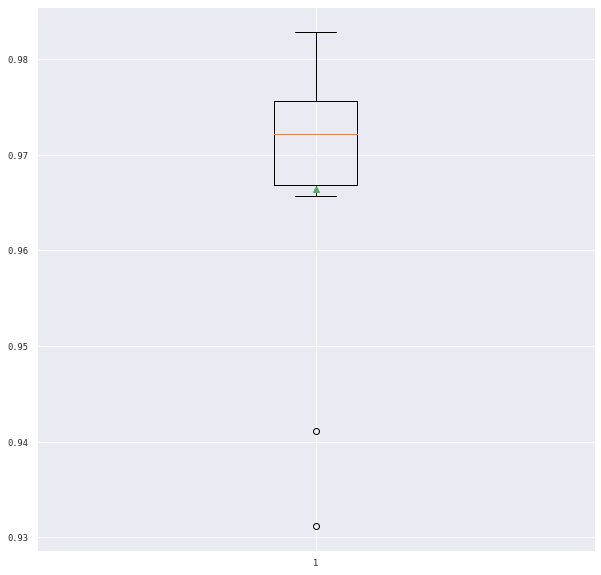

In [ ]:
plt.subplots(1, figsize=(10,10))
plt.boxplot(results, showmeans=True)
plt.rcParams['figure.figsize'] = [1000, 500]
plt.show()

In [ ]:
print(regressor.get_depth())
print(regressor.get_n_leaves())

52
21271


### Hyper-parameter Tuning

In [ ]:
def regressorHyperParameterTuning(X_train, y_train):
    param_tuning = {
        'criterion' : ["mse", "friedman_mse", "mae"],
        'min_weight_fraction_leaf': [0,1],
        # 'ccp_alpha': [0.0, 1],
        # 'min_impurity_decrease': [0.0,1],
        # 'min_samples_leaf': [1,2],
        # 'min_samples_split': [2,4],
        # 'random_state': [0,1],
    }

    reg_model = DecisionTreeRegressor(random_state=0)

    gsearch = GridSearchCV(estimator = reg_model,
                           param_grid = param_tuning,                        
                           scoring='r2',
                           cv = 5,
                           n_jobs = -1,
                           verbose = 1)

    gsearch.fit(X_train,y_train)

    return gsearch.best_params_

tuned = regressorHyperParameterTuning(X_train, y_train)

Fitting 5 folds for each of 6 candidates, totalling 30 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed: 15.1min finished


In [ ]:
# choosen params
tuned

{'criterion': 'mse', 'min_weight_fraction_leaf': 0}

### Model with Best Parameters

In [247]:
# train choosen params
regressor = DecisionTreeRegressor(criterion = 'friedman_mse', min_weight_fraction_leaf = 0, random_state=0)
kfold = KFold(n_splits=10, random_state=0)
regressor.fit(X_train,y_train)
results = cross_val_score(regressor, X_train, y_train, cv=kfold,scoring='r2')
y_pred = regressor.predict(X_test)

In [191]:
print("R2 from cv: %0.2f (+/- %0.2f)" % (results.mean(), results.std() * 2))

mse = mean_squared_error(y_pred, y_test)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
mae = mean_absolute_error(y_test, y_pred)
print("MSE: %f" % (mse))
print("RMSE: %f" % (rmse))
print("MAE: %f" % (mae))

R2 from cv: 0.97 (+/- 0.02)
MSE: 1130658.437325
RMSE: 1063.324239
MAE: 176.582513


Accuracy: 0.96 (+/- 0.03)


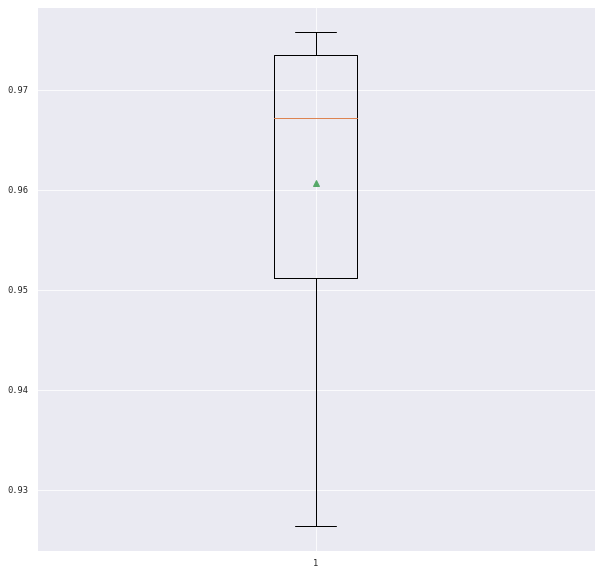

In [ ]:

plt.subplots(1, figsize=(10,10))
plt.boxplot(results, showmeans=True)
print("Accuracy: %0.2f (+/- %0.2f)" % (results.mean(), results.std() * 2))


### Learning Curve

In [248]:
from sklearn.model_selection import learning_curve
estimator = regressor
train_sizes, train_scores, test_scores = learning_curve(estimator, X_test, y_test, cv=10, scoring='neg_mean_squared_error', n_jobs=-1)
train_scores

array([[-0., -0., -0., -0., -0., -0., -0., -0., -0., -0.],
       [-0., -0., -0., -0., -0., -0., -0., -0., -0., -0.],
       [-0., -0., -0., -0., -0., -0., -0., -0., -0., -0.],
       [-0., -0., -0., -0., -0., -0., -0., -0., -0., -0.],
       [-0., -0., -0., -0., -0., -0., -0., -0., -0., -0.]])

In [249]:
train_scores_mean = -train_scores.mean(axis = 1)
test_scores_mean = -test_scores.mean(axis =1 )

print('Mean training scores\n\n', pd.Series(train_scores_mean, index = train_sizes))
print('\n', '-' * 20) # separator
print('\nMean validation scores\n\n',pd.Series(test_scores_mean, index = train_sizes))


Mean training scores

 1891    -0.0
6148    -0.0
10404   -0.0
14661   -0.0
18918   -0.0
dtype: float64

 --------------------

Mean validation scores

 1891     4.644892e+06
6148     2.892233e+06
10404    2.930270e+06
14661    2.203532e+06
18918    1.399144e+06
dtype: float64


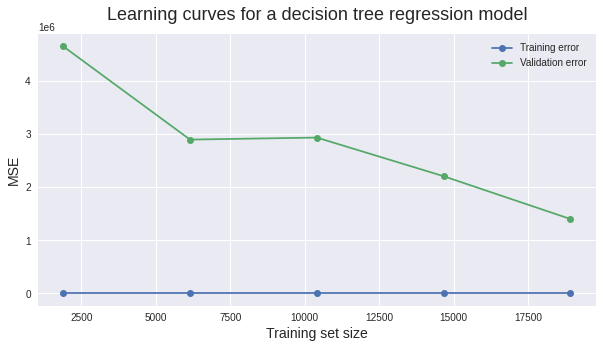

In [250]:
plt.subplots(1, figsize=(10,5))
plt.style.use('seaborn')
plt.plot(train_sizes, train_scores_mean,'o-', label = 'Training error')
plt.plot(train_sizes, test_scores_mean,'o-', label = 'Validation error')
plt.ylabel('MSE', fontsize = 14)
plt.xlabel('Training set size', fontsize = 14)
plt.title('Learning curves for a decision tree regression model', fontsize = 18, y = 1.03)
plt.legend()



### Feature Selection

In [251]:
regressor.feature_importances_

array([2.42702490e-04, 3.09050648e-03, 7.90234927e-04, 4.32521432e-03,
       4.32802371e-05, 2.17294557e-04, 2.53268371e-05, 2.10362113e-05,
       1.47728933e-05, 1.60349263e-04, 1.93547017e-06, 5.79565513e-05,
       1.21923671e-04, 2.39551671e-05, 3.66643956e-06, 1.81812261e-04,
       3.97644866e-05, 1.14661018e-05, 2.66071146e-06, 1.71241938e-06,
       3.07442608e-06, 3.56202839e-06, 7.34393574e-06, 3.49914684e-05,
       1.38949445e-05, 6.57947586e-06, 1.21536980e-05, 5.32627009e-06,
       1.66601420e-05, 1.22008979e-05, 2.03820609e-05, 1.23118135e-05,
       2.89547759e-05, 7.19681705e-06, 7.93973277e-06, 3.18558107e-05,
       4.60301849e-04, 3.88350849e-04, 9.32938158e-05, 1.19731042e-03,
       3.04269211e-04, 6.01877189e-04, 5.24660908e-05, 6.08106693e-06,
       2.11278506e-05, 6.07424399e-06, 1.88576392e-04, 1.23404951e-05,
       1.30711590e-05, 2.76486434e-05, 4.64186185e-06, 2.22728939e-06,
       1.05649005e-05, 1.26286075e-05, 7.69581509e-06, 8.87329463e-05,
      

In [252]:
model = SelectFromModel(estimator=(estimator),threshold= 0.001).fit(X_train, y_train)
X_train_new = model.transform(X_train)
X_test_new = model.transform(X_test)
selcted_features = X_train.columns[model.get_support()]
print(X_train_new.shape)

(39039, 8)


In [253]:
#Selected features
selcted_features

Index(['total_cases', 'new_deaths', 'maximum_temperature', 'new_cases_trend',
       'new_cases_seasonality', 'lag_1', 'lag_2', 'lag_4'],
      dtype='object')

In [254]:
estimator = DecisionTreeRegressor(criterion = 'friedman_mse', min_weight_fraction_leaf = 0, random_state=0)
estimator.fit(X_train[selcted_features],y_train)
kfold = KFold(n_splits=10, random_state=0)
results = cross_val_score(estimator, X_train[selcted_features], y_train, cv=kfold,scoring='r2')
y_pred = estimator.predict(X_test[selcted_features])
results

array([0.96707182, 0.96962237, 0.97906162, 0.93592244, 0.97328129,
       0.95557678, 0.97629673, 0.95968331, 0.97619404, 0.97280939])

In [ ]:
print("R2 from cv: %0.2f (+/- %0.2f)" % (results.mean(), results.std() * 2))

mse = mean_squared_error(y_pred, y_test)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
mae = mean_absolute_error(y_test, y_pred)
print("MSE: %f" % (mse))
print("RMSE: %f" % (rmse))
print("MAE: %f" % (mae))

Accuracy from cv: 0.96 (+/- 0.04)
MSE: 1011272.510059
RMSE: 1005.620460
MAE: 169.412150


Accuracy: 0.96 (+/- 0.04)
RMSE: 1005.620460


169.412150431276

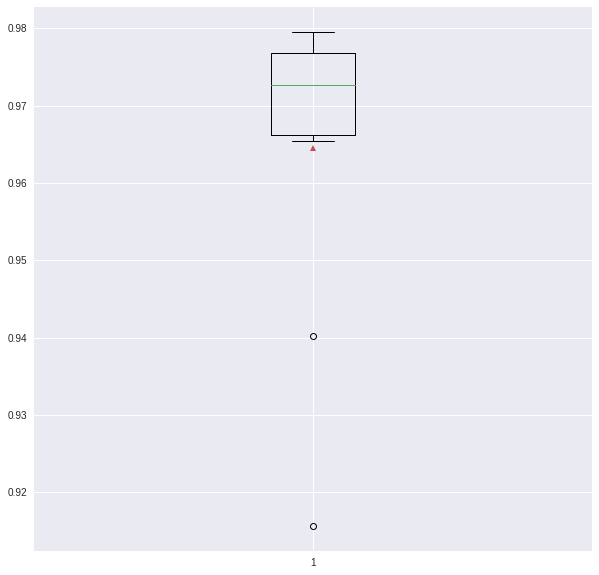

In [ ]:
plt.subplots(1, figsize=(10,10))
plt.boxplot(results, showmeans=True)
print("R2: %0.2f (+/- %0.2f)" % (results.mean(), results.std() * 2))
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
print("RMSE: %f" % (rmse))
mean_absolute_error(y_test, y_pred)

#### Hyper-parameter tuning after feature selection

In [ ]:
tuned_after_fs = regressorHyperParameterTuning(X_train[selcted_features], y_train)

tuned_after_fs

Fitting 5 folds for each of 6 candidates, totalling 30 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:  1.3min finished


{'criterion': 'mae', 'min_weight_fraction_leaf': 0}

#### Model with Best Parameters

In [255]:
regressor = DecisionTreeRegressor(criterion = 'friedman_mse', min_weight_fraction_leaf = 0, random_state=0)
regressor.fit(X_train[selcted_features],y_train)
kfold = KFold(n_splits=10, random_state=0)
results = cross_val_score(regressor, X_train[selcted_features], y_train, cv=kfold,scoring='r2')
y_pred = regressor.predict(X_test[selcted_features])



In [215]:
print("R2 from cv: %0.2f (+/- %0.2f)" % (results.mean(), results.std() * 2))

mse = mean_squared_error(y_pred, y_test)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
mae = mean_absolute_error(y_test, y_pred)
print("MSE: %f" % (mse))
print("RMSE: %f" % (rmse))
print("MAE: %f" % (mae))

R2 from cv: 0.97 (+/- 0.03)
MSE: 1008763.230912
RMSE: 1004.372058
MAE: 177.057086


#### Learning curve after feature selection

Mean training scores

 1891    -0.0
6148    -0.0
10404   -0.0
14661   -0.0
18918   -0.0
dtype: float64

 --------------------

Mean validation scores

 1891     4.121232e+06
6148     2.265122e+06
10404    2.147698e+06
14661    9.357704e+05
18918    1.504369e+06
dtype: float64


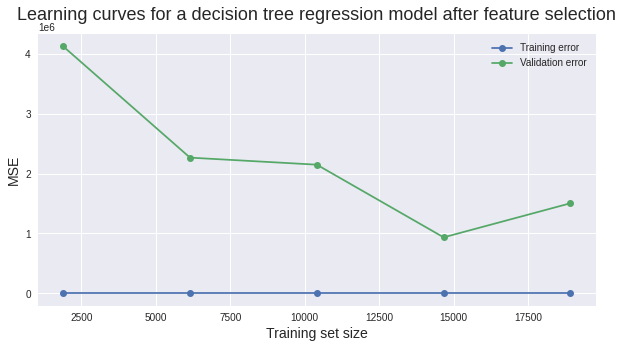

In [256]:
estimator = regressor

train_sizes, train_scores, test_scores = learning_curve(estimator, X_test[selcted_features], y_test, cv=10, scoring='neg_mean_squared_error', n_jobs=-1)
train_scores

train_scores_mean = -train_scores.mean(axis = 1)
test_scores_mean = -test_scores.mean(axis =1 )

print('Mean training scores\n\n', pd.Series(train_scores_mean, index = train_sizes))
print('\n', '-' * 20) # separator
print('\nMean validation scores\n\n',pd.Series(test_scores_mean, index = train_sizes))

plt.subplots(1, figsize=(10,5))
plt.style.use('seaborn')
plt.plot(train_sizes, train_scores_mean,'o-', label = 'Training error')
plt.plot(train_sizes, test_scores_mean,'o-', label = 'Validation error')
plt.ylabel('MSE', fontsize = 14)
plt.xlabel('Training set size', fontsize = 14)
plt.title('Learning curves for a decision tree regression model after feature selection', fontsize = 18, y = 1.03)
plt.legend()



# GradientBoosting

### Model Fitting

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.datasets import make_regression
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
target_var='new_cases'
X=df_model.loc[:,df_model.columns!= target_var]
Y= df_model.loc[:,df_model.columns == target_var]
X_train, X_test, y_train, y_test = train_test_split(X,Y, test_size=0.35)

In [ ]:
reg = GradientBoostingRegressor(loss= 'quantile',learning_rate = 0.5,
                max_depth = 10, n_estimators = 100,verbose = 1)
eval_set = [(X_test, y_test)]

reg.fit(X_train,y_train)
reg.predict(X_test)

reg.score(X_test, y_test)
kfold = KFold(n_splits=10, random_state=1)
results = cross_val_score(reg, X_train, y_train, cv=kfold,scoring='r2',verbose =1)
y_pred = reg.predict(X_test)
mse = mean_squared_error(y_pred, y_test)

In [ ]:
mse

2727736.5133893928

In [ ]:
from sklearn.metrics import mean_absolute_error
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
print("RMSE: %f" % (rmse))
mean_absolute_error(y_test, y_pred)

RMSE: 1651.586060


340.60103898631644

{'boxes': [<matplotlib.lines.Line2D at 0x7f9a6df752b0>],
 'caps': [<matplotlib.lines.Line2D at 0x7f9a6df75d68>,
 'fliers': [<matplotlib.lines.Line2D at 0x7f9a6df6dc50>],
 'means': [<matplotlib.lines.Line2D at 0x7f9a6df6d8d0>],
 'medians': [<matplotlib.lines.Line2D at 0x7f9a6df6d518>],
 'whiskers': [<matplotlib.lines.Line2D at 0x7f9a6df755f8>,
  <matplotlib.lines.Line2D at 0x7f9a6df759b0>]}

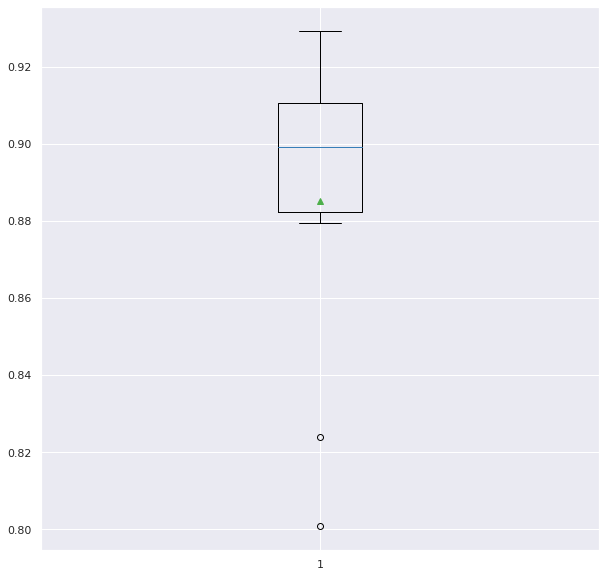

In [ ]:
from matplotlib import pyplot
pyplot.subplots(1, figsize=(10,10))
pyplot.boxplot(results, showmeans=True)

In [ ]:
print("R2: %0.2f (+/- %0.2f)" % (results.mean(), results.std() * 2))

R2: 0.89 (+/- 0.08)


### Hyper-parameter tuning

In [ ]:
from sklearn.model_selection import GridSearchCV
def hyperParameterTuning(X_train, y_train):
    param_tuning = {
        'learning_rate': [0.1,0.3,0.5,0.7],
        'max_depth': [3, 5, 7, 10],
        'subsample': [0.5, 0.7],
        'loss': ['quantile'],
        'n_estimators' : [100, 200, 500],
        'random_state':[1],
    }

    GBR=GradientBoostingRegressor()
    kfold = KFold(n_splits=3, random_state=0)
    gsearch = GridSearchCV(estimator = GBR,
                           param_grid = param_tuning,                        
                           #scoring = 'neg_mean_absolute_error', #MAE
                           #scoring = 'neg_mean_squared_error',  #MSE
                           scoring='r2',
                           cv = kfold,
                           #eval_metric=["auc", "error", "error@0.6"],
                           n_jobs = 10,
                           verbose = 1)

    gsearch.fit(X_train,y_train)

    return gsearch.best_params_


In [ ]:
hyperParameterTuning(X_train, y_train)

Fitting 3 folds for each of 96 candidates, totalling 288 fits


[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:  8.0min
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed: 80.3min
[Parallel(n_jobs=10)]: Done 288 out of 288 | elapsed: 137.6min finished


{'learning_rate': 0.1,
 'loss': 'quantile',
 'max_depth': 10,
 'n_estimators': 500,
 'random_state': 1,
 'subsample': 0.7}

### Model With Best Parameters

In [ ]:
reg = GradientBoostingRegressor(loss= 'quantile',learning_rate = 0.1,
                max_depth = 10, n_estimators = 500,subsample= 0.7,verbose = 1)
eval_set = [(X_test, y_test)]

reg.fit(X_train,y_train)
reg.predict(X_test)

reg.score(X_test, y_test)
kfold = KFold(n_splits=10, random_state=1)
results = cross_val_score(reg, X_train, y_train, cv=kfold,scoring='r2',verbose =1)
y_pred = reg.predict(X_test)
mse = mean_squared_error(y_pred, y_test)

{'boxes': [<matplotlib.lines.Line2D at 0x7f9a6fe2eda0>],
 'caps': [<matplotlib.lines.Line2D at 0x7f9a6fd1b898>,
 'fliers': [<matplotlib.lines.Line2D at 0x7f9a6fd04780>],
 'means': [<matplotlib.lines.Line2D at 0x7f9a6fd04400>],
 'medians': [<matplotlib.lines.Line2D at 0x7f9a6fd04048>],
 'whiskers': [<matplotlib.lines.Line2D at 0x7f9a6fd1b128>,
  <matplotlib.lines.Line2D at 0x7f9a6fd1b4e0>]}

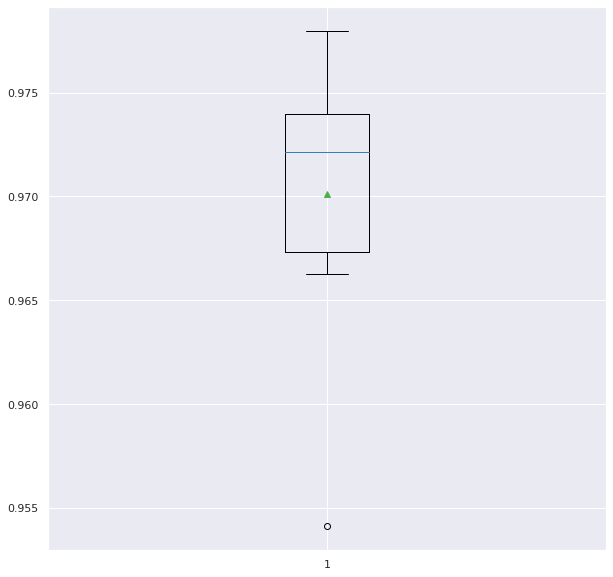

In [ ]:
from matplotlib import pyplot
pyplot.subplots(1, figsize=(10,10))
pyplot.boxplot(results, showmeans=True)

In [ ]:
print("R2: %0.2f (+/- %0.2f)" % (results.mean(), results.std() * 2))

R2: 0.97 (+/- 0.01)


In [ ]:
mse

718372.1779320162

In [ ]:
from sklearn.metrics import mean_absolute_error
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
print("RMSE: %f" % (rmse))
mean_absolute_error(y_test, y_pred)

RMSE: 847.568391


207.05582697366717

### Learning Curve

In [ ]:
from sklearn.model_selection import learning_curve

estimator=reg
train_sizes, train_scores, test_scores = learning_curve(estimator, X_test, y_test, cv=10, scoring='neg_mean_squared_error', n_jobs=-1)

In [ ]:
train_scores_mean = -train_scores.mean(axis = 1)
test_scores_mean = -test_scores.mean(axis =1 )
print('Mean training scores\n\n', pd.Series(train_scores_mean, index = train_sizes))
print('\n', '-' * 20) # separator
print('\nMean validation scores\n\n',pd.Series(test_scores_mean, index = train_sizes))

Mean training scores

 1874     371221.625849
6092     343787.524963
10310    296517.181197
14528    323418.219487
18747    315325.086454
dtype: float64

 --------------------

Mean validation scores

 1874     4.806236e+06
6092     2.275342e+06
10310    1.334114e+06
14528    1.156450e+06
18747    1.059074e+06
dtype: float64


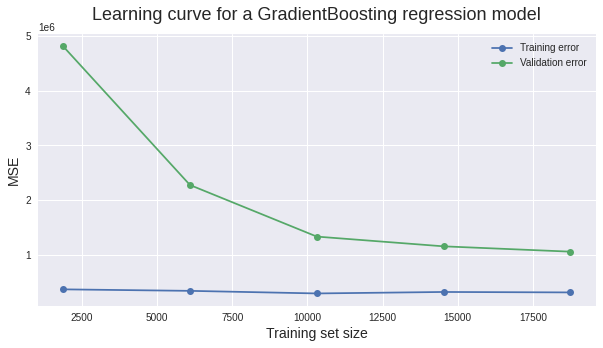

In [ ]:
import matplotlib.pyplot as plt
plt.subplots(1, figsize=(10,5))
plt.style.use('seaborn')
plt.plot(train_sizes, train_scores_mean,'o-', label = 'Training error')
plt.plot(train_sizes, test_scores_mean,'o-', label = 'Validation error')
plt.ylabel('MSE', fontsize = 14)
plt.xlabel('Training set size', fontsize = 14)
plt.title('Learning curve for a GradientBoosting regression model', fontsize = 18, y = 1.03)
plt.legend()

### Scaling

In [ ]:
target_var='new_cases'
X=df_model.loc[:,df_model.columns!= target_var]
Y= df_model.loc[:,df_model.columns == target_var]
X=X.fillna(0) # to fill nan lags values

In [ ]:
#MinMaxScaler,QuantileTransformer,Normalizer,RobustScaler,StandardScaler
from sklearn.preprocessing import MinMaxScaler,MaxAbsScaler,QuantileTransformer,Normalizer,PowerTransformer,RobustScaler,StandardScaler


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X,Y, test_size=0.35)
model = StandardScaler().fit(X_train)
X_train = model.transform(X_train)
X_test = model.transform(X_test)

In [ ]:
# define the grid search parameters
model = reg

kfold = KFold(n_splits=3, random_state=0)
results = cross_val_score(model, X_train, y_train, cv=kfold,scoring='r2')
model.fit(X_train,y_train)
y_pred = model.predict(X_test)
#mse = mean_squared_error(y_pred, y_test)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
print("RMSE: %f" % (rmse))
print("MAE: %f" % (mean_absolute_error(y_test, y_pred)))

      Iter       Train Loss      OOB Improve   Remaining Time 
         1         630.9668         169.0756            3.11m
         2         495.6305         124.2168            3.28m
         3         414.1501          88.7844            3.60m
         4         345.3263          68.2063            3.83m
         5         305.5371          62.2657            3.87m
         6         246.7092          42.1706            3.75m
         7         211.9804          33.9053            3.66m
         8         185.6891          27.7742            3.63m
         9         154.4221          25.2255            3.54m
        10         133.6743          18.7077            3.50m
        20          44.5651           2.7918            3.35m
        30          30.9249           0.3567            3.50m
        40          25.1408           0.1265            3.55m
        50          22.7444           0.2744            3.54m
        60          20.9982           0.0964            3.46m
       

In [ ]:
print("R2: %0.2f " % (results.mean()))

R2: 0.97 


### Feature Selection

In [ ]:
target_var='new_cases'
X=df_model.loc[:,df_model.columns!= target_var]
Y= df_model.loc[:,df_model.columns == target_var]
X=X.fillna(0) # to fill nan lags values

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X,Y, test_size=0.35)

In [ ]:
from sklearn.feature_selection import SelectKBest, f_regression

model = SelectKBest(f_regression, k=30)
X_train_new = model.fit_transform(X_train,y_train)
print(X_train.shape)
#Selected features
#selcted_features

(38802, 70)


In [ ]:
X_test_new = model.transform(X_test)
selcted_features = X_train.columns[model.get_support()]
#Selected features
selcted_features

Index(['total_cases', 'total_deaths', 'new_deaths', 'new_tests', 'total_tests',
       'school_closing', 'workplace_closing', 'cancel_public_events',
       'restrictions_on_gathering', 'close_public_transport', 'stay_at_home',
       'restrictions_on_internal_movement', 'income_support', 'debt_relief',
       'testing_policy', 'population', 'net_change', 'land_area_Km²',
       'migrants_net', 'world_share', 'respiratory_diseases_%',
       'nbr_obstetricians', 'month', 'new_cases_trend',
       'new_cases_seasonality', 'lag_1', 'lag_2', 'lag_3', 'lag_4', 'lag_5'],
      dtype='object')

In [ ]:
sel= ['total_cases', 'total_deaths', 'new_deaths', 'new_tests', 'total_tests',
       'school_closing', 'workplace_closing', 'cancel_public_events',
       'restrictions_on_gathering', 'close_public_transport', 'stay_at_home',
       'restrictions_on_internal_movement', 'income_support', 'debt_relief',
       'testing_policy', 'population', 'net_change', 'land_area_Km²',
       'migrants_net', 'world_share', 'respiratory_diseases_%',
       'nbr_obstetricians', 'month', 'new_cases_trend',
       'new_cases_seasonality', 'lag_1', 'lag_2', 'lag_3', 'lag_4', 'lag_5']

In [ ]:
target_var='new_cases'
X=df_model.loc[:,df_model.columns!= target_var]
Y= df_model.loc[:,df_model.columns == target_var]
X=X.fillna(0)

In [ ]:
X=X[sel]
X

,total_cases,total_deaths,new_deaths,new_tests,total_tests,school_closing,workplace_closing,cancel_public_events,restrictions_on_gathering,close_public_transport,stay_at_home,restrictions_on_internal_movement,income_support,debt_relief,testing_policy,population,net_change,land_area_Km²,migrants_net,world_share,respiratory_diseases_%,nbr_obstetricians,month,new_cases_trend,new_cases_seasonality,lag_1,lag_2,lag_3,lag_4,lag_5
0,0.0,0.0,0.0,183.0,183.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,38928341.0,886592.0,652860.0,-62920.0,0.50,1.963170,12431.0,1,0.000000,5.292075,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,183.0,183.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,38928341.0,886592.0,652860.0,-62920.0,0.50,1.963170,12431.0,1,0.000000,-3.388776,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,183.0,183.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,38928341.0,886592.0,652860.0,-62920.0,0.50,1.963170,12431.0,1,0.000000,5.513960,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,183.0,183.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,38928341.0,886592.0,652860.0,-62920.0,0.50,1.963170,12431.0,1,0.000000,10.031763,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,183.0,183.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,38928341.0,886592.0,652860.0,-62920.0,0.50,1.963170,12431.0,1,0.000000,-13.253735,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59691,8981.0,261.0,1.0,183.0,183.0,4.0,4.0,3.0,5.0,3.0,4.0,3.0,3.0,3.0,4.0,14862927.0,217456.0,386850.0,-116858.0,0.19,2.377705,63.0,11,76.714286,-6.825192,48.0,111.0,151.0,21.0,69.0
59692,9046.0,265.0,4.0,183.0,183.0,4.0,4.0,3.0,5.0,3.0,4.0,3.0,3.0,3.0,4.0,14862927.0,217456.0,386850.0,-116858.0,0.19,2.377705,63.0,11,76.714286,2.630735,36.0,48.0,111.0,151.0,21.0
59693,9120.0,265.0,0.0,183.0,183.0,4.0,4.0,3.0,5.0,3.0,4.0,3.0,3.0,3.0,4.0,14862927.0,217456.0,386850.0,-116858.0,0.19,2.377705,63.0,11,80.520408,-11.276994,65.0,36.0,48.0,111.0,151.0
59694,9172.0,265.0,0.0,183.0,183.0,4.0,4.0,3.0,5.0,3.0,4.0,3.0,3.0,3.0,4.0,14862927.0,217456.0,386850.0,-116858.0,0.19,2.377705,63.0,11,82.795918,-4.173433,74.0,65.0,36.0,48.0,111.0


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X,Y, test_size=0.35)

#### Hyper-parameter tuning with FS

In [ ]:
hyperParameterTuning(X_train, y_train)

Fitting 3 folds for each of 96 candidates, totalling 288 fits


[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:  3.9min
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed: 36.8min
[Parallel(n_jobs=10)]: Done 288 out of 288 | elapsed: 63.3min finished


{'learning_rate': 0.1,
 'loss': 'quantile',
 'max_depth': 10,
 'n_estimators': 500,
 'random_state': 1,
 'subsample': 0.7}

#### Model With Best Parameters

In [ ]:
reg = GradientBoostingRegressor(loss= 'quantile',learning_rate = 0.01,
                max_depth = 10, n_estimators = 1000,subsample= 0.9,verbose = 1)
eval_set = [(X_test, y_test)]

reg.fit(X_train,y_train)
reg.predict(X_test)

reg.score(X_test, y_test)
kfold = KFold(n_splits=3, random_state=1)
results = cross_val_score(reg, X_train, y_train, cv=kfold,scoring='r2',verbose =1)
y_pred = reg.predict(X_test)
mse = mean_squared_error(y_pred, y_test)

      Iter       Train Loss      OOB Improve   Remaining Time 
         1         741.4358          18.6114            5.12m
         2         727.1127          17.5057            5.84m
         3         713.4323          16.3888            5.54m
         4         695.5676          17.1586            5.75m
         5         675.0536          17.4010            5.77m
         6         648.7656          13.2308            5.88m
         7         638.2106          14.6604            6.09m
         8         611.7555          15.1541            6.05m
         9         601.1719          14.6491            6.18m
        10         593.2921          11.9471            6.30m
        20         482.8365           8.5784            6.64m
        30         405.4579           6.8610            6.76m
        40         334.7735           5.7041            6.80m
        50         287.6756           4.6712            6.70m
        60         235.6822           2.8630            6.57m
       

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


      Iter       Train Loss      OOB Improve   Remaining Time 
         1         731.5614          22.6302            3.75m
         2         713.2081          17.2886            3.63m
         3         711.1160          18.1119            3.61m
         4         658.7325          17.8829            3.60m
         5         650.4233          17.9621            3.50m
         6         646.1431          19.2015            3.69m
         7         625.7910          18.7896            3.77m
         8         620.2873          11.6858            3.85m
         9         595.8031          14.5485            3.89m
        10         594.8496          13.2374            3.92m
        20         471.4505           9.7519            4.15m
        30         389.5515           7.3869            4.21m
        40         326.0849           6.5787            4.21m
        50         276.4178           4.7823            4.12m
        60         228.2622           4.2251            4.06m
       

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed: 13.8min finished


{'boxes': [<matplotlib.lines.Line2D at 0x7f26689b3d30>],
 'caps': [<matplotlib.lines.Line2D at 0x7f26689d7828>,
 'fliers': [<matplotlib.lines.Line2D at 0x7f26689ab710>],
 'means': [<matplotlib.lines.Line2D at 0x7f26689ab390>],
 'medians': [<matplotlib.lines.Line2D at 0x7f26689d7f98>],
 'whiskers': [<matplotlib.lines.Line2D at 0x7f26689d70b8>,
  <matplotlib.lines.Line2D at 0x7f26689d7470>]}

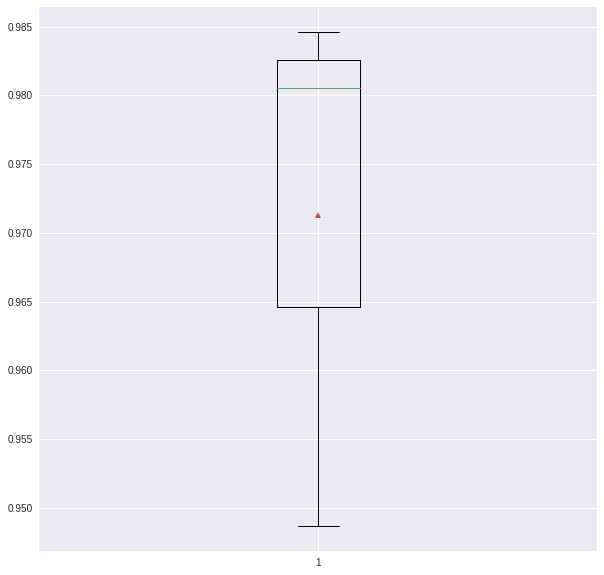

In [ ]:
from matplotlib import pyplot
pyplot.subplots(1, figsize=(10,10))
pyplot.boxplot(results, showmeans=True)

In [ ]:
print("R2: %0.2f (+/- %0.2f)" % (results.mean(), results.std() * 2))

R2: 0.97 (+/- 0.03)


In [ ]:
mse

732192.8543829212

In [ ]:
from sklearn.metrics import mean_absolute_error
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
print("RMSE: %f" % (rmse))
mean_absolute_error(y_test, y_pred)

RMSE: 855.682683


160.67866204857637

#### Learning Curve

In [ ]:
from sklearn.model_selection import learning_curve

estimator=reg
train_sizes, train_scores, test_scores = learning_curve(estimator, X_test[selcted_features], y_test, cv=10, scoring='neg_mean_squared_error', n_jobs=-1)

In [ ]:
train_scores_mean = -train_scores.mean(axis = 1)
test_scores_mean = -test_scores.mean(axis =1 )
print('Mean training scores\n\n', pd.Series(train_scores_mean, index = train_sizes))
print('\n', '-' * 20) # separator
print('\nMean validation scores\n\n',pd.Series(test_scores_mean, index = train_sizes))

Mean training scores

 1880     36926.400972
6111     46733.920283
10342    57432.842948
14573    66472.580386
18804    76469.876386
dtype: float64

 --------------------

Mean validation scores

 1880     1.948862e+06
6111     1.272893e+06
10342    1.075240e+06
14573    9.816139e+05
18804    8.951307e+05
dtype: float64


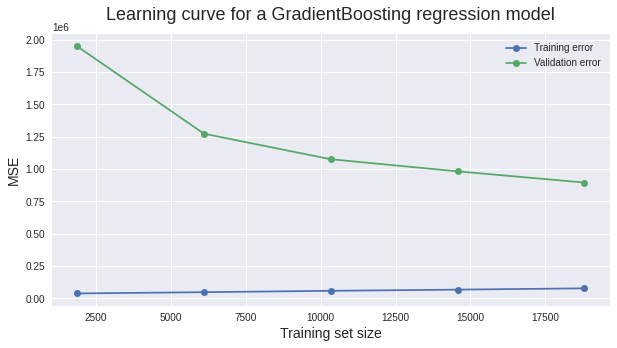

In [ ]:
import matplotlib.pyplot as plt
plt.subplots(1, figsize=(10,5))
plt.style.use('seaborn')
plt.plot(train_sizes, train_scores_mean,'o-', label = 'Training error')
plt.plot(train_sizes, test_scores_mean,'o-', label = 'Validation error')
plt.ylabel('MSE', fontsize = 14)
plt.xlabel('Training set size', fontsize = 14)
plt.title('Learning curve for a GradientBoosting regression model', fontsize = 18, y = 1.03)
plt.legend()

#### Scaling

In [ ]:
target_var='new_cases'
X=df_model.loc[:,df_model.columns!= target_var]
Y= df_model.loc[:,df_model.columns == target_var]
X=X.fillna(0) # to fill nan lags values
X=X[sel]

In [ ]:
#MinMaxScaler,QuantileTransformer,Normalizer,RobustScaler,StandardScaler
from sklearn.preprocessing import MinMaxScaler,MaxAbsScaler,QuantileTransformer,Normalizer,PowerTransformer,RobustScaler,StandardScaler


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X,Y, test_size=0.35)
model = StandardScaler().fit(X_train)
X_train = model.transform(X_train)
X_test = model.transform(X_test)


In [ ]:
# define the grid search parameters
model = reg

kfold = KFold(n_splits=3, random_state=0)
results = cross_val_score(model, X_train, y_train, cv=kfold,scoring='r2')
model.fit(X_train,y_train)
y_pred = model.predict(X_test)
#mse = mean_squared_error(y_pred, y_test)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
print("RMSE: %f" % (rmse))
print("MAE: %f" % (mean_absolute_error(y_test, y_pred)))

      Iter       Train Loss      OOB Improve   Remaining Time 
         1         761.4434          20.4913            5.28m
         2         756.8319          17.0866            5.27m
         3         726.6693          17.5939            5.21m
         4         696.2118          15.5123            5.20m
         5         667.6392          16.2826            5.22m
         6         665.5500          17.5376            5.09m
         7         657.3116          14.4576            5.10m
         8         638.9204          13.6274            5.10m
         9         644.2329          14.8738            5.11m
        10         621.3590          14.8548            5.07m
        20         493.1964          10.3035            4.94m
        30         405.3702           8.0009            4.94m
        40         329.8635           7.2101            4.92m
        50         284.4842           2.8745            4.85m
        60         244.2402           2.8186            4.79m
       

In [ ]:
print("R2: %0.2f " % (results.mean()))

R2: 0.98 
